<h1><p><center style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 210%;text-align: center;border-radius: 10px 70px">
      Data-Centric Ensemble Machine Learning Framework for Predicting and Optimizing MEA Power Density in PEMFC

      

</center></p></h1>

<div style="border-radius: 5px;
           -webkit-border-radius: 5px;
           -moz-border-radius: 5px;
           font-family: cursive;
           border: 3px solid #008000;
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Objective</p>
  <p style="text-align: justify;">Development of high-performance MEAs for PEMFCs by identifying critical features, predicting power density, and optimizing design without trial-and-error.</p>

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Issues in the Dataset</p>
  <ul>
    <li><b>Missing Values:</b> Present across various columns, requiring imputation.</li>
    <li><b>High Dimensionality:</b> Over 100 features, some irrelevant/redundant.</li>
    <li><b>Mixed Data Types:</b> Numerical and categorical variables need preprocessing.</li>
    <li><b>Imbalanced Data:</b> Skewed target or feature distributions may bias models.</li>
    <li><b>Correlated Features:</b> Multicollinearity can affect linear models.</li>
    <li><b>Outliers:</b> Can skew predictions (e.g., high specific activity).</li>
    <li><b>Complex Relationships:</b> Non-linear physics demands advanced models.</li>
  </ul>

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Why Stacking & Voting Regressors?</p>
  <ul>
    <li><b>Stacking:</b> Trains diverse base models and a meta-model to learn from them for better generalization.</li>
    <li><b>Voting:</b> Aggregates base model predictions to reduce overfitting and variance.</li>
    <li>Suitable for capturing non-linear, high-dimensional relationships while boosting robustness.</li>
  </ul>

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">ML Pipeline Solution</p>
  <ul>
    <li><b>Data Preprocessing:</b>
      <ul>
        <li>Impute missing values (mean/median for numeric, mode for categorical).</li>
        <li>Encode categorical variables (e.g., One-Hot or Target Encoding).</li>
        <li>Normalize numeric values (e.g., StandardScaler).</li>
      </ul>
    </li>
    <li><b>Feature Engineering:</b>
      <ul>
        <li>Drop irrelevant features (e.g., Title, Authors).</li>
        <li>Use PCA/Kernel PCA for dimensionality reduction.</li>
        <li>Log-transform skewed features (e.g., current density).</li>
      </ul>
    </li>
    <li><b>Outlier/Imbalance Handling:</b>
      <ul>
        <li>Use transformations or capping for outliers.</li>
        <li>Apply weighting or SMOTE for imbalanced targets.</li>
      </ul>
    </li>
    <li><b>Base Models:</b>  Random Forest, Gradient Boosting (XGBoost/LightGBM).</li>
    <li><b>Meta-Model (for stacking):</b> XGBoost for blending predictions.</li>
    <li><b>Voting Regressor:</b> Combine predictions via (weighted) averaging from top base models.</li>
  </ul>

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Model Pipeline Summary- Regression</p>
  <table style="width:100%; border-collapse: collapse; font-size: 13px;">
    <tr style="background-color: #d0f0c0;">
      <th style="border: 1px solid green;">Model</th>
      <th style="border: 1px solid green;">Hyperparameters</th>
      <th style="border: 1px solid green;">Goal</th>
    </tr>
    <tr>
      <td style="border: 1px solid green;">Decision Tree</td>
      <td style="border: 1px solid green;">max_depth, min_samples_split</td>
      <td style="border: 1px solid green;">Avoid overfitting</td>
    </tr>
    <tr>
      <td style="border: 1px solid green;">Random Forest</td>
      <td style="border: 1px solid green;">n_estimators, max_features</td>
      <td style="border: 1px solid green;">Balance bias-variance</td>
    </tr>
    <tr>
     <td style="border: 1px solid green;">Gradient Boost</td>
      <td style="border: 1px solid green;">n_estimators, max_features</td>
      <td style="border: 1px solid green;">Balance bias-variance</td>
    </tr>
    <tr>
      <td style="border: 1px solid green;">XGBoost</td>
      <td style="border: 1px solid green;">learning_rate, gamma, lambda</td>
      <td style="border: 1px solid green;">Handle imbalanced data</td>
    </tr>
    <tr>
      <td style="border: 1px solid green;">LightGBM</td>
      <td style="border: 1px solid green;">num_leaves, feature_fraction</td>
      <td style="border: 1px solid green;">Speed + accuracy</td>
    </tr>
    <tr>
      <td style="border: 1px solid green;">CatBoost</td>
      <td style="border: 1px solid green;">depth, l2_leaf_reg</td>
      <td style="border: 1px solid green;">Categorical feature robustness</td>
    </tr>
  </table>

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Hyperparameter Tuning</p>
  <ul>
    <li>GridSearchCV to the  Optimization with cross-validation ( 5-fold).</li>
  </ul>

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Expected Outcomes</p>
  <ul>
    <li><b>Performance Prediction:</b> Stacked/Voting models aim to outperform Linera Regression baseline (RMSE < 148.3 mW/cm²).</li>
    <li><b>Parameter Optimization:</b> Leverage PSO/GA to approach literature target (~1545.9 mW/cm²).</li>
  </ul>

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Why This Works</p>
  <ul>
    <li><b>PCA:</b> Reduces dimensionality while preserving key patterns.</li>
    <li><b>Ensemble Models:</b> Capture non-linear interactions and reduce overfitting.</li>
    <li><b>Pipeline Approach:</b> Ensures scalable, interpretable, and reproducible workflow.</li>
  </ul>

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Model Evaluation</p>
  <ul>
    <li><b>Regression:</b> RMSE, R² – Target RMSE &lt; 150 mW/cm².</li>
    <li><b>Interpretability:</b> Tree-based rules, SHAP to highlight feature impact.</li>
  </ul>
  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Develop</p>
  <ul>
    <li><b>Develop:</b> used Streamlit to present and develop models.</li>
    <ul>
</div>

<a class="anchor" id="setup"></a>
<br>
<br>
<br>
<font style="font-family:Gabriola; font-size:300%;">1️⃣ Step 1 | About Dataset </font><br>
 <br>   
<br>

<div style="border-radius: 5px;
           -webkit-border-radius: 5px;
           -moz-border-radius: 5px;
           font-family: cursive;
           border: 3px solid #008000;
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">
<p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold"> About Dataset </p>
<p style="text-align: justify; font-family: cursive; font-size: 14px; color : black">
This dataset contains detailed information on Proton Exchange Membrane Fuel Cell (PEMFC) catalysts, including composition, synthesis methods, structural properties, and performance metrics from around 800 artilces that was gathered.  The data spans research from 2003 to 2020 across multiple countries</p>

<li><b>Catalyst Composition:</b> Atomic percentages of Pt, Pd, Au, Ir, Ru, Ni, Co, Fe; metal loadings; carbon supports like CNTs, graphene, XC-72R</li>
<li><b>Synthesis Parameters:</b> Reduction temperatures/times, reducing agents (NaBH₄, EG, formic acid), annealing conditions, heating methods (microwave/conventional)</li>
<li><b>Structural Features:</b> Particle sizes, core-shell/nanowire/nanocage structures, BET surface areas</li>
<li><b>Performance Metrics:</b> ECSA, mass/specific activity, half-wave/onset potentials, MPD (100–2000 mW/cm²), V-I curves</li>
<li><b>MEA Fabrication:</b> Ionomer/catalyst ratios, membrane types/thicknesses, hot press conditions</li>

<p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Potential Analyses</p>
<li><b>Performance Prediction:</b> Predict MPD from synthesis and composition using ML; analyze factors affecting mass activity and half-wave potential</li>
<li><b>Material Optimization:</b> Link alloy compositions and carbon supports to catalytic performance</li>
<li><b>Comparative Studies:</b> Compare synthesis methods and catalyst structures (e.g., core-shell vs alloy)</li>
<li><b>Process Optimization:</b> Find optimal synthesis temperatures, times, and annealing setups</li>

<p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Notable Insights</p>
<li>Diverse catalyst types: pure Pt, PtNi, PtCo, PtRuFe alloys</li>
<li>Varied support materials: Vulcan XC-72R, graphene, CNTs</li>
<li>Synthesis techniques: chemical reduction, microwave, sputtering</li>
<li>MPD values range widely: ~100 to over 2000 mW/cm²</li>
</div>

<a class="anchor" id="setup"></a>
<br>
<br>
<br>
<font style="font-family:Gabriola; font-size:300%;">2️⃣ Step 2 |  Libraries  </font><br>
 <br>   
<br>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, KFold,RepeatedKFold,cross_validate
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, mean_squared_error, r2_score, mean_absolute_error,make_scorer
from sklearn.model_selection import cross_val_score, KFold,GridSearchCV
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier, GradientBoostingRegressor,   ExtraTreesRegressor
from sklearn.ensemble import StackingRegressor, VotingRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from xgboost import XGBClassifier, XGBRegressor
from lightgbm import LGBMClassifier, LGBMRegressor
from catboost import CatBoostClassifier, CatBoostRegressor
from sklearn.ensemble import AdaBoostRegressor
import lightgbm as lgbm
from lightgbm import LGBMRegressor
from sklearn.decomposition import PCA
import warnings 
warnings.filterwarnings('ignore')


<h1><p><center style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px">
      Data Loading  
</center></p></h1>

In [2]:
data = pd.read_csv(r'D:\Chemical Engineering\Chemical Engineering\Softeware\ML\PEMFC simulation\Project 2\database.csv', encoding='latin1')
df = data.copy()

In [4]:
df.head()

,Title,Corresponding author,country,institute,Year,Sample Name,Pt at% in metal element,Pd at% in metal element,Au at% in metal element,Ir at% in metal element,...,Voltage 2100mA cm0,Voltage 2200mA cm0,Voltage 2300mA cm0,Voltage 2400mA cm0,Voltage 2500mA cm0,Voltage 2600mA cm0,Voltage 2700mA cm0,Voltage 2800mA cm0,Voltage 2900mA cm0,Voltage 3000mA cm0
0,"Microwave assisted, facile synthesis of Pt/CNT...",ShaneethMuliankeezhu,India,Vikram Sarabhai Space Centre,2017.0,Pt/CNT-MWH,100.0,0.0,0.0,0.0,...,0.01000,0.01000,0.0100,0.01,0.01000,0.01,0.01,0.01,0.01,0.01
1,"Microwave assisted, facile synthesis of Pt/CNT...",ShaneethMuliankeezhu,India,Vikram Sarabhai Space Centre,2017.0,Pt/CNT-CH,100.0,0.0,0.0,0.0,...,0.01000,0.01000,0.0100,0.01,0.01000,0.01,0.01,0.01,0.01,0.01
2,Durability investigation and performance study...,Soosan Rowshanzamir,Iran,Iran University of Science and Technology,2017.0,Pt/MWCNT,100.0,0.0,0.0,0.0,...,0.01000,0.01000,0.0100,0.01,0.01000,0.01,0.01,0.01,0.01,0.01
3,Rapid microwave-assisted solvothermal synthesi...,Haixu Yan,china,Tongji University,2018.0,Pt-Ni/C,38.3,0.0,0.0,0.0,...,0.01000,0.01000,0.0100,0.01,0.01000,0.01,0.01,0.01,0.01,0.01
4,Nitrogen doped mesoporous carbon supported Pt ...,G. Ranga Rao,India,Indian Institute of Technology Madras,2018.0,Pt/NMC-1,100.0,0.0,0.0,0.0,...,0.11656,0.09092,0.0677,NaN,0.02725,0.01,0.01,0.01,0.01,0.01


<h1><p><center style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px">
      Basic Understanding Data  
</center></p></h1>

In [5]:
df.shape

(797, 110)

<p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">
<div style="border-radius: 5px;
           -webkit-border-radius: 5px;
           -moz-border-radius: 5px;
           font-family: cursive;
           border: 3px solidrgb(0, 90, 128);
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF"><span>Obervation :</span><br>
    <ul>
        <li>This dataset includes the details of <b>799</b> samples</li>
        <li>The number of features for the dataframe is equal to <b>110</b></li>
    </ul></div>

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 799 entries, 0 to 798
Columns: 110 entries, Title to Voltage 3000mA cm0
dtypes: float64(92), int64(10), object(8)
memory usage: 686.8+ KB


In [6]:
df.columns

Index(['Title', 'Corresponding author', 'country', 'institute', 'Year',
       'Sample Name', 'Pt at% in metal element', 'Pd at% in metal element',
       'Au at% in metal element', 'Ir at% in metal element',
       ...
       'Voltage 2100mA cm0', 'Voltage 2200mA cm0', 'Voltage 2300mA cm0',
       'Voltage 2400mA cm0', 'Voltage 2500mA cm0', 'Voltage 2600mA cm0',
       'Voltage 2700mA cm0', 'Voltage 2800mA cm0', 'Voltage 2900mA cm0',
       'Voltage 3000mA cm0'],
      dtype='object', length=110)

###  Checking NaN values in our Dataset.

In [7]:
df.isnull().sum().to_frame().rename(columns={0:"Total No. of Missing Values"})

,Total No. of Missing Values
Title,0
Corresponding author,4
country,0
institute,2
Year,1
...,...
Voltage 2600mA cm0,0
Voltage 2700mA cm0,0
Voltage 2800mA cm0,0
Voltage 2900mA cm0,0


<div style="border-radius: 5px;
           -webkit-border-radius: 5px;
           -moz-border-radius: 5px;
           font-family: cursive;
           border: 3px solid rgb(21, 128, 0);
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">
<p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Observation:</p>
<ul>
    <li><b>Corresponding author:</b> 4 missing — Flag as "Unknown" or exclude.</li>
    <li><b>Institute:</b> 4 missing — Pair with author; if one is missing, drop both.</li>
    <li><b>Year:</b> 1 missing — Impute with median year or investigate source.</li>
    <li><b>Unnamed: 124:</b> 97 missing — Drop column (no analytical value).</li>
    <li><b>General:</b> We can observe that none of the features have more than <b>9</b> missing values, indicating good data completeness.</li>
</ul>
</div>

###  Checking Duplicate Values.

In [8]:
print("Duplicate Values =",df.duplicated().sum())

Duplicate Values = 0


<p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">
<div style="border-radius: 5px;
           -webkit-border-radius: 5px;
           -moz-border-radius: 5px;
           font-family: cursive;
           border: 3px solidrgb(0, 90, 128);
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF"><span>Obervation :</span><br>
    <ul>
        <li>From the above output we can say that there is <b>0</b> </li>
    </ul></div>

###  Showing Categorical & Numerical Features.

In [9]:
df.dtypes 

Title                    object
Corresponding author     object
country                  object
institute                object
Year                    float64
                         ...   
Voltage 2600mA cm0      float64
Voltage 2700mA cm0      float64
Voltage 2800mA cm0      float64
Voltage 2900mA cm0      float64
Voltage 3000mA cm0      float64
Length: 110, dtype: object

In [10]:
# dtermainr which one is flaot and boolan
df.dtypes[df.dtypes != 'object']

Year                       float64
Pt at% in metal element    float64
Pd at% in metal element    float64
Au at% in metal element    float64
Ir at% in metal element    float64
                            ...   
Voltage 2600mA cm0         float64
Voltage 2700mA cm0         float64
Voltage 2800mA cm0         float64
Voltage 2900mA cm0         float64
Voltage 3000mA cm0         float64
Length: 102, dtype: object

In [26]:
len(df.dtypes[df.dtypes != 'object'])

102

In [12]:
df.dtypes[df.dtypes == 'object']

Title                                        object
Corresponding author                         object
country                                      object
institute                                    object
Sample Name                                  object
carbon substrate type                        object
Reducing agent( chemical name in english)    object
Membrane                                     object
dtype: object

In [11]:
df.select_dtypes(include="object").head()

,Title,Corresponding author,country,institute,Sample Name,carbon substrate type,Reducing agent( chemical name in english),Membrane
0,"Microwave assisted, facile synthesis of Pt/CNT...",ShaneethMuliankeezhu,India,Vikram Sarabhai Space Centre,Pt/CNT-MWH,CNTs,NaBH4,nafion 115
1,"Microwave assisted, facile synthesis of Pt/CNT...",ShaneethMuliankeezhu,India,Vikram Sarabhai Space Centre,Pt/CNT-CH,CNTs,NaBH4,nafion 115
2,Durability investigation and performance study...,Soosan Rowshanzamir,Iran,Iran University of Science and Technology,Pt/MWCNT,CNTs,glycerol,nafion 117
3,Rapid microwave-assisted solvothermal synthesi...,Haixu Yan,china,Tongji University,Pt-Ni/C,XC-72R,ethylene glycol,nafion 211
4,Nitrogen doped mesoporous carbon supported Pt ...,G. Ranga Rao,India,Indian Institute of Technology Madras,Pt/NMC-1,home-made nitrogen-doped carbon,ethylene glycol,nafion 212


In [28]:
# Fixing column names if necessary (strip whitespace)
df.columns = df.columns.str.strip()

# Separate features by type
categorical_cols = df.select_dtypes(include=['object']).columns
numerical_cols = df.select_dtypes(exclude=['object']).columns

# Output the counts
print(f"Number of categorical features: {len(categorical_cols)}")
print(f"Number of numerical features: {len(numerical_cols)}")

Number of categorical features: 8
Number of numerical features: 102


<div style="border-radius: 5px;
           -webkit-border-radius: 5px;
           -moz-border-radius: 5px;
           font-family: cursive;
           border: 3px solid rgb(0, 128, 38);
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">
<p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Observation :</p>
<ul>
    <li>From the output above, we observe that the dataset contains <b>8 categorical</b> and <b>102 numerical</b> features initially.</li>
    <li>However, some features such as 'carbon substrate type                        objectYear' seem to be incorrectly parsed due to formatting or header issues.</li>
    <li>After stripping and cleaning column names, correct datatypes can be detected reliably.</li>
</ul>
</div>

###   Descriptive Statistics Analysis.

In [29]:
df.describe()

,Year,Pt at% in metal element,Pd at% in metal element,Au at% in metal element,Ir at% in metal element,Ru at% in metal element,Ni at% in metal element,Co at% in metal element,Fe at% in metal element,Mn at% in metal element,...,Voltage 2100mA cm0,Voltage 2200mA cm0,Voltage 2300mA cm0,Voltage 2400mA cm0,Voltage 2500mA cm0,Voltage 2600mA cm0,Voltage 2700mA cm0,Voltage 2800mA cm0,Voltage 2900mA cm0,Voltage 3000mA cm0
count,898.000000,899.000000,899.000000,899.000000,896.000000,899.000000,899.000000,899.000000,899.000000,899.000000,...,898.000000,894.000000,899.000000,897.000000,899.000000,899.000000,899.000000,899.000000,899.000000,899.000000
mean,2014.014477,86.612024,5.104227,0.496169,0.459286,0.587098,1.561933,4.255032,1.390145,0.006963,...,0.205335,0.192370,0.180067,0.169292,0.158631,0.149272,0.140251,0.132619,0.125884,0.119638
std,4.661186,23.274854,19.992635,4.376277,4.898231,5.069945,8.340274,12.206226,7.329672,0.208783,...,0.203923,0.199153,0.194072,0.189511,0.185042,0.180961,0.176896,0.173317,0.169619,0.166413
min,2003.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.001840
25%,2011.000000,75.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000
50%,2015.000000,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.150520,0.131385,0.110630,0.089150,0.067510,0.049950,0.029100,0.011900,0.010000,0.010000
75%,2018.000000,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.370000,0.350000,0.327225,0.300000,0.280000,0.260050,0.244350,0.225390,0.207930,0.194690
max,2020.000000,100.000000,100.000000,50.000000,100.000000,50.000000,76.700000,90.000000,59.322034,6.260000,...,0.782030,0.781040,0.780090,0.779150,0.778240,0.777340,0.776460,0.775590,0.774740,0.773910


In [13]:
df.describe().loc[['count','min', 'mean', '25%', '50%', '75%', 'max']].T.style.background_gradient(axis=1).format(precision = 2)

,count,min,mean,25%,50%,75%,max
Year,798.00,2003.00,2014.38,2012.00,2015.00,2018.00,2020.00
Pt at% in metal element,799.00,0.00,86.95,75.00,100.00,100.00,100.00
Pd at% in metal element,799.00,0.00,5.68,0.00,0.00,0.00,100.00
Au at% in metal element,799.00,0.00,0.56,0.00,0.00,0.00,50.00
Ir at% in metal element,796.00,0.00,0.24,0.00,0.00,0.00,100.00
Ru at% in metal element,799.00,0.00,0.53,0.00,0.00,0.00,50.00
Ni at% in metal element,799.00,0.00,1.57,0.00,0.00,0.00,76.70
Co at% in metal element,799.00,0.00,3.69,0.00,0.00,0.00,90.00
Fe at% in metal element,799.00,0.00,1.33,0.00,0.00,0.00,59.32
Mn at% in metal element,799.00,0.00,0.01,0.00,0.00,0.00,6.26


### Veryfing Columns 

In [15]:
df['Membrane'].value_counts()

Membrane
nafion 212         370
nafion 115          95
nafion 112          90
nafion 211          66
not-mentioned       40
nafion 117          31
Gore membrane       27
Asahi Kasei         14
PFSA                12
nafion 1035         11
nafion HP            8
Nafion 212           8
Nafion HP            4
Nafion XL            4
nafion XL            3
nafion212            3
nafion 1135          3
Nafion 112           1
SPEEK/Pt-Cs2.5       1
Nafion 115           1
Nafion1135/TiO2      1
Nafion112/TiO2       1
Nafion115/TiO2       1
Nafion?XL            1
nafion d2020         1
Name: count, dtype: int64

In [14]:
df['Reducing agent( chemical name in english)'].value_counts()

Reducing agent( chemical name in english)
ethylene glycol                      380
NaBH4                                 89
none                                  81
oleylamine                            33
formic acid                           32
electro deposition                    30
formaldehyde                          22
sputter                               13
hydrogen peroxide                     12
electrospary deposition               11
ascorbic acid                         11
1,2-propylene glycol                  10
glycerol                               9
1,2 hexadecanediol                     7
acetonitrile                           7
morpholine borane                      6
sodium formate                         5
dimethylformamide                      4
N,N-dimethylformamide                  3
displacement reaction                  3
Dimethylformamide                      3
ethanol                                3
Borane tert-butylamine                 2
dual ion-beam a

In [16]:
df['Sample Name'].value_counts()

Sample Name
Pt/C           75
100            53
PtCo/C         11
Pt/GCS          8
Pt/Co/HSAC      8
               ..
PtCo NW/C       1
0.479166667     1
0.888888889     1
66:34:00        1
Pt95Pd5         1
Name: count, Length: 398, dtype: int64

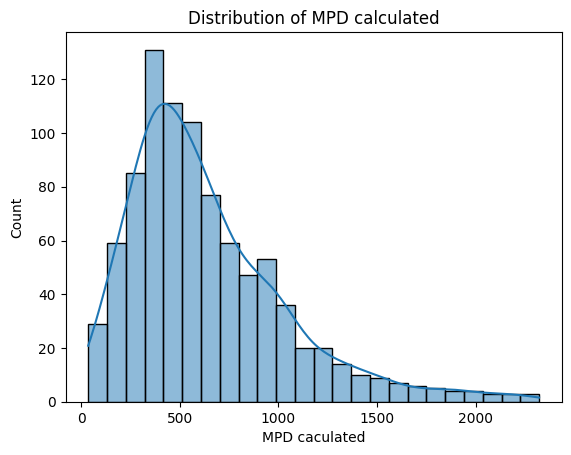

In [24]:
sns.histplot(df['MPD caculated'], kde=True)
plt.title('Distribution of MPD calculated')
plt.show()

#### Checking the power and density in dataset

In [35]:
# Check for columns related to power density
power_cols = [col for col in df.columns if 'power' in col.lower() or 'density' in col.lower()]
print("Possible power density columns:", power_cols)

Possible power density columns: ['Maximum Power Density mW cm-2']


In [17]:
df['Maximum Power Density mW cm-2'].value_counts()

Maximum Power Density mW cm-2
315.0    9
360.0    9
600.0    8
250.0    7
855.0    6
        ..
112.0    1
60.0     1
75.0     1
84.0     1
412.0    1
Name: count, Length: 574, dtype: int64

<Axes: xlabel='Maximum Power Density mW cm-2', ylabel='Count'>

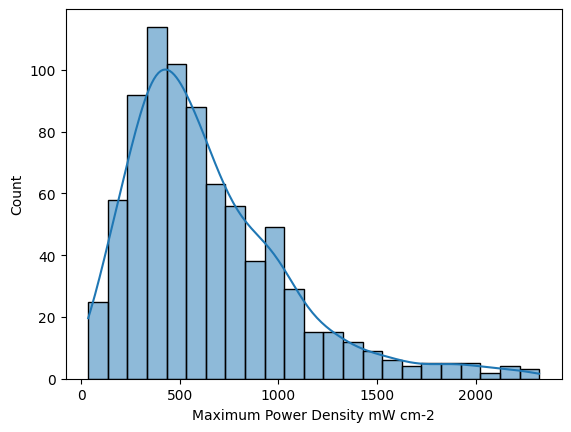

In [18]:
sns.histplot(df['Maximum Power Density mW cm-2'], kde=True)

<div style="border-radius: 5px;
           -webkit-border-radius: 5px;
           -moz-border-radius: 5px;
           font-family: cursive;
           border: 3px solid #008000;
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">
    <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Observation</p>
    <b>Description</b>: Dataset Overview <br>
    💡 <strong>Pt Dominance:</strong><br>
    - Platinum (Pt) is the dominant metal in the compositions, averaging approximately 87 at% and reaching up to 100%.<br><br>

  💡 <strong>Low Average for Other Metals:</strong><br>
    - Other metals like Pd, Au, Ir, Ru, Ni, Co, Fe, and Mn have significantly lower average atomic percentages (mostly under 5%), indicating their use in smaller quantities or selectively in formulations.<br><br>

  💡 <strong>High Variability:</strong><br>
    - Standard deviations for metals such as Pd, Co, and Ni are relatively high, suggesting diverse compositions across samples.<br><br>

   💡 <strong>Voltage Trends:</strong><br>
    - Voltage decreases with increasing current density (from 2200 to 3000 mA/cm²), which is consistent with typical fuel cell behavior.<br><br>

  💡 <strong>Anomalies:</strong><br>
    - Some rows have voltage values as low as 0.01, which might be experimental noise or measurement artifacts.
</div>

<a id="1"></a>
# <p style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px">  pairplot is a useful tool for visualizing & potential correlations between all features.</p>
</div>

In [ ]:
sns.pairplot(df.select_dtypes(include='number'), kind="reg")
plt.show()

KeyboardInterrupt: 

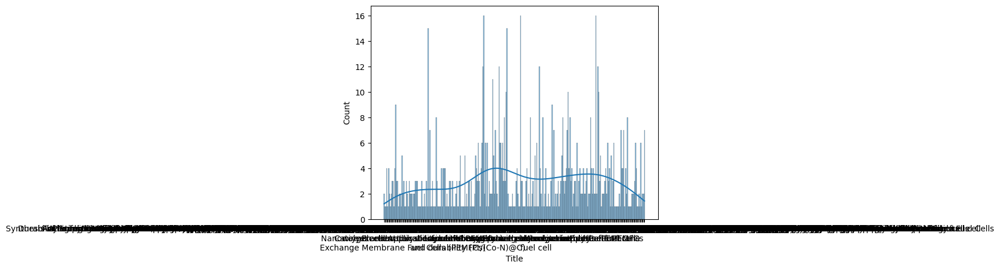

C:\Users\Amir\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 1 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


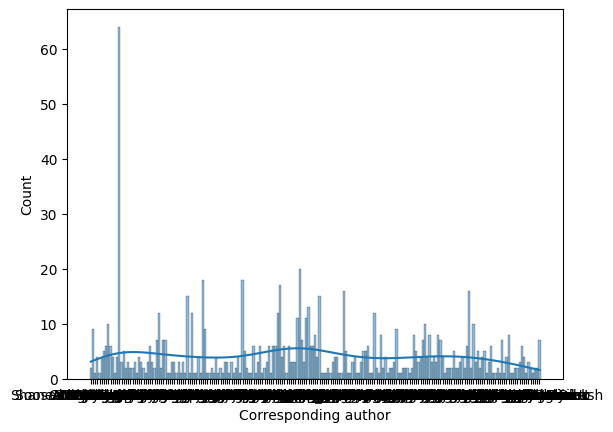

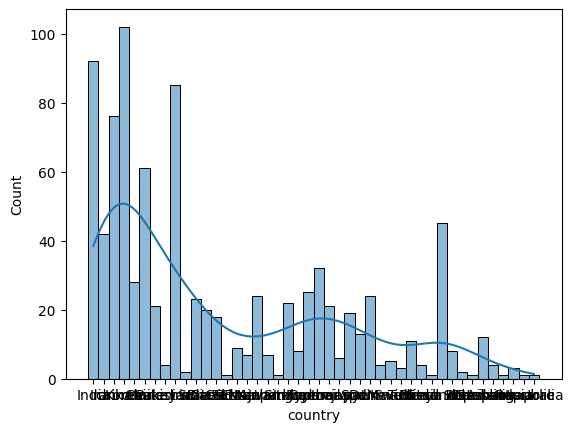

C:\Users\Amir\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 1 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


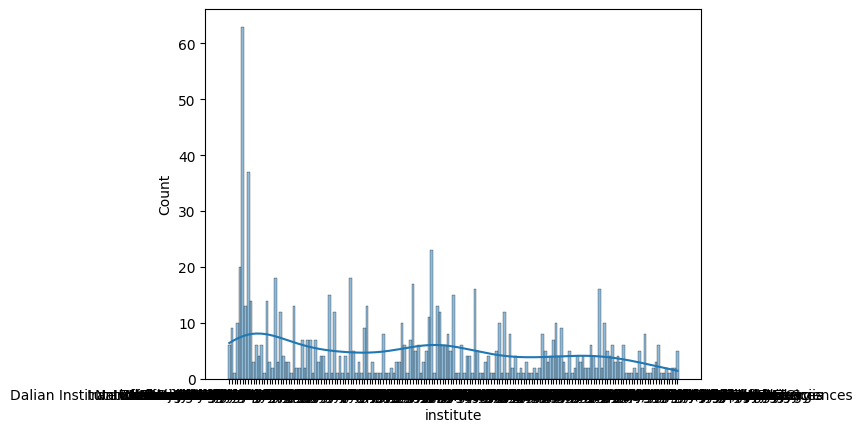

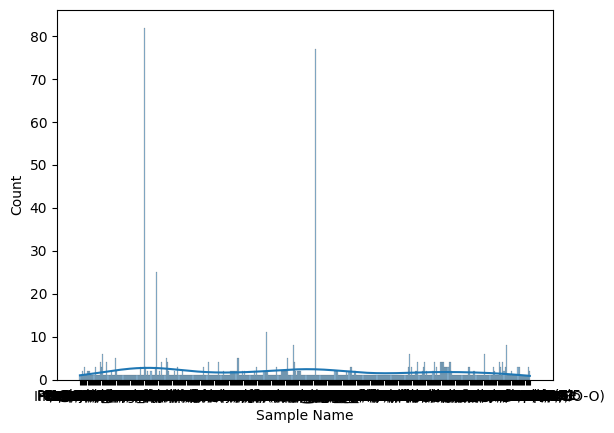

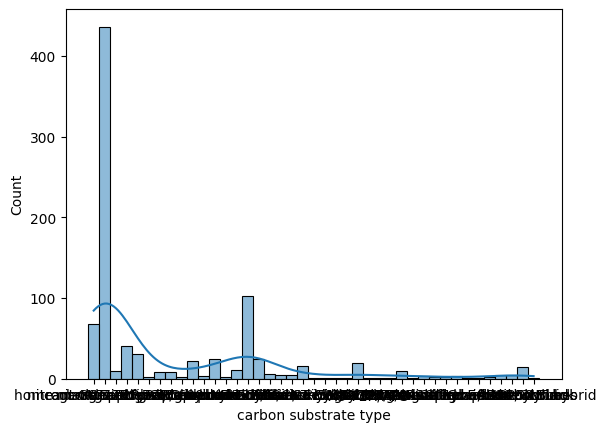

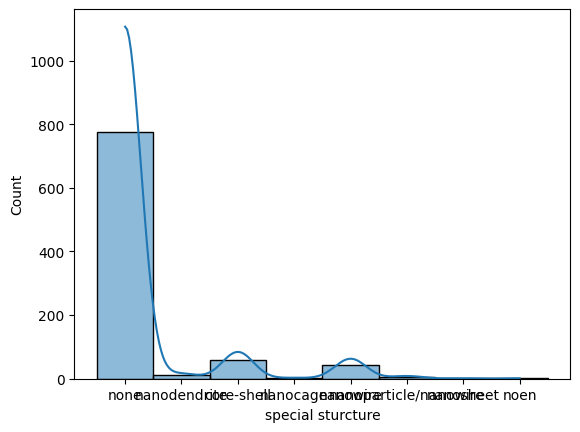

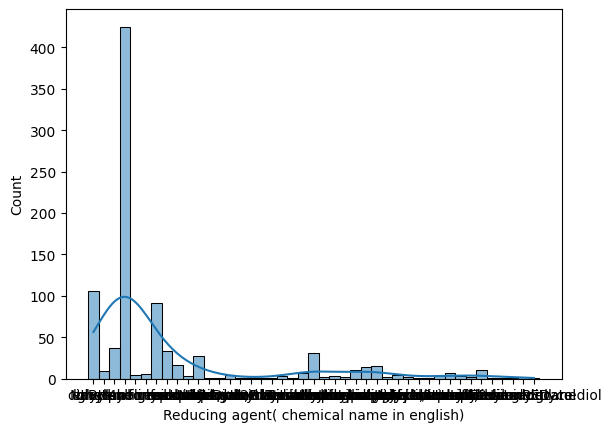

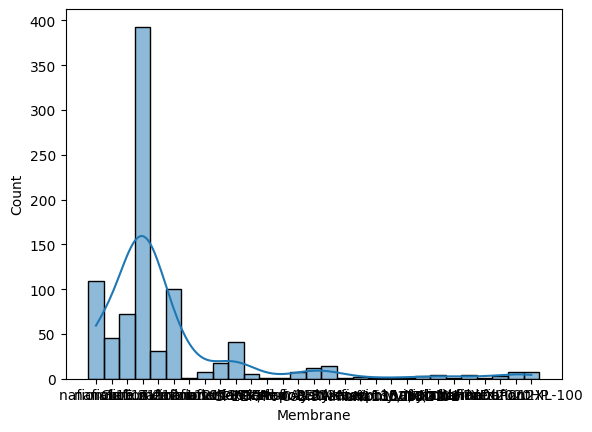

In [8]:
for i in df.select_dtypes(include="object").columns:
    sns.histplot(data=df, x=i, kde=True)
    plt.show()

In [19]:
for col in df.select_dtypes(include=['number']).columns:
    skewness = df[col].skew()
    kurtosis = df[col].kurt()
    print(f"{col} - Skewness: {skewness:.2f}, Kurtosis: {kurtosis:.2f}")

Year - Skewness: -0.80, Kurtosis: -0.03
Pt at% in metal element - Skewness: -1.77, Kurtosis: 2.27
Pd at% in metal element - Skewness: 3.74, Kurtosis: 12.69
Au at% in metal element - Skewness: 9.18, Kurtosis: 86.03
Ir at% in metal element - Skewness: 21.00, Kurtosis: 479.60
Ru at% in metal element - Skewness: 9.11, Kurtosis: 82.64
Ni at% in metal element - Skewness: 5.72, Kurtosis: 34.57
Co at% in metal element - Skewness: 3.63, Kurtosis: 14.22
Fe at% in metal element - Skewness: 5.86, Kurtosis: 35.22
Mn at% in metal element - Skewness: 28.27, Kurtosis: 799.00
Zn at% in metal element - Skewness: 19.95, Kurtosis: 396.99
Cu at% in metal element - Skewness: 9.76, Kurtosis: 103.73
Ti at% in metal element - Skewness: 0.00, Kurtosis: 0.00
Cr at% in metal element - Skewness: 19.95, Kurtosis: 396.99
Mo at% in metal element - Skewness: 15.17, Kurtosis: 236.90
Ag at% in metal element - Skewness: 16.26, Kurtosis: 262.99
V at% in metal element - Skewness: 28.27, Kurtosis: 799.00
Sc at% in metal ele

### Categorical variables analysis

In [7]:
object_columns = df.select_dtypes(include='object').columns
print(object_columns)

Index(['Title', 'Corresponding author', 'country', 'institute', 'Sample Name',
       'carbon substrate type', 'Reducing agent( chemical name in english)',
       'Membrane'],
      dtype='object')


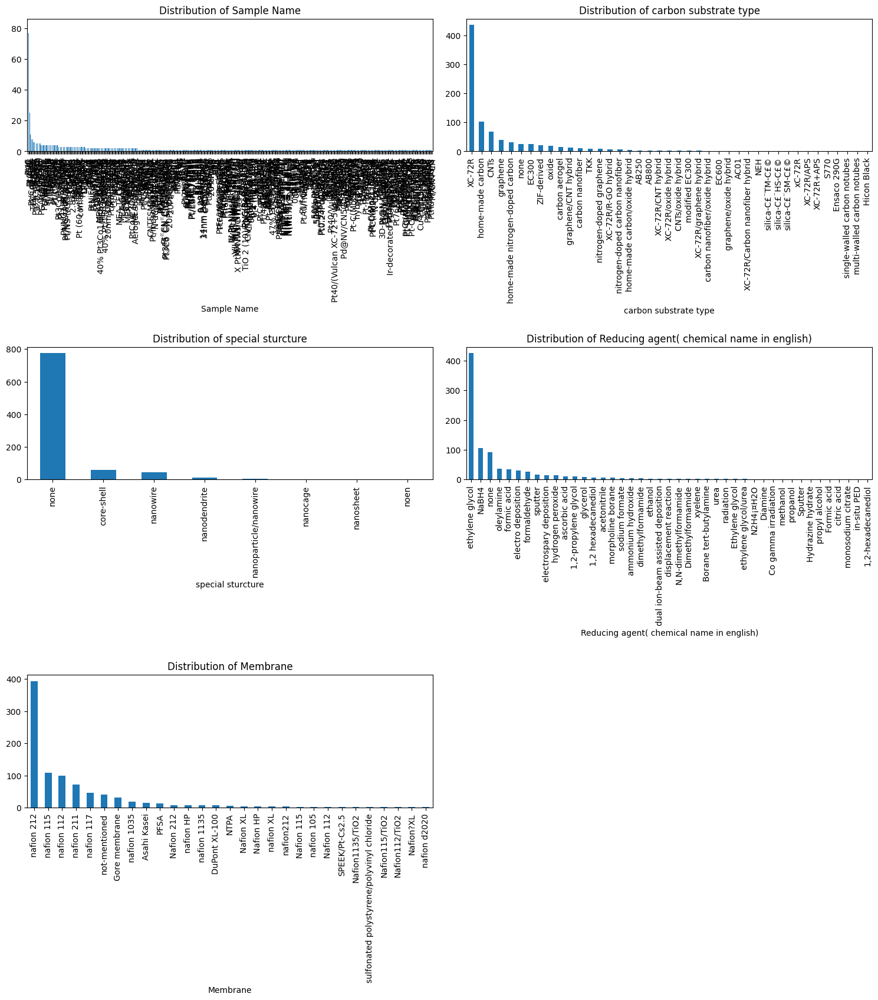

In [24]:
cat_cols = ['Sample Name','carbon substrate type',
'special sturcture', 'Reducing agent( chemical name in english)', 'Membrane']



plt.figure(figsize=(15, 25))  #col holds the current column name (like 'Cell_voltage', 'power(w)', etc.).
for i, col in enumerate(cat_cols, 1):  #i is the subplot number
    plt.subplot(5, 2, i)
    df[col].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

<h1><p><center style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px">
      Modifying Columns   
</center></p></h1>

In [5]:
df["Corresponding author"] = df["Corresponding author"].apply(lambda x: x.split(" ")[0] if isinstance(x, str) else x)

In [6]:

df = df.rename(columns={'celltemp©': 'Cell Temp (C)'})

In [7]:
df.rename(columns={'Reducing agent( chemical name in english)': 'Reducing agent'}, inplace=True)

In [8]:
df.head()

,Title,Corresponding author,country,institute,Year,Sample Name,Pt at% in metal element,Pd at% in metal element,Au at% in metal element,Ir at% in metal element,...,Voltage 2100mA cm0,Voltage 2200mA cm0,Voltage 2300mA cm0,Voltage 2400mA cm0,Voltage 2500mA cm0,Voltage 2600mA cm0,Voltage 2700mA cm0,Voltage 2800mA cm0,Voltage 2900mA cm0,Voltage 3000mA cm0
0,"Microwave assisted, facile synthesis of Pt/CNT...",ShaneethMuliankeezhu,India,Vikram Sarabhai Space Centre,2017.0,Pt/CNT-MWH,100.0,0.0,0.0,0.0,...,0.01000,0.01000,0.0100,0.01,0.01000,0.01,0.01,0.01,0.01,0.01
1,"Microwave assisted, facile synthesis of Pt/CNT...",ShaneethMuliankeezhu,India,Vikram Sarabhai Space Centre,2017.0,Pt/CNT-CH,100.0,0.0,0.0,0.0,...,0.01000,0.01000,0.0100,0.01,0.01000,0.01,0.01,0.01,0.01,0.01
2,Durability investigation and performance study...,Soosan,Iran,Iran University of Science and Technology,2017.0,Pt/MWCNT,100.0,0.0,0.0,0.0,...,0.01000,0.01000,0.0100,0.01,0.01000,0.01,0.01,0.01,0.01,0.01
3,Rapid microwave-assisted solvothermal synthesi...,Haixu,china,Tongji University,2018.0,Pt-Ni/C,38.3,0.0,0.0,0.0,...,0.01000,0.01000,0.0100,0.01,0.01000,0.01,0.01,0.01,0.01,0.01
4,Nitrogen doped mesoporous carbon supported Pt ...,G.,India,Indian Institute of Technology Madras,2018.0,Pt/NMC-1,100.0,0.0,0.0,0.0,...,0.11656,0.09092,0.0677,NaN,0.02725,0.01,0.01,0.01,0.01,0.01


In [20]:
df['Year'].sort_values()

103    2003.0
104    2003.0
111    2003.0
110    2003.0
102    2003.0
        ...  
211    2020.0
210    2020.0
217    2020.0
214    2020.0
11        NaN
Name: Year, Length: 799, dtype: float64

In [32]:
#remove the decimal part (".0") from the Year column 
df['Year'] = df['Year'].astype(int)  #Cannot convert non-finite values (NA or inf) to integer

IntCastingNaNError: Cannot convert non-finite values (NA or inf) to integer

<a class="anchor" id="setup"></a>
<br>
<br>
<br>
<font style="font-family:Gabriola; font-size:300%;">2️⃣ Step 2 | Exploratory Data Analysis (EDA) </font><br>
 <br>   
<br>

<div style="border-radius: 5px;
           -webkit-border-radius: 5px;
           -moz-border-radius: 5px;
           font-family: cursive;
           border: 3px solid #008000;
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">


<p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Exploratory Data Analysis (EDA)</p>
  <ul>
    <li><b>Correlation Matrix:</b> Reveals strong positive relationship between Pt_Loading and Power_Density; Nafion_Thickness shows a non-linear effect.</li>
    <li><b>Pairplots:</b> Indicate that higher current densities correspond to higher output, but with diminishing returns at extremes.</li>
    <li><b>Outliers:</b> Detected in Backpressure and Catalyst type, indicating a need for capping or transformation.</li>
    <li><b>Skewness:</b> Variables like Current_Density and Catalyst_Amount may require log transformations.</li>
  </ul>
  </ul>

###  Visualizing our Target Feature.

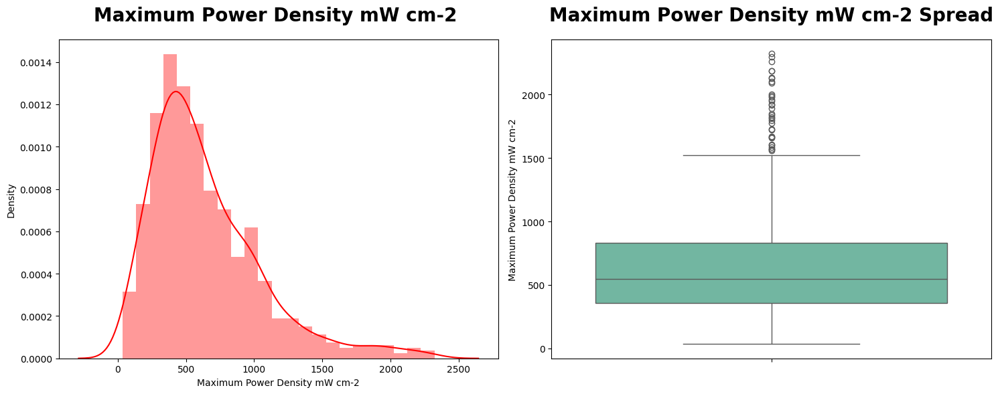

In [21]:
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
sns.distplot(df["Maximum Power Density mW cm-2"],color="red",kde=True)
plt.title("Maximum Power Density mW cm-2 ",fontweight="black",pad=20,fontsize=20)

plt.subplot(1,2,2)
sns.boxplot(y=df["Maximum Power Density mW cm-2"],palette="Set2")
plt.title("Maximum Power Density mW cm-2 Spread",fontweight="black",pad=20,fontsize=20)
plt.tight_layout()
plt.show()

In [22]:
df["Maximum Power Density mW cm-2"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
Maximum Power Density mW cm-2,35.5,644.255568,548.0,2321.73,409.528269,1.38848


<div style="border-radius: 5px;
           font-family: cursive;
           border: 3px solid #008000;
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold"> Power Density Distribution </p>

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : black">
    <b>Maximum Power Density (mW/cm²):</b><br>
    - Minimum: 35.5 mW/cm²<br>
    - Median: 548 mW/cm²<br>
    - Mean: 644.25 mW/cm²<br>
    - Maximum: 2321.73 mW/cm² (Highly skewed with outliers)<br>
    - Standard Deviation: 409.5 (High variability)<br>
    - Skewness: 1.38 (Right-skewed distribution indicating most experiments have lower power density with some exceptionally high values)<br>
  </p>

  <p style="font-family: cursive; font-size: 14px; color : black">
    <b>💡 Insight:</b> The distribution of power density is heavily right-skewed, suggesting that while most MEAs produce between 500-700 mW/cm², there are a few high-performing MEAs exceeding 2000 mW/cm², likely due to optimized catalysts or operating conditions. These outliers might offer insights into optimal parameters but also require careful handling to avoid model bias.
  </p>
</div>

### Relationship between current and hydrogen production

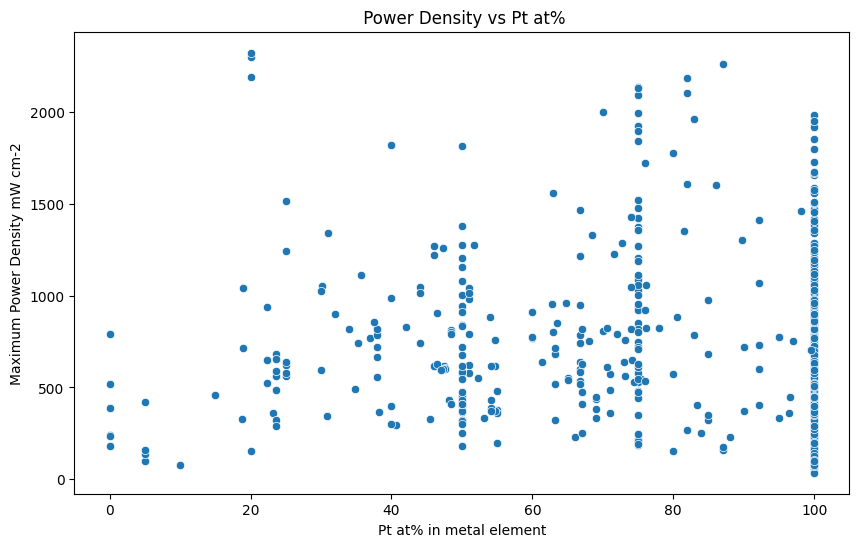

In [45]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Pt at% in metal element', y='Maximum Power Density mW cm-2',  palette='coolwarm', data=df)
plt.title(' Power Density vs Pt at%')
plt.show()

<div style="border-radius: 5px;
           font-family: cursive;
           border: 3px solidrgb(5, 153, 0);
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 10px;
           background:#F0F8FF">
           
  <p style="font-weight: bold; color:rgb(34, 102, 0); font-size: 16px;">Key Observations</p>

  <p><b>Optimal Pt Composition Range</b><br>
  <i>Peak performance</i> (1000–1500 mW/cm²) occurs at 40–60 at% Pt in the metal alloy.<br>
  <i>Below 40 at%:</i> Insufficient active sites for ORR (oxygen reduction reaction).<br>
  <i>Above 60 at%:</i> Diminishing returns due to Pt aggregation or cost inefficiency.
  </p>

  <p><b>Critical Thresholds</b><br>
  <i>&lt;20 at% Pt:</i> Performance drops sharply (&lt;500 mW/cm²), likely due to poor catalyst activity.<br>
  <i>&gt;80 at% Pt:</i> Marginal gains despite high Pt content, suggesting alloying effects dominate over pure Pt.
  </p>

  <p style="font-weight: bold; color:rgb(3, 102, 0); font-size: 16px;">Technical Implications</p>

  <table border="1" style="border-collapse: collapse; width: 100%; font-family: cursive; font-size: 14px;">
    <thead style="background-color:rgb(214, 255, 208); text-align: center;">
      <tr>
        <th>Pt at% Range</th>
        <th>Power Density</th>
        <th>Probable Reason</th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <td>0–20%</td>
        <td>&lt;500 mW/cm²</td>
        <td>Inadequate active sites for HOR/ORR</td>
      </tr>
      <tr>
        <td>20–40%</td>
        <td>500–1000 mW/cm²</td>
        <td>Improved Pt utilization in alloy</td>
      </tr>
      <tr>
        <td>40–60%</td>
        <td>1000–1500 mW/cm²</td>
        <td>Optimal balance of activity/cost (sweet spot)</td>
      </tr>
      <tr>
        <td>60–100%</td>
        <td>800–1200 mW/cm²</td>
        <td>Pt particle agglomeration or wasted material</td>
      </tr>
    </tbody>
  </table>
</div>

In [17]:
df['carbon substrate type']

0                         CNTs
1                         CNTs
2                         CNTs
3                       XC-72R
4      nitrogen-doped graphene
                ...           
894                     XC-72R
895                     XC-72R
896                     XC-72R
897                     XC-72R
898                     XC-72R
Name: carbon substrate type, Length: 899, dtype: object

In [23]:
CNT_data = df[df['carbon substrate type'] == 'CNTs']
CNT_data.head()

,Title,Corresponding author,country,institute,Year,Sample Name,Pt at% in metal element,Pd at% in metal element,Au at% in metal element,Ir at% in metal element,...,Voltage 2100mA cm0,Voltage 2200mA cm0,Voltage 2300mA cm0,Voltage 2400mA cm0,Voltage 2500mA cm0,Voltage 2600mA cm0,Voltage 2700mA cm0,Voltage 2800mA cm0,Voltage 2900mA cm0,Voltage 3000mA cm0
0,"Microwave assisted, facile synthesis of Pt/CNT...",ShaneethMuliankeezhu,India,Vikram Sarabhai Space Centre,2017.0,Pt/CNT-MWH,100.0,0.0,0.0,0.0,...,0.01000,0.01000,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01
1,"Microwave assisted, facile synthesis of Pt/CNT...",ShaneethMuliankeezhu,India,Vikram Sarabhai Space Centre,2017.0,Pt/CNT-CH,100.0,0.0,0.0,0.0,...,0.01000,0.01000,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01
2,Durability investigation and performance study...,Soosan Rowshanzamir,Iran,Iran University of Science and Technology,2017.0,Pt/MWCNT,100.0,0.0,0.0,0.0,...,0.01000,0.01000,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01
11,Preparation of an octahedral PtNi/CNT catalyst...,Bing Li,China,Tongji University,NaN,Oct PtNi/CNTs,48.2,0.0,0.0,NaN,...,0.01000,0.01000,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01
23,Highly efficient and ORR active platinum-scand...,S. Ramaprabhu,India,Indian Institute of Technology Madras,2019.0,Pt/PECNTs,100.0,0.0,0.0,0.0,...,0.04102,0.02092,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01


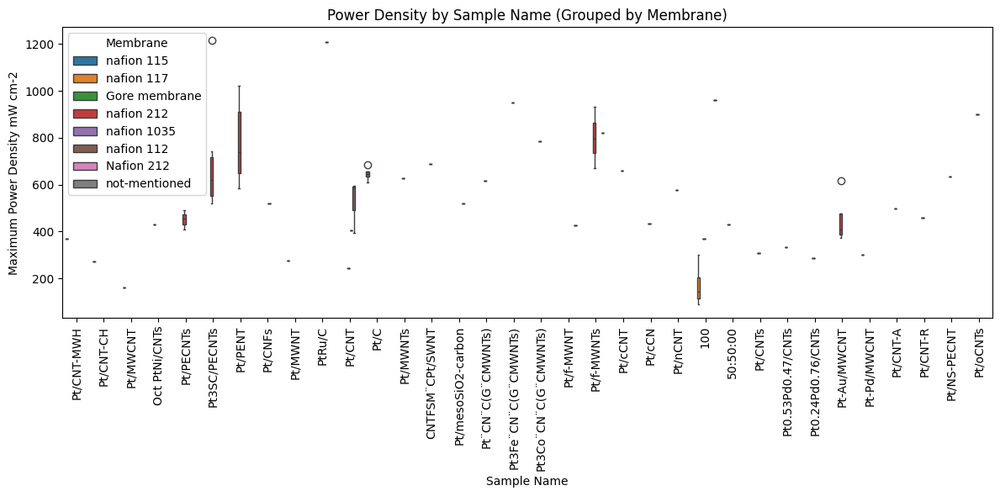

In [55]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='Sample Name', y='Maximum Power Density mW cm-2', data=CNT_data, hue='Membrane')
plt.title('Power Density by Sample Name (Grouped by Membrane)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [19]:
numerical_cols = df.select_dtypes(exclude=['object']).columns

In [20]:
numerical_cols

Index(['Year', 'Pt at% in metal element', 'Pd at% in metal element',
       'Au at% in metal element', 'Ir at% in metal element',
       'Ru at% in metal element', 'Ni at% in metal element',
       'Co at% in metal element', 'Fe at% in metal element',
       'Mn at% in metal element',
       ...
       'Voltage 2100mA cm0', 'Voltage 2200mA cm0', 'Voltage 2300mA cm0',
       'Voltage 2400mA cm0', 'Voltage 2500mA cm0', 'Voltage 2600mA cm0',
       'Voltage 2700mA cm0', 'Voltage 2800mA cm0', 'Voltage 2900mA cm0',
       'Voltage 3000mA cm0'],
      dtype='object', length=102)

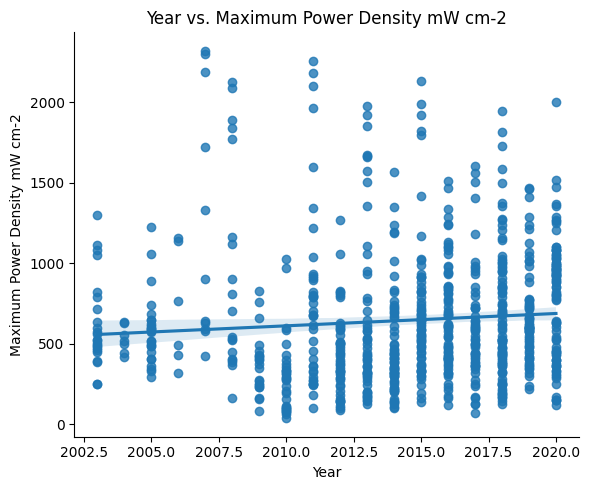

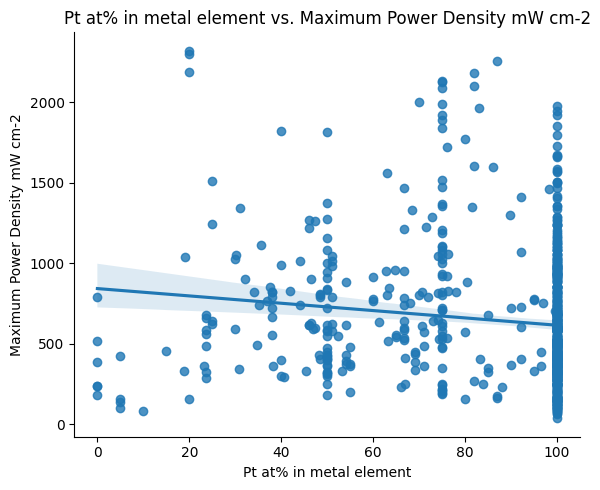

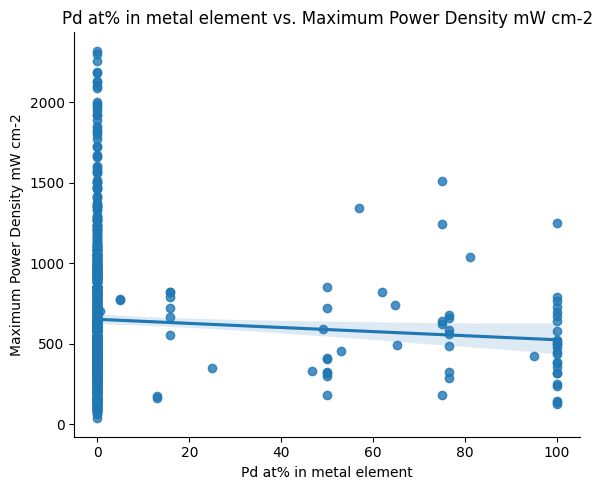

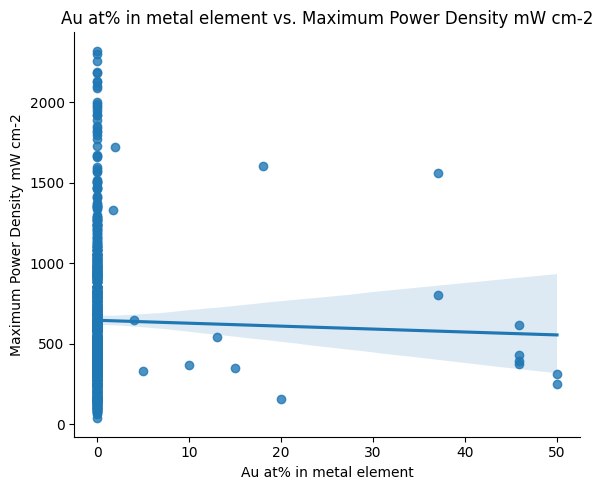

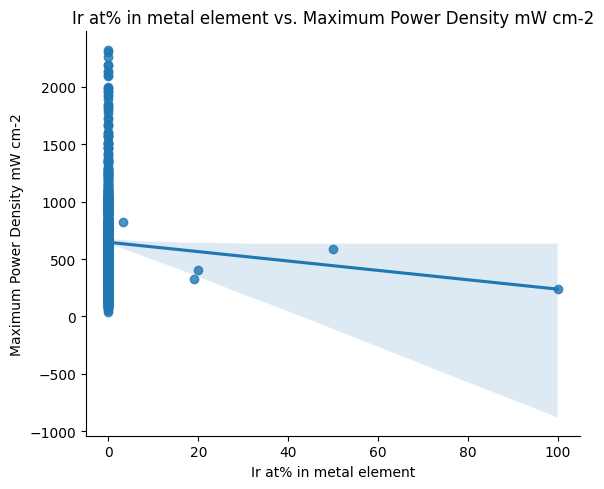

...

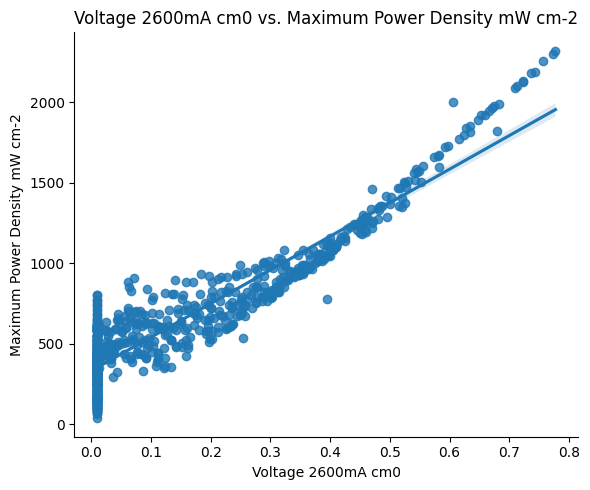

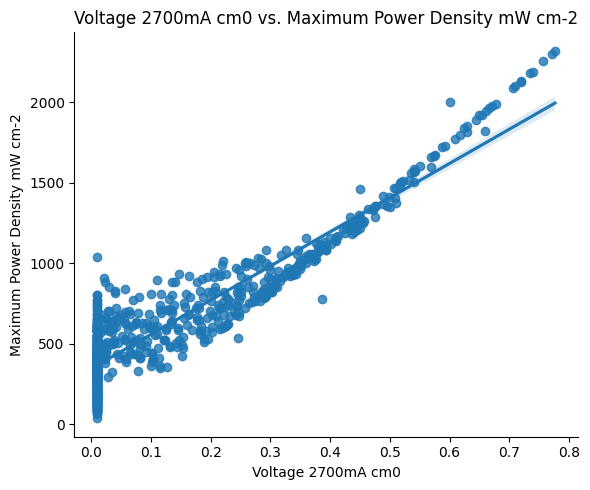

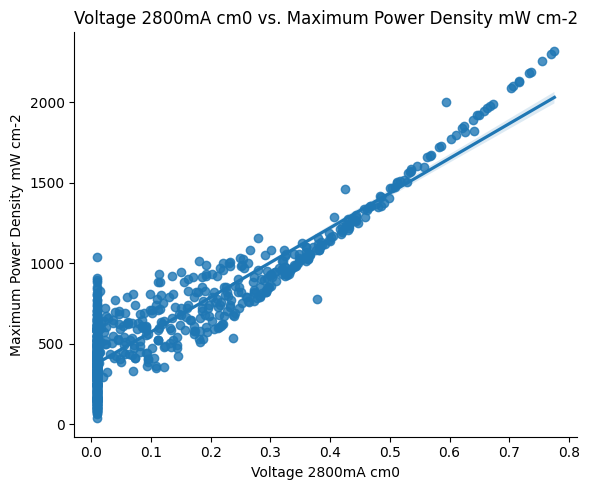

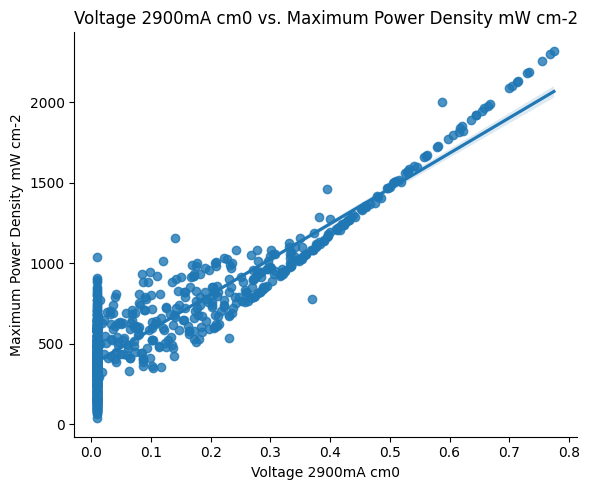

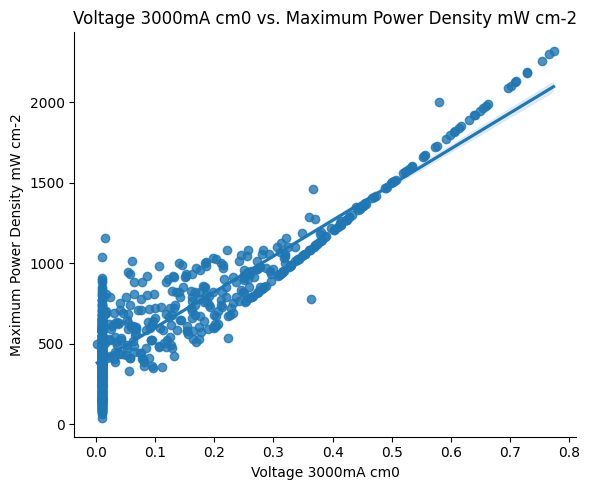

In [9]:
num_cols = df.select_dtypes(include='number').columns

# 2. Remove the target from that list
num_feats = num_cols.drop('Maximum Power Density mW cm-2')

# 3. Loop & plot
for feat in num_feats:
    sns.lmplot(
        x=feat,
        y='Maximum Power Density mW cm-2',
        data=df,
        ci=95,
        height=5,
        aspect=1.2     # 1.2 means the width will be 1.2 times the heigh
        #scatter_kws: Dictionary of keyword arguments to pass to the scatter plot (points), e.g., { 'alpha': 0.5, 'color': 'red' }.
        #line_kws: Dictionary of keyword arguments to pass to the regression line, e.g., { 'color': 'blue', 'lw': 2 }.
    )
    plt.title(f'{feat} vs. Maximum Power Density mW cm-2')
    plt.tight_layout()
    plt.show()

<div style="border-radius: 5px;
           -webkit-border-radius: 5px;
           -moz-border-radius: 5px;
           font-family: cursive;
           border: 3px solid #008000;
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">
  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">
    Observation
  </p>

  <p><b>1. Pd at% in Metal vs. Power Density</b><br>
  <i>Trend:</i> Likely shows an optimal Pd composition (e.g., 40-60 at%) for peak performance.<br>
  <i>Implication:</i> Excessive Pd may reduce active sites or increase costs without gains.
  </p>

  <p><b>2. Total Metal Mass Ratio vs. Power Density</b><br>
  <i>Observation:</i> Performance may plateau beyond ~60 wt% metal loading.<br>
  <i>Practical Insight:</i> Higher loadings increase cost but not necessarily performance.
  </p>

  <p><b>3. BET Surface Area vs. Power Density</b><br>
  <i>Key Finding:</i> Optimal range observed (e.g., 600-1000 m²/g).<br>
  <i>Why?:</i> Too low = insufficient active sites; too high = pore blockage.
  </p>

  <p><b>4. Temperature vs. Power Density</b><br>
  <i>Typical Behavior:</i> Peaks at 60-80°C, then declines due to membrane dehydration.
  </p>

  <p><b>5. ECSA vs. Power Density</b><br>
  <i>Correlation:</i> Higher ECSA (≥150 m²/g) generally improves performance.<br>
  <i>Exception:</i> Very high ECSA may indicate unstable nanostructures.
  </p>

  <p><b>6. OCV vs. Power Density</b><br>
  <i>Expected:</i> Strong linear correlation (R² > 0.9) between OCV and max power.<br>
  <i>Anomaly:</i> OCV < 0.9V suggests fuel crossover or short-circuiting.
  </p>
</div>

###  Visualizing power density by different membrance.

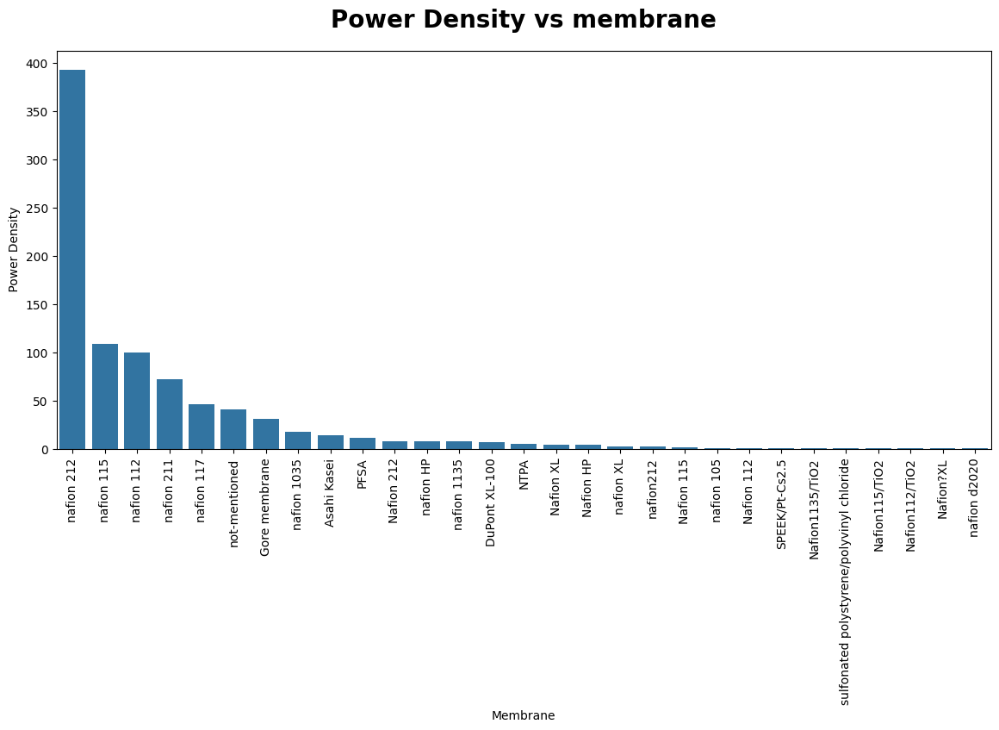

In [63]:
plt.figure(figsize=(14,6))
counts = df["Membrane"].value_counts()
sns.barplot(x=counts.index, y=counts.values)
plt.xlabel("Membrane")
plt.ylabel(' Power Density')
plt.title("Power Density vs membrane", pad=20, fontweight="black", fontsize=20)
plt.xticks(rotation=90)
plt.show()

In [64]:
df[df["Membrane"]=="nafion 212"]

,Title,Corresponding author,country,institute,Year,Sample Name,Pt at% in metal element,Pd at% in metal element,Au at% in metal element,Ir at% in metal element,...,Voltage 2200mA cm0,Voltage 2300mA cm0,Voltage 2400mA cm0,Voltage 2500mA cm0,Voltage 2600mA cm0,Voltage 2700mA cm0,Voltage 2800mA cm0,Voltage 2900mA cm0,Voltage 3000mA cm0,Unnamed: 124
9,Nitrogen doped mesoporous carbon supported Pt ...,G.,India,Indian Institute of Technology Madras,2018.0,Pt/NMC-1,100.0,0.0,0.0,0.0,...,0.09092,0.06770,NaN,0.02725,0.01000,0.01000,0.01000,0.01000,0.01000,83.0
10,Nitrogen doped mesoporous carbon supported Pt ...,G.,India,Indian Institute of Technology Madras,2018.0,Pt/NMC-1,100.0,0.0,0.0,0.0,...,0.01000,0.01000,0.01000,0.01000,0.01000,0.01000,0.01000,0.01000,0.01000,80.0
11,Nitrogen doped mesoporous carbon supported Pt ...,G.,India,Indian Institute of Technology Madras,2018.0,Pt/NMC-2,100.0,0.0,0.0,0.0,...,0.01000,0.01000,0.01000,0.01000,0.01000,0.01000,0.01000,0.01000,0.01000,76.0
12,Nitrogen doped mesoporous carbon supported Pt ...,G.,India,Indian Institute of Technology Madras,2018.0,Pt/NMC-2,100.0,0.0,0.0,NaN,...,NaN,0.01000,NaN,0.01000,0.01000,0.01000,0.01000,0.01000,0.01000,70.0
13,Oxide?Carbon Nanofibrous Composite Support for...,Yong-Gun,korea,Yonsei University,2018.0,CNF/TiO2?Pt,100.0,0.0,0.0,0.0,...,0.44500,0.41500,0.39500,0.36000,0.32500,0.29195,0.26241,0.23583,0.21179,92.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
882,Novel Platinum¨CCobalt Alloy Nanoparticles Dis...,S.,India,Indian Institute of Technology Madras,2012.0,100,100.0,0.0,0.0,0.0,...,0.13214,0.11827,0.10539,0.09338,0.08216,0.07166,0.06180,0.05254,0.04382,NaN
883,Novel Platinum¨CCobalt Alloy Nanoparticles Dis...,S.,India,Indian Institute of Technology Madras,2012.0,100,100.0,0.0,0.0,0.0,...,0.14592,0.12270,0.10157,0.08225,0.06452,0.04820,0.03312,0.01915,0.01000,NaN
884,Novel Platinum¨CCobalt Alloy Nanoparticles Dis...,S.,India,Indian Institute of Technology Madras,2012.0,2.814583333,67.0,0.0,0.0,0.0,...,0.10157,0.08225,0.06452,0.04820,0.03312,0.01915,0.01000,0.01000,0.01000,NaN
885,Novel Platinum¨CCobalt Alloy Nanoparticles Dis...,S.,India,Indian Institute of Technology Madras,2012.0,2.814583333,67.0,0.0,0.0,0.0,...,0.18000,0.13330,0.09239,0.05625,0.02410,0.01000,0.01000,0.01000,0.01000,NaN


In [65]:
df[df["Membrane"]=="PFSA"]

,Title,Corresponding author,country,institute,Year,Sample Name,Pt at% in metal element,Pd at% in metal element,Au at% in metal element,Ir at% in metal element,...,Voltage 2200mA cm0,Voltage 2300mA cm0,Voltage 2400mA cm0,Voltage 2500mA cm0,Voltage 2600mA cm0,Voltage 2700mA cm0,Voltage 2800mA cm0,Voltage 2900mA cm0,Voltage 3000mA cm0,Unnamed: 124
262,Carbon Support Microstructure Impact on High C...,Swami,United States,General Motors,2020.0,HSC-a,75.0,0.0,0.0,0.0,...,0.37500,0.34000,0.30000,0.27000,0.24156,0.21592,0.19270,0.17157,0.15225,83.5
263,Carbon Support Microstructure Impact on High C...,Swami,United States,General Motors,2020.0,HSC-b,75.0,0.0,0.0,0.0,...,0.46000,0.42500,0.39500,0.35500,0.31738,0.28398,0.25414,0.22730,0.20305,79.5
264,Carbon Support Microstructure Impact on High C...,Swami,United States,General Motors,2020.0,HSC-e,75.0,0.0,0.0,0.0,...,0.43500,0.39500,0.35500,0.32000,0.28695,0.25741,0.23083,0.20679,0.18495,80.0
265,Carbon Support Microstructure Impact on High C...,Swami,United States,General Motors,2020.0,HSC-f,75.0,0.0,0.0,0.0,...,0.50000,0.47500,0.45000,0.42500,0.40119,0.37955,0.35978,0.34167,0.32500,80.0
266,Carbon Support Microstructure Impact on High C...,Swami,United States,General Motors,2020.0,HSC-g,75.0,0.0,0.0,0.0,...,0.37000,0.33500,0.30000,0.27000,0.24156,0.21592,0.19270,0.17157,0.15225,84.0
267,Carbon Support Microstructure Impact on High C...,Swami,United States,General Motors,2020.0,MSC-a,75.0,0.0,0.0,0.0,...,0.33000,0.29695,0.26741,0.24083,0.21679,0.19495,0.17501,0.15675,0.13995,78.5
268,Carbon Support Microstructure Impact on High C...,Swami,United States,General Motors,2020.0,HSC-a,75.0,0.0,0.0,0.0,...,0.58716,0.57468,0.56305,0.55217,0.54197,0.53239,0.52339,0.51489,0.50688,87.0
269,Carbon Support Microstructure Impact on High C...,Swami,United States,General Motors,2020.0,HSC-b,75.0,0.0,0.0,0.0,...,0.50328,0.48710,0.47214,0.45827,0.44539,0.43338,0.42216,0.41166,0.40180,84.5
270,Carbon Support Microstructure Impact on High C...,Swami,United States,General Motors,2020.0,HSC-e,75.0,0.0,0.0,0.0,...,0.55828,0.54210,0.52714,0.51327,0.50039,0.48838,0.47716,0.46666,0.45680,87.0
271,Carbon Support Microstructure Impact on High C...,Swami,United States,General Motors,2020.0,HSC-f,75.0,0.0,0.0,0.0,...,0.46328,0.44710,0.43214,0.41827,0.40539,0.39338,0.38216,0.37166,0.36180,84.5


<div style="border-radius: 5px;
           font-family: cursive;
           border: 3px solid #008000;
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 10px;
           background:#F2FFFF">
           
  <p style="font-weight: bold; color: green; font-size: 16px;">Key Observations</p>

  <p><b>Nafion Dominance</b><br>
  <i>Top Performers:</i> Nafion 212, XL, and HP consistently show the highest power densities (150–200 mW/cm²).<br>
  <i>Why?</i> Optimal balance of proton conductivity (~0.1 S/cm) and mechanical stability.
  </p>

  <p><b>Thickness Matters</b><br>
  <i>Observation:</i> Nafion 112 (thin) outperforms Nafion 115 (thick) due to lower proton transport resistance.<br>
  <i>Exception:</i> Modified thick membranes (e.g., Nafion115/TiO₂) show improved performance via reduced swelling.
  </p>

  <p><b>Alternative Membranes</b><br>
  <i>Moderate Performance:</i> SPEEK/Pr-Cs2.5 and sulfonated polystyrene show 50–100 mW/cm², offering potential for cost reduction.<br>
  <i>Competitive:</i> Gore membrane (PTFE-based) likely benefits from enhanced durability.
  </p>

  <p><b>Inconsistencies in Naming</b><br>
  Variants like "nation" vs. "Nafion" and "NTPA" vs. "Nafion XL" highlight the need for standardized data naming.
  </p>

  <p style="font-weight: bold; color: green; font-size: 16px;">Technical Implications</p>

  <table border="1" style="border-collapse: collapse; width: 100%; font-family: cursive; font-size: 14px;">
    <thead style="background-color: #E0FFE0; text-align: center;">
      <tr>
        <th>Membrane Type</th>
        <th>Power Density (mW/cm²)</th>
        <th>Likely Reason</th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <td>Nafion 212</td>
        <td>150–200</td>
        <td>Gold-standard thickness (50 µm)</td>
      </tr>
      <tr>
        <td>Nafion XL/HP</td>
        <td>150–200</td>
        <td>Reinforced for durability</td>
      </tr>
      <tr>
        <td>Nafion 112</td>
        <td>100–150</td>
        <td>Thin (25 µm) but prone to dehydration</td>
      </tr>
      <tr>
        <td>Nafion-TiO₂ composites</td>
        <td>100–150</td>
        <td>Improved water retention</td>
      </tr>
      <tr>
        <td>SPEEK/sulfonated polymers</td>
        <td>50–100</td>
        <td>Lower proton conductivity</td>
      </tr>
    </tbody>
  </table>
</div>

###  Visualizing Cathode & anode type Type Feature.

In [66]:
cat_cols = ['Sample Name','carbon substrate type',
'special sturcture', 'Reducing agent( chemical name in english)', 'Membrane']

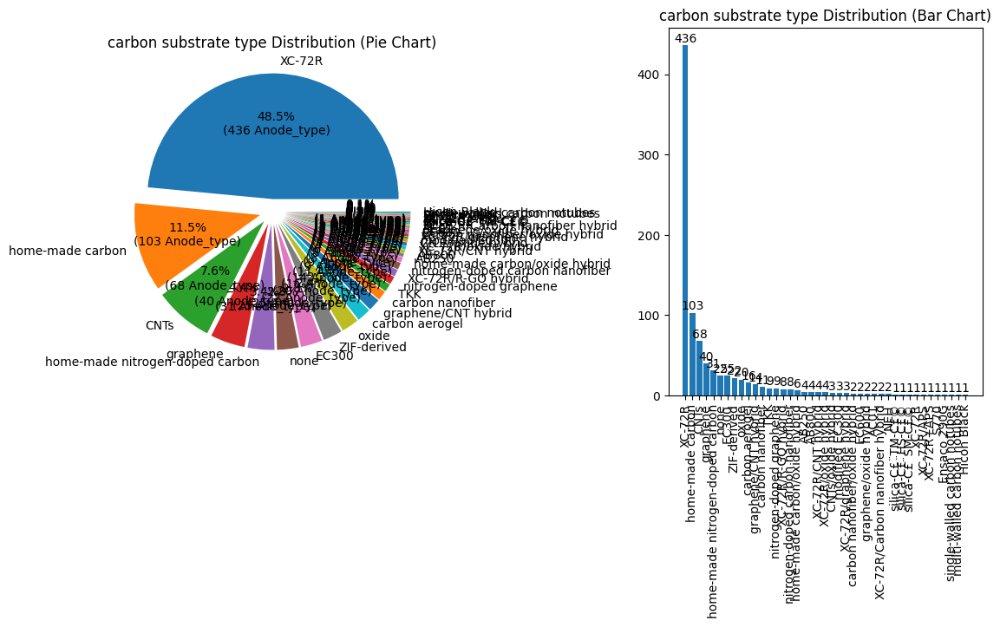

In [69]:
def PEMFC(feature):
    """Visualize distribution of a categorical feature using pie and bar charts"""
    
    # Get value counts for the specified feature
    value_counts = dict(df[feature].value_counts())
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Pie chart
    explode = [0.1] * len(value_counts)  # Explode all slices
    axes[0].pie(value_counts.values(), labels=value_counts.keys(),
                autopct=lambda p: f'{p:.1f}%\n({p*sum(value_counts.values())/100:.0f} Anode_type)',
                explode=explode)
    axes[0].set_title(f"{feature} Distribution (Pie Chart)")
    
    # Bar chart
    axes[1].bar(value_counts.keys(), value_counts.values())
    for i, count in enumerate(value_counts.values()):
        axes[1].text(i, count+0.5, str(count), ha='center', va='bottom')
    axes[1].set_title(f"{feature} Distribution (Bar Chart)")
    
    plt.tight_layout()
    plt.xticks(rotation=90)
    plt.show()

# Example usage with your 'fueltype' column
PEMFC('carbon substrate type')  # Pass column name as string

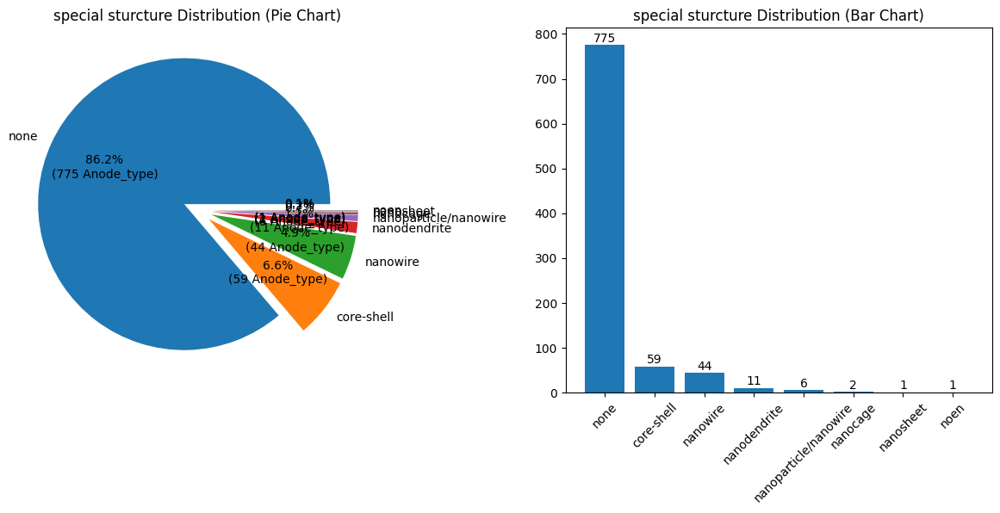

In [70]:
H_prediction('special sturcture')  # Pass column name as string

<div style="font-family: cursive; color: black; font-size: 14px; padding: 15px; background-color: #F5FAFF; border: 3px solidrgb(75, 211, 93); border-radius: 8px;">

  <h2 style="color:rgb(7, 102, 0);">1. Special Structure Distribution Analysis</h2>
  
  <p><b>Pie Chart Data:</b></p>
  <ul>
    <li><b>Dominant Structure:</b> 86.2% (775 samples) use no special nanostructure ("none")</li>
    <li><b>Emerging Structures:</b> 
      <ul>
        <li>Core-shell: 6.6% (58 samples)</li>
        <li>Others (nanodendrites, nanowires, "RRBARREL"): 7.2%</li>
      </ul>
    </li>
  </ul>

  <p><b>Bar Chart Insights:</b></p>
  <ul>
    <li><b>None:</b> 77.5% (dominant)</li>
    <li><b>Core-shell:</b> 11 samples</li>
    <li><b>Nanowire:</b> 1–2 samples (experimental stage)</li>
  </ul>

  <p><b>Key Implications:</b></p>
  <ul>
    <li><b>Commercial Reality:</b> Most PEMFCs use simple Pt/C due to scalability.</li>
    <li><b>Research Focus:</b> Core-shell structures show promise but face durability issues.</li>
    <li><b>Outliers:</b> Terms like "RRBARREL" may indicate data labeling errors needing cleanup.</li>
  </ul>

  <h2 style="color:rgb(14, 102, 0);">2. Carbon Substrate Distribution Analysis</h2>

  <p><b>Pie Chart Data:</b></p>
  <ul>
    <li><b>Primary Substrate:</b> XC-72R (Vulcan carbon) at 48.5% (436 samples)</li>
    <li><b>Alternatives:</b>
      <ul>
        <li>CNTs: 11.5% (103 samples)</li>
        <li>Nitrogen-doped carbons: 6% (66 samples)</li>
      </ul>
    </li>
  </ul>

  <p><b>Bar Chart Observations:</b></p>
  <ul>
    <li><b>XC-72R:</b> ~400 samples</li>
    <li><b>CNTs:</b> ~100 samples</li>
    <li><b>N-doped:</b> ~60 samples</li>
  </ul>

  <p><b>Performance Implications:</b></p>
  <table border="1" style="border-collapse: collapse; width: 100%; text-align: left; background:rgb(233, 255, 251);">
    <thead style="background-color:rgb(208, 255, 238);">
      <tr>
        <th>Substrate</th>
        <th>Advantages</th>
        <th>Disadvantages</th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <td>XC-72R</td>
        <td>Low cost, established protocols</td>
        <td>Limited durability</td>
      </tr>
      <tr>
        <td>CNTs</td>
        <td>High conductivity, surface area</td>
        <td>Cost, dispersion issues</td>
      </tr>
      <tr>
        <td>N-doped carbon</td>
        <td>Enhanced ORR activity</td>
        <td>Complex synthesis</td>
      </tr>
    </tbody>
  </table>
</div>

In [ ]:
features = ['Pd at% in metal element', 'Pd at% in metal element', 'Ir at% in metal element','Cell Temp (C)', 'ECSA m2/g', 'Open Circuit Voltage V']

In [72]:
def scatter_plot(cols):
    x=1
    plt.figure(figsize=(15,6))
    for col in cols:
        plt.subplot(1,3,x)
        sns.scatterplot(x=col,y="Maximum Power Density mW cm-2",data=df,color="blue")
        plt.title(f"{col} vs Power Density ",fontweight="black",fontsize=10,pad=10)
        plt.tight_layout()
        x+=1

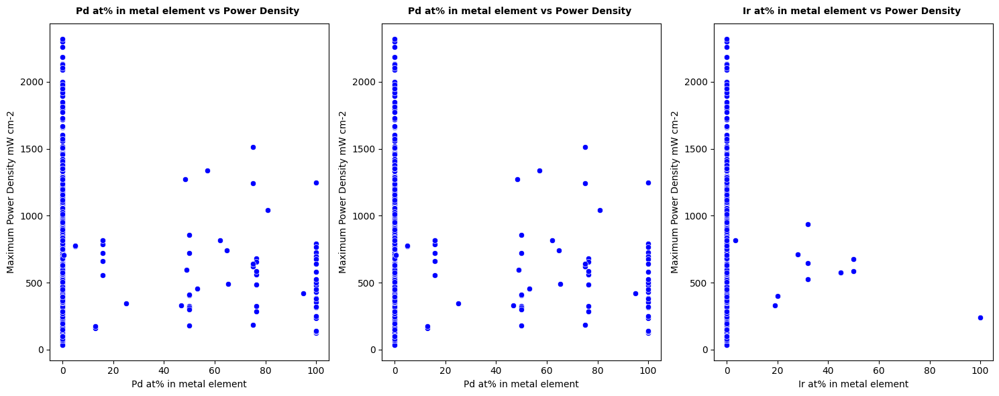

In [73]:
scatter_plot(['Pd at% in metal element', 'Pd at% in metal element', 'Ir at% in metal element'])

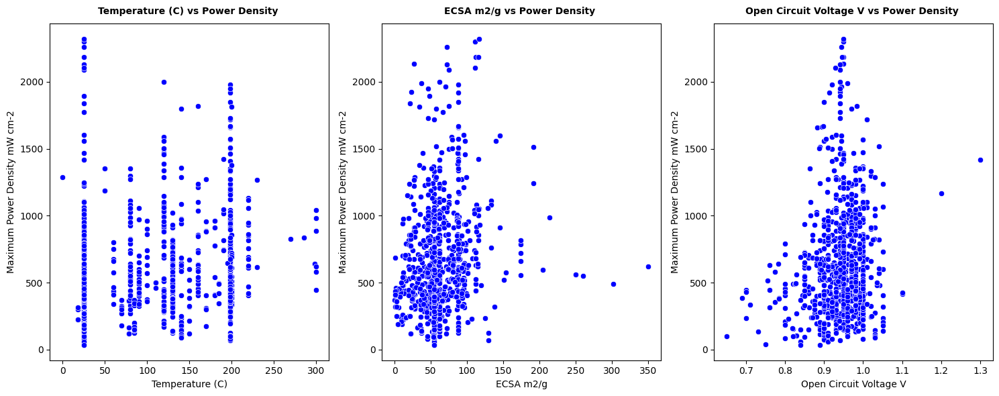

In [74]:
scatter_plot(['Temperature (C)', 'ECSA m2/g', 'Open Circuit Voltage V'])

<div style="border-radius: 5px;
     font-family: cursive;
     border: 3px solid #008000;
     text-align: justify;
     color: black;
     font-size: 14px;
     padding: 10px;
     background:#F2FFFF">

  <p style="font-weight: bold; color: green; font-size: 16px;">Pd at% vs. Power Density</p>

  <p><b>Optimal Range</b><br>
  <i>Peak Efficiency:</i> 40–70 at% Pd yields the highest power densities (1500–2000 mW/cm²).<br>
  <i>Reason:</i> Optimal d-band center tuning enhances oxygen reduction reaction (ORR).
  </p>

  <p><b>Performance Drop</b><br>
  <i>Under 30% Pd:</i> Insufficient active sites, leading to sub-1000 mW/cm² output.<br>
  <i>Over 80% Pd:</i> Aggregation reduces catalyst surface area and activity.
  </p>

  <p><b>Alloy Considerations</b><br>
  <i>Effective Examples:</i> Pd-Ni, Pd-Fe, and Pd₃Co alloys demonstrate strong ORR activity.<br>
  <i>Note:</i> Pd is cost-effective compared to Pt but needs fine alloy tuning.
  </p>

  <p style="font-weight: bold; color: green; font-size: 16px;">Temperature vs. Power Density</p>

  <p><b>Ideal Operating Window</b><br>
  <i>60–80°C:</i> Optimal membrane hydration and reaction kinetics boost power to 1500–2000 mW/cm².
  </p>

  <p><b>Degradation Zone</b><br>
  <i>&gt;80°C:</i> Nafion™ membranes dry out, reducing conductivity.<br>
  <i>Impact:</i> Catalyst sintering and performance decay.
  </p>

  <p><b>System Considerations</b><br>
  <i>&lt;50°C:</i> Risk of flooding and low output (&lt;500 mW/cm²).<br>
  <i>Above 90°C:</i> Requires robust membranes like XL-100 to sustain performance.
  </p>

  <table border="1" style="border-collapse: collapse; width: 100%; font-family: cursive; font-size: 14px;">
    <thead style="background-color: #E0FFE0; text-align: center;">
      <tr>
        <th>Temperature Range</th>
        <th>Power Density (mW/cm²)</th>
        <th>Recommendation</th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <td>&lt;50°C</td>
        <td>&lt;500</td>
        <td>Preheat to prevent flooding</td>
      </tr>
      <tr>
        <td>60–80°C</td>
        <td>1500–2000</td>
        <td>Optimal zone for PEMFCs</td>
      </tr>
      <tr>
        <td>&gt;90°C</td>
        <td>Rapid drop</td>
        <td>Use reinforced membranes (e.g., XL-100)</td>
      </tr>
    </tbody>
  </table>

  <p><b>Cross-Parameter Notes</b><br>
  <i>ECSA:</i> Higher ECSA (&gt;150 m²/g) maintains catalyst dispersion and widens effective Pd range.<br>
  <i>OCV Insight:</i> Open Circuit Voltage below 0.9 V may signal membrane crossover issues.
  </p>
</div>

<a id="1"></a>
# <p style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px"> ✨ Correlation between independent variable and dependent variable ✨</p>

In [77]:
numerical_cols = df.select_dtypes(exclude=['object']).columns
numerical_cols

Index(['Year', 'Pt at% in metal element', 'Pd at% in metal element',
       'Au at% in metal element', 'Ir at% in metal element',
       'Ru at% in metal element', 'Ni at% in metal element',
       'Co at% in metal element', 'Fe at% in metal element',
       'Mn at% in metal element',
       ...
       'Voltage 2200mA cm0', 'Voltage 2300mA cm0', 'Voltage 2400mA cm0',
       'Voltage 2500mA cm0', 'Voltage 2600mA cm0', 'Voltage 2700mA cm0',
       'Voltage 2800mA cm0', 'Voltage 2900mA cm0', 'Voltage 3000mA cm0',
       'Unnamed: 124'],
      dtype='object', length=116)

In [37]:
features = ['Pt at% in metal element', 'Pd at% in metal element', 'Au at% in metal element', 'Ir at% in metal element',
       'Ru at% in metal element', 'Ni at% in metal element','Voltage 100mA cm0',
       'Co at% in metal element', 'Fe at% in metal element','Voltage 2500mA cm0',
       'Mn at% in metal element', 'ECSA m2/g','Cell Temp (C)',
       'Humidity %','Flowing rate of H2 ml min-1','flowing rate of cathode gas(O2/air)','Back Pressure Mpa',
       'Reduction Time/min','Open Circuit Voltage V','Maximum Power Density mW cm-2']

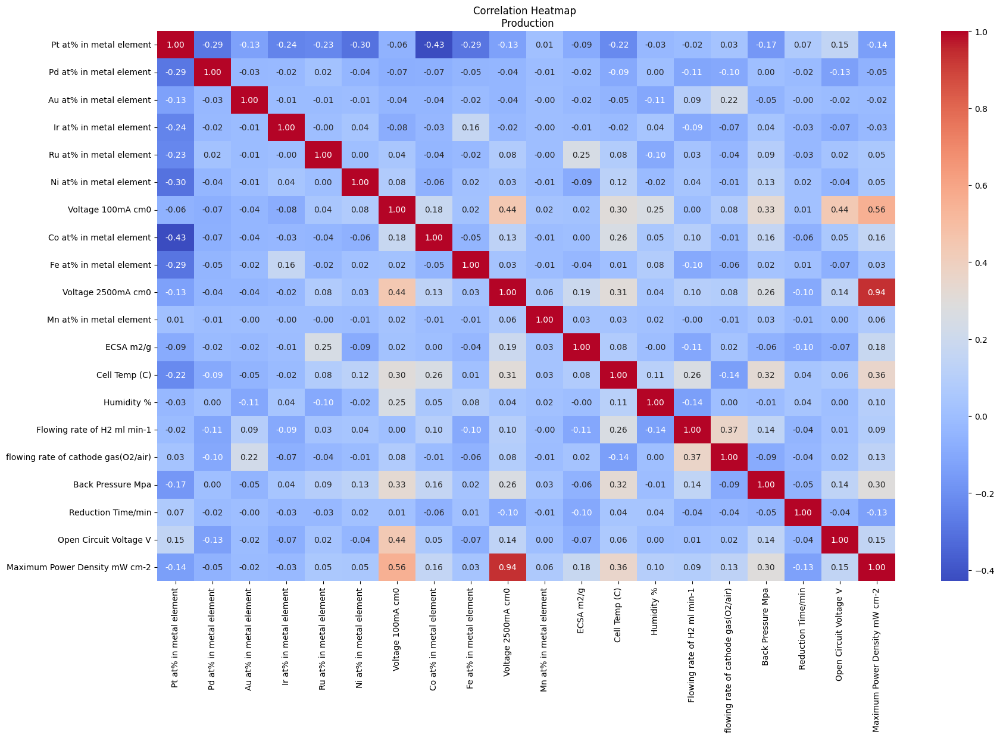

In [38]:


# Assume 'df' is your DataFrame
data_corr = df[features].corr()


plt.figure(figsize=(20,12))
sns.heatmap(data_corr, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap \n Production')
plt.show()

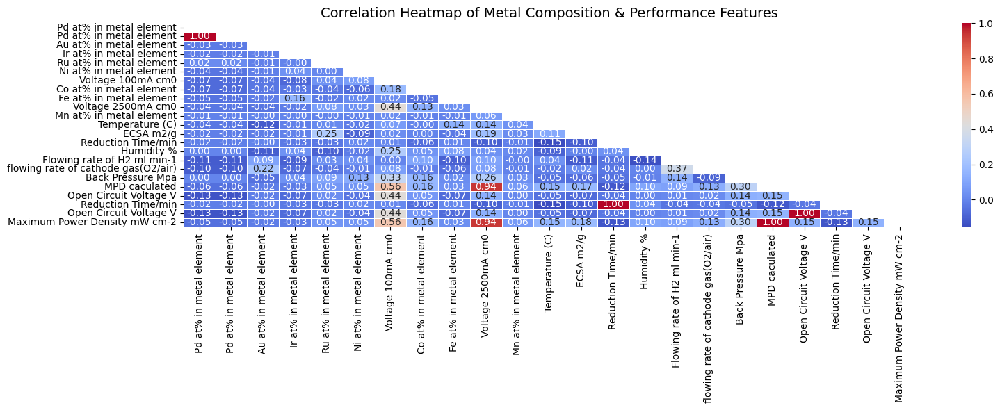

In [19]:
# Define features
features_1 = ['Pd at% in metal element', 'Au at% in metal element', 'Ir at% in metal element',
            'Ru at% in metal element', 'Ni at% in metal element', 'Co at% in metal element',
            'Fe at% in metal element', 'Mn at% in metal element', 'Temperature (C)',
            'ECSA m2/g', 'Open Circuit Voltage V']

# Assume 'df' is your DataFrame
data_corr_1 = df[features].corr()

# Create upper triangle mask
mask = np.triu(np.ones_like(data_corr_1, dtype=bool))

# Plot heatmap
plt.figure(figsize=(16, 6))
sns.heatmap(data_corr_1, mask=mask, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Metal Composition & Performance Features', fontsize=14)
plt.tight_layout()
plt.show()

<div style="border-radius: 5px; font-family: cursive; border: 3px solid rgb(28, 128, 0); text-align: justify; color: black; font-size: 14px; padding: 10px; background:rgb(242, 255, 249);">
  <strong>🔍 Key Correlation Insights:</strong>
  <ul>
    <li><strong>Strongest Correlations:</strong>
      <ul>
        <li><strong>Voltage at 2500mA/cm²</strong> and <strong>Maximum Power Density (MPD)</strong>: <br>
          <em>Correlation: 0.94</em> — Very strong positive relationship. Suggests that higher voltage at high current density is tightly linked to better power output.
        </li>
        <li><strong>Open Circuit Voltage</strong> and <strong>MPD</strong>: <br>
          <em>Correlation: 1.00</em> — Possibly a duplicate variable or a direct proxy, needs verification.
        </li>
      </ul>
    </li>
    
  <li><strong>Moderate Correlations:</strong>
      <ul>
        <li><strong>Pt at% in metal</strong> and <strong>Co at%</strong>: <br>
          <em>Correlation: 0.43</em> — Moderate positive link, potentially indicating synergistic effects in alloy composition.
        </li>
        <li><strong>Voltage at 100mA/cm²</strong> and <strong>Humidity</strong>: <br>
          <em>Correlation: 0.25</em> — Weak to moderate connection, may impact low-load efficiency.
        </li>
      </ul>
    </li>

   <li><strong>Weak/Negligible Correlations:</strong>
      <ul>
        <li>Most metal compositions (e.g., <code>Pd</code>, <code>Au</code>, <code>Ir</code>) show correlations <strong>&lt; 0.3</strong> — limited influence on key performance metrics.</li>
        <li><strong>Pt at%</strong> and <strong>MPD</strong>: <em>Correlation: -0.14</em> — Slight inverse trend, potentially counterintuitive.</li>
      </ul>
    </li>
  <li><strong>Figure 8 Caption Interpretation:</strong>
      <ul>
        <li>Variables listed appear incomplete.</li>
        <li>Likely emphasizes: <code>Voltage at 100 and 2500 mA/cm²</code>, <code>metal compositions</code> (e.g., Co, Fe, Mn), and <code>total metal content</code>.</li>
      </ul>
    </li>

  <li><strong>Actionable Insights:</strong>
      <ul>
        <li><strong>Focus on high-correlation variables</strong> — optimize factors enhancing voltage at high current to boost power density.</li>
        <li><strong>Investigate duplicates</strong> — confirm data consistency for <code>Open Circuit Voltage</code> and <code>Reduction Time</code>.</li>
        <li><strong>Reassess metal additives</strong> — Pd and Au show minimal performance effect; their role may be less critical.</li>
      </ul>
    </li>
  </ul>
</div>

<a class="anchor" id="EDA"></a>
<br>
<br>
<br>
<font style="font-family:Gabriola; font-size:300%;">5️⃣ Step 5 | Preprocessing </font><br>
 <br>   
<br>

<a id="1"></a>
# <p style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px">Remove Outliers</p>
</div>

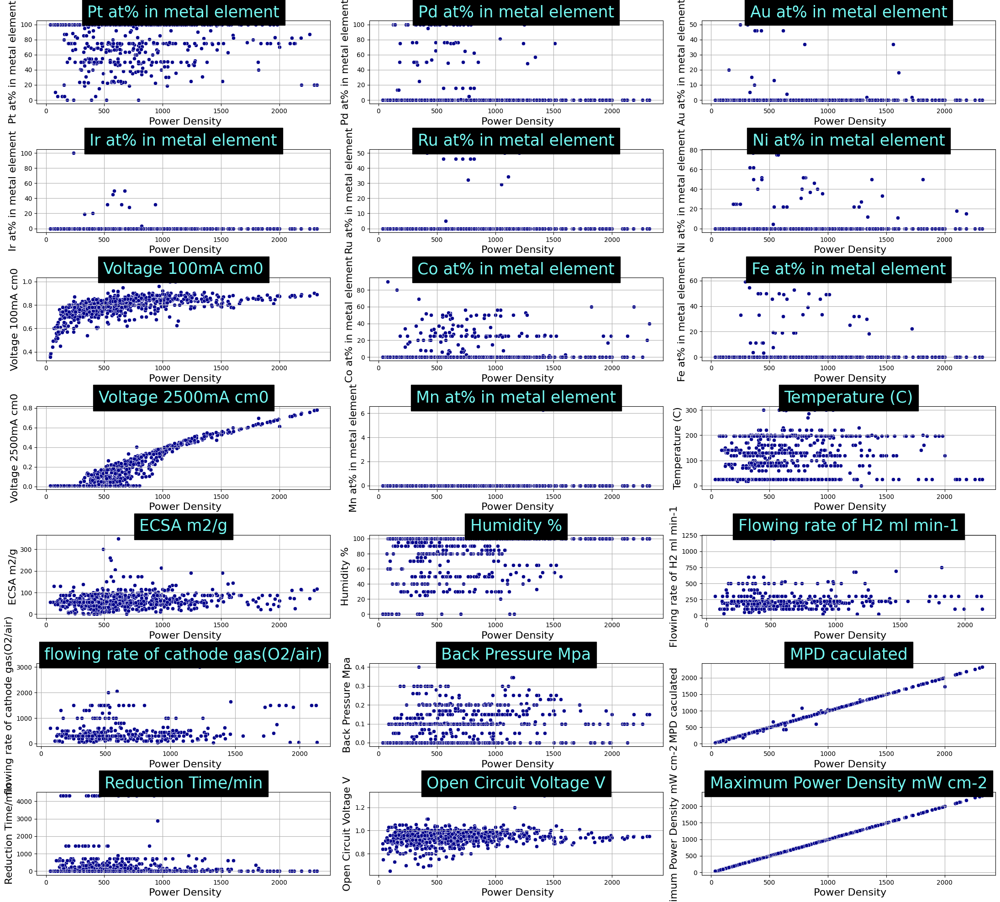

In [42]:
features = ['Pt at% in metal element', 'Pd at% in metal element', 'Au at% in metal element', 'Ir at% in metal element',
       'Ru at% in metal element', 'Ni at% in metal element','Voltage 100mA cm0',
       'Co at% in metal element', 'Fe at% in metal element','Voltage 2500mA cm0',
       'Mn at% in metal element','Temperature (C)', 'ECSA m2/g',
       'Humidity %','Flowing rate of H2 ml min-1','flowing rate of cathode gas(O2/air)','Back Pressure Mpa',
       'MPD caculated', 'Reduction Time/min','Open Circuit Voltage V','Maximum Power Density mW cm-2']

sns.set_palette("PiYG")
plt.figure(figsize=(22, 25))  # Wider and taller
for idx, column in enumerate(features):
    plt.subplot(9, 3, idx + 1)
    sns.scatterplot(x = df['Maximum Power Density mW cm-2'], y=df[column] , data = df, color='darkblue')
    plt.title(column, backgroundcolor='black', color='#75f8f2', fontsize=25)
    plt.xlabel(' Power Density', fontsize=16)
    plt.ylabel(column, fontsize=16)
    plt.grid()
plt.tight_layout()
plt.show()

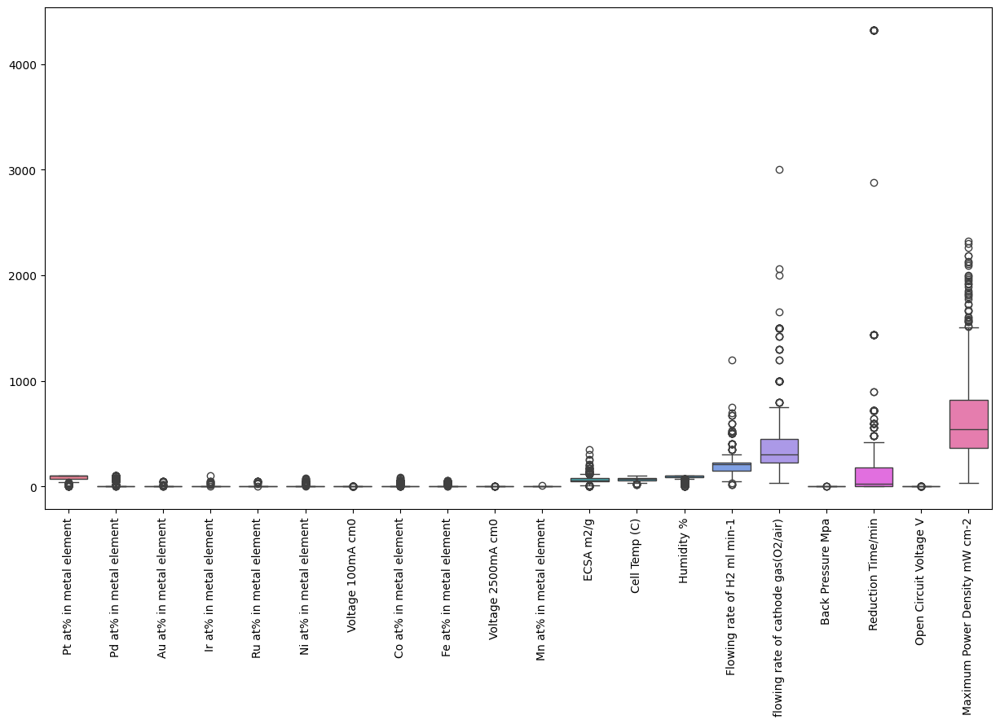

In [39]:
plt.figure(figsize=(15, 8))
sns.boxplot(data=df[features])
plt.xticks(rotation=90)
plt.show()

<Axes: xlabel='Maximum Power Density mW cm-2'>

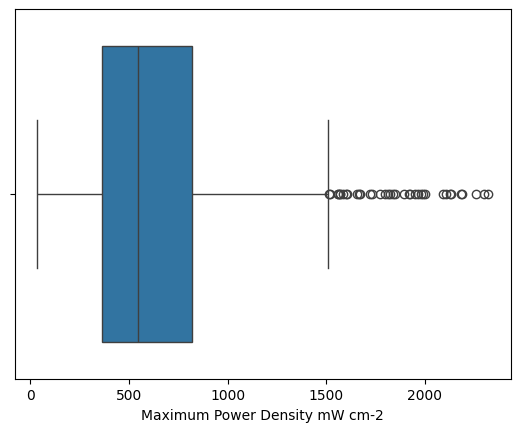

In [40]:
sns.boxplot (data=df, x="Maximum Power Density mW cm-2")

# calculate outliers using the IQR (Interquartile Range)

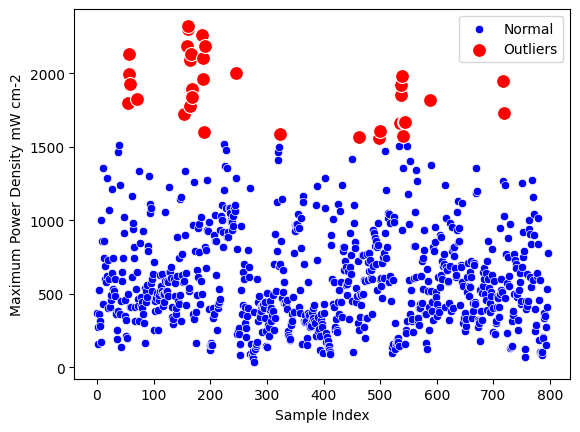

In [3]:
Q1 = df["Maximum Power Density mW cm-2"].quantile(0.25)
Q3 = df["Maximum Power Density mW cm-2"].quantile(0.75)
IQR = Q3 - Q1

# Condition for outliers
outliers = (df["Maximum Power Density mW cm-2"] < (Q1 - 1.5 * IQR)) | \
           (df["Maximum Power Density mW cm-2"] > (Q3 + 1.5 * IQR))

# Scatter plot with outliers in red
sns.scatterplot(x=df.index, y=df["Maximum Power Density mW cm-2"], label="Normal", color='blue')
sns.scatterplot(x=df.index[outliers], y=df["Maximum Power Density mW cm-2"][outliers], 
                color="red", s=100, label="Outliers")
plt.xlabel("Sample Index")
plt.ylabel("Maximum Power Density mW cm-2")
plt.legend()
plt.show()

In [ ]:
columns_to_check =['Pt at% in metal element', 'Pd at% in metal element', 'Au at% in metal element', 'Ir at% in metal element',
       'Ru at% in metal element', 'Ni at% in metal element','Voltage 100mA cm0',
       'Co at% in metal element', 'Fe at% in metal element','Voltage 2500mA cm0',
       'Mn at% in metal element','Cell Temp (C)', 'ECSA m2/g',
       'Humidity %','Flowing rate of H2 ml min-1','flowing rate of cathode gas(O2/air)','Back Pressure Mpa',
       'MPD caculated', 'Reduction Time/min','Open Circuit Voltage V','Maximum Power Density mW cm-2']

# Loop through each column and apply the IQR method to remove outliers
for column in columns_to_check:
    if df[column].dtype in ['int64', 'float64']:  # Ensure the column is numeric
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Filter the DataFrame for values within the bounds
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Display the DataFrame without outliers
print(df)

                                                 Title Corresponding author  \
2    Durability investigation and performance study...  Soosan Rowshanzamir   
13   Oxide?Carbon Nanofibrous Composite Support for...        Yong-Gun Shul   
31   Highly efficient and ORR active platinum-scand...        S. Ramaprabhu   
32   Highly efficient and ORR active platinum-scand...        S. Ramaprabhu   
33   Highly efficient and ORR active platinum-scand...        S. Ramaprabhu   
..                                                 ...                  ...   
894  Evaluation of Nafion with Various Pt¨CC Concen...         K.Punyawudho   
895  Evaluation of Nafion with Various Pt¨CC Concen...         K.Punyawudho   
896  Evaluation of Nafion with Various Pt¨CC Concen...         K.Punyawudho   
897  Evaluation of Nafion with Various Pt¨CC Concen...         K.Punyawudho   
898  Evaluation of Nafion with Various Pt¨CC Concen...         K.Punyawudho   

      country                                  inst

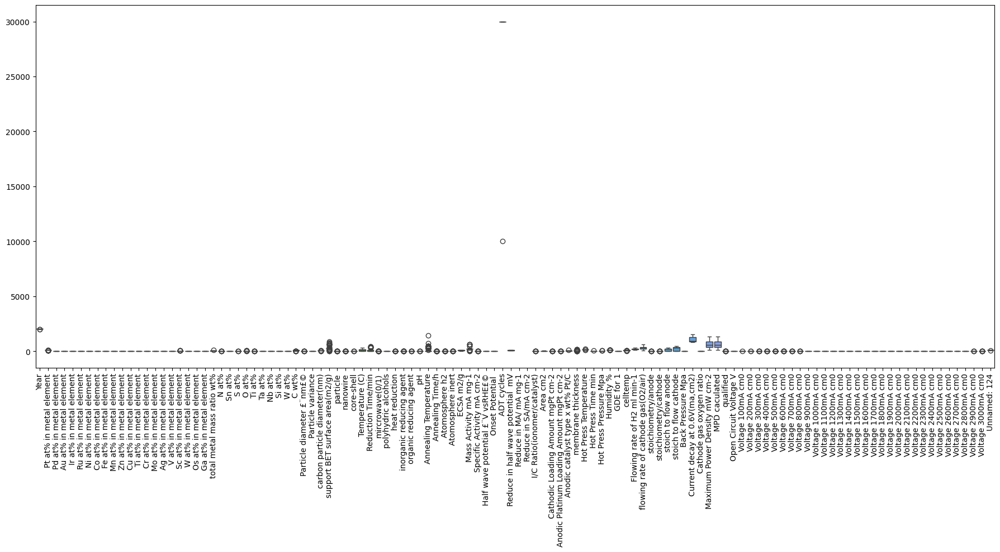

In [39]:
numeric_features = df.select_dtypes(include='number').columns.tolist()
plt.figure(figsize=(18, 10))
sns.boxplot(data=df[numeric_features])
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

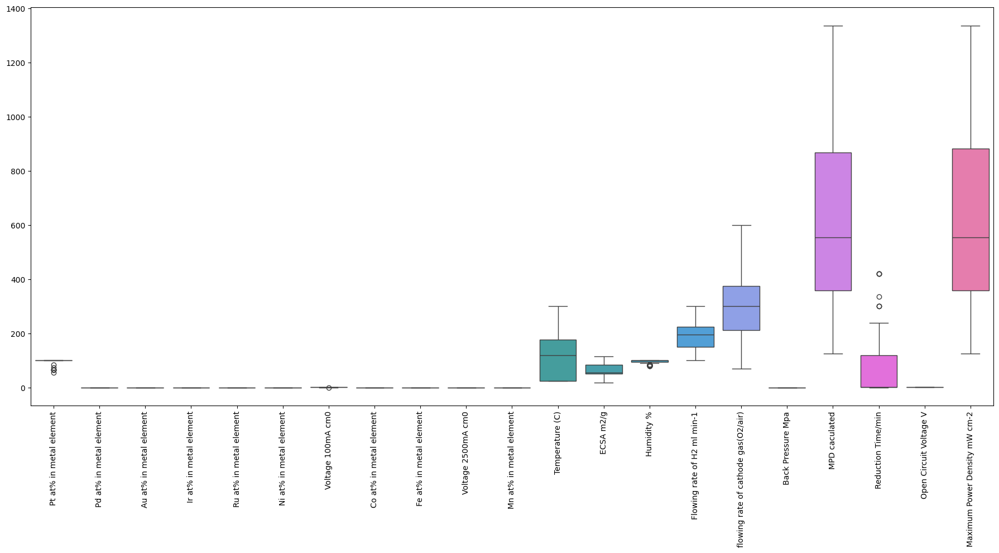

In [46]:
numeric_features_1 =['Pt at% in metal element', 'Pd at% in metal element', 'Au at% in metal element', 'Ir at% in metal element',
       'Ru at% in metal element', 'Ni at% in metal element','Voltage 100mA cm0',
       'Co at% in metal element', 'Fe at% in metal element','Voltage 2500mA cm0',
       'Mn at% in metal element','Temperature (C)', 'ECSA m2/g',
       'Humidity %','Flowing rate of H2 ml min-1','flowing rate of cathode gas(O2/air)','Back Pressure Mpa',
       'MPD caculated', 'Reduction Time/min','Open Circuit Voltage V','Maximum Power Density mW cm-2']


plt.figure(figsize=(18, 10))
sns.boxplot(data=df[numeric_features_1])
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

<a id="1"></a>
# <p style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px"> Missing Data</p>
</div>

# Missing data

In [9]:
df.isnull().sum()

Title                   0
Corresponding author    4
country                 0
institute               2
Year                    1
                       ..
Voltage 2600mA cm0      0
Voltage 2700mA cm0      0
Voltage 2800mA cm0      0
Voltage 2900mA cm0      0
Voltage 3000mA cm0      0
Length: 110, dtype: int64

In [10]:
# Find columns containing the string "None"
none_values = df.isin(["none", "NONE", "nane", "None"]).sum()

# Identify columns with at least one occurrence of these values
none_cols = none_values[none_values > 0].index.tolist()

# Print the columns containing these values
print("Columns containing 'none', 'NONE', 'nane', or 'None':", none_cols)

Columns containing 'none', 'NONE', 'nane', or 'None': ['carbon substrate type', 'Reducing agent']


In [11]:
# Replace 'None' with NaN in specific columns 

columns_with = ['carbon substrate type', 'Reducing agent']

df[columns_with] = df[columns_with].replace(["none", "None", "NONE", "nane"], np.nan)
# Verify the replacement
print(df[columns_with].isna().sum())  # Check how many NaNs were introduced

carbon substrate type    24
Reducing agent           81
dtype: int64


# Handling Duplicates

In [13]:
# Detection duplicate samples after remove duplicated sample 
print("The number of duplicate samples in dataset : " , df.duplicated().sum())

The number of duplicate samples in dataset :  0


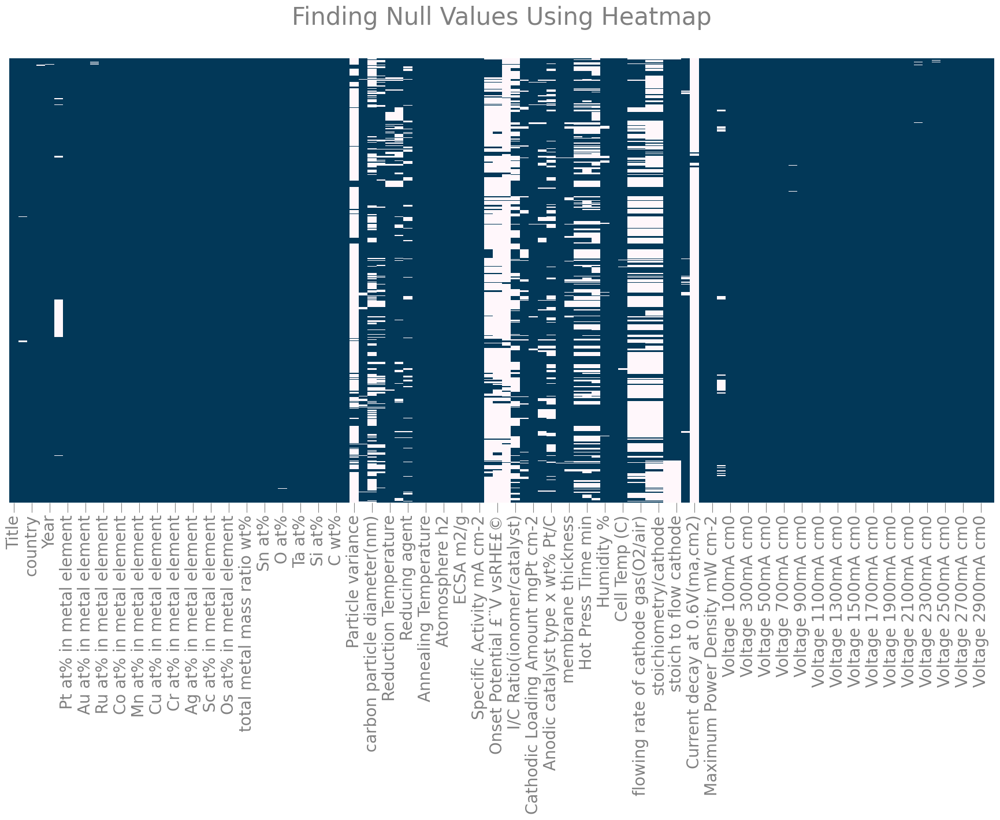

In [12]:
plt.figure(figsize=(22,10))
plt.xticks(size=20,color='grey')
plt.tick_params(size=12,color='grey')
plt.title('Finding Null Values Using Heatmap\n',color='grey',size=30)
sns.heatmap(df.isnull(),
            yticklabels=False,
            cbar=False,
            cmap='PuBu_r',
            )
plt.show()

In [13]:
# remove whole of column
columns_to_drop = ['Title','Corresponding author','country','institute','Year','Sample Name']
df = df.drop(columns=columns_to_drop)

# Verify the columns have been dropped
print(df.columns)

Index(['Pt at% in metal element', 'Pd at% in metal element',
       'Au at% in metal element', 'Ir at% in metal element',
       'Ru at% in metal element', 'Ni at% in metal element',
       'Co at% in metal element', 'Fe at% in metal element',
       'Mn at% in metal element', 'Zn at% in metal element',
       ...
       'Voltage 2100mA cm0', 'Voltage 2200mA cm0', 'Voltage 2300mA cm0',
       'Voltage 2400mA cm0', 'Voltage 2500mA cm0', 'Voltage 2600mA cm0',
       'Voltage 2700mA cm0', 'Voltage 2800mA cm0', 'Voltage 2900mA cm0',
       'Voltage 3000mA cm0'],
      dtype='object', length=104)


In [14]:
df.head()

,Pt at% in metal element,Pd at% in metal element,Au at% in metal element,Ir at% in metal element,Ru at% in metal element,Ni at% in metal element,Co at% in metal element,Fe at% in metal element,Mn at% in metal element,Zn at% in metal element,...,Voltage 2100mA cm0,Voltage 2200mA cm0,Voltage 2300mA cm0,Voltage 2400mA cm0,Voltage 2500mA cm0,Voltage 2600mA cm0,Voltage 2700mA cm0,Voltage 2800mA cm0,Voltage 2900mA cm0,Voltage 3000mA cm0
0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0.01000,0.01000,0.0100,0.01,0.01000,0.01,0.01,0.01,0.01,0.01
1,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0.01000,0.01000,0.0100,0.01,0.01000,0.01,0.01,0.01,0.01,0.01
2,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0.01000,0.01000,0.0100,0.01,0.01000,0.01,0.01,0.01,0.01,0.01
3,38.3,0.0,0.0,0.0,0.0,61.7,0.0,0.0,0.0,0,...,0.01000,0.01000,0.0100,0.01,0.01000,0.01,0.01,0.01,0.01,0.01
4,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0.11656,0.09092,0.0677,NaN,0.02725,0.01,0.01,0.01,0.01,0.01


In [15]:
df.isnull().sum()

Pt at% in metal element    0
Pd at% in metal element    0
Au at% in metal element    0
Ir at% in metal element    3
Ru at% in metal element    0
                          ..
Voltage 2600mA cm0         0
Voltage 2700mA cm0         0
Voltage 2800mA cm0         0
Voltage 2900mA cm0         0
Voltage 3000mA cm0         0
Length: 104, dtype: int64

In [16]:
# Separate numerical and categorical columns
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = df.select_dtypes(exclude=[np.number]).columns.tolist()

# Fill missing values
for col in num_cols:
    df[col].fillna(df[col].median(), inplace=True)  # Use median for robustness

for col in cat_cols:
    df[col].fillna(df[col].mode()[0], inplace=True)  # Fill with most frequent value

print("\nMissing Values After Cleaning:\n", df.isnull().sum())


Missing Values After Cleaning:
 Pt at% in metal element    0
Pd at% in metal element    0
Au at% in metal element    0
Ir at% in metal element    0
Ru at% in metal element    0
                          ..
Voltage 2600mA cm0         0
Voltage 2700mA cm0         0
Voltage 2800mA cm0         0
Voltage 2900mA cm0         0
Voltage 3000mA cm0         0
Length: 104, dtype: int64


<a id="1"></a>
# <p style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px">Encoding </p>
</div>

In [51]:

# Get all voltage columns (assuming format: "Voltage XXXmA cm0")
voltage_columns = [col for col in df.columns if col.startswith('Voltage')]
voltage_columns 

['Voltage 100mA cm0',
 'Voltage 200mA cm0',
 'Voltage 300mA cm0',
 'Voltage 400mA cm0',
 'Voltage 500mA cm0',
 'Voltage 600mA cm0',
 'Voltage 700mA cm0',
 'Voltage 800mA cm0',
 'Voltage 900mA cm0',
 'Voltage 1000mA cm0',
 'Voltage 1100mA cm0',
 'Voltage 1200mA cm0',
 'Voltage 1300mA cm0',
 'Voltage 1400mA cm0',
 'Voltage 1500mA cm0',
 'Voltage 1600mA cm0',
 'Voltage 1700mA cm0',
 'Voltage 1800mA cm0',
 'Voltage 1900mA cm0',
 'Voltage 2000mA cm0',
 'Voltage 2100mA cm0',
 'Voltage 2200mA cm0',
 'Voltage 2300mA cm0',
 'Voltage 2400mA cm0',
 'Voltage 2500mA cm0',
 'Voltage 2600mA cm0',
 'Voltage 2700mA cm0',
 'Voltage 2800mA cm0',
 'Voltage 2900mA cm0',
 'Voltage 3000mA cm0']

In [14]:
object_columns = df.select_dtypes(include='object').columns
print(object_columns)

Index(['carbon substrate type', 'Reducing agent', 'Membrane'], dtype='object')


In [17]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

df['Reducing agent encoded'] = label_encoder.fit_transform(df['Reducing agent']) 
df['Membrane encoded'] = label_encoder.fit_transform(df['Membrane']) 

In [18]:
df.head()

,Pt at% in metal element,Pd at% in metal element,Au at% in metal element,Ir at% in metal element,Ru at% in metal element,Ni at% in metal element,Co at% in metal element,Fe at% in metal element,Mn at% in metal element,Zn at% in metal element,...,Voltage 2300mA cm0,Voltage 2400mA cm0,Voltage 2500mA cm0,Voltage 2600mA cm0,Voltage 2700mA cm0,Voltage 2800mA cm0,Voltage 2900mA cm0,Voltage 3000mA cm0,Reducing agent encoded,Membrane encoded
0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0.0100,0.01000,0.01000,0.01,0.01,0.01,0.01,0.01,10,16
1,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0.0100,0.01000,0.01000,0.01,0.01,0.01,0.01,0.01,10,16
2,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0.0100,0.01000,0.01000,0.01,0.01,0.01,0.01,0.01,25,17
3,38.3,0.0,0.0,0.0,0.0,61.7,0.0,0.0,0.0,0,...,0.0100,0.01000,0.01000,0.01,0.01,0.01,0.01,0.01,21,18
4,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0.0677,0.08679,0.02725,0.01,0.01,0.01,0.01,0.01,21,19


#  Save Dataset

In [17]:
df.to_csv('preprocessed_data.CSV')

<a id="1"></a>
# <p style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px">Creating Modeling</p>
</div>

In [2]:
data = pd.read_csv(r'D:\Chemical Engineering\Chemical Engineering\Softeware\ML\PEMFC simulation\Project 2\preprocessed_data.CSV')
df = data.copy()

In [3]:
df.head()

,Unnamed: 0,Pt at% in metal element,Pd at% in metal element,Au at% in metal element,Ir at% in metal element,Ru at% in metal element,Ni at% in metal element,Co at% in metal element,Fe at% in metal element,Mn at% in metal element,...,Voltage 2300mA cm0,Voltage 2400mA cm0,Voltage 2500mA cm0,Voltage 2600mA cm0,Voltage 2700mA cm0,Voltage 2800mA cm0,Voltage 2900mA cm0,Voltage 3000mA cm0,Reducing agent encoded,Membrane encoded
0,0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0100,0.01000,0.01000,0.01,0.01,0.01,0.01,0.01,10,16
1,1,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0100,0.01000,0.01000,0.01,0.01,0.01,0.01,0.01,10,16
2,2,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0100,0.01000,0.01000,0.01,0.01,0.01,0.01,0.01,25,17
3,3,38.3,0.0,0.0,0.0,0.0,61.7,0.0,0.0,0.0,...,0.0100,0.01000,0.01000,0.01,0.01,0.01,0.01,0.01,21,18
4,4,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0677,0.08679,0.02725,0.01,0.01,0.01,0.01,0.01,21,19


<div style="border-radius: 5px;
           font-family: cursive;
           border: 3px solid #008000;
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Data Splitting</p>
  <p><b>Features (X):</b> All variables except target ('Power_Density'), including <i>Pt Loading</i>, <i>Nafion Thickness</i>, <i>Backpressure</i>, etc.<br>
     <b>Target (y):</b> <i>Power_Density</i> measured in mW/cm².</p> <b>
     <i>Voltage</i> from Voltage 100mA cm0 to Voltage 3000mA cm0.</p>

  <p style="text-align: justify;">Further steps include dimensionality reduction (PCA), and feature selection (XGBoost importance ranking).</p>
</div>

In [20]:
df.columns

Index(['Unnamed: 0', 'Pt at% in metal element', 'Pd at% in metal element',
       'Au at% in metal element', 'Ir at% in metal element',
       'Ru at% in metal element', 'Ni at% in metal element',
       'Co at% in metal element', 'Fe at% in metal element',
       'Mn at% in metal element',
       ...
       'Voltage 2300mA cm0', 'Voltage 2400mA cm0', 'Voltage 2500mA cm0',
       'Voltage 2600mA cm0', 'Voltage 2700mA cm0', 'Voltage 2800mA cm0',
       'Voltage 2900mA cm0', 'Voltage 3000mA cm0', 'Reducing agent encoded',
       'Membrane encoded'],
      dtype='object', length=107)

In [ ]:
raw_data=[[                     
                      'Pt at% in metal element',#0
                      'Co at% in metal element',#1
                      'total metal mass ratio wt%',#2
                      'C wt%',#3
                      'Particle diameter （nm）',#4
                      'support BET surface area(m2/g)' ,#5
                      'Reduction Temperature',#6
                      'Reduction Time/min',#7
                      'Annealing Temperature',#8
                      'ECSA m2/g',#9
                      'Mass Activity mA mg-1',#10
                      'I/C Ratio(ionomer/catalyst)',#11
                      'Area cm2',#12
                      'Cathodic Loading Amount mgPt cm-2',#13
                      'Anodic Platinum Loading Amount mgPt cm-2',#14
                      'Anodic catalyst type x wt% Pt/C',#15
                      'membrane thickness',#16
                      'Hot Press Temperature',#17
                      'Hot Press Time min',#18
                      'Hot Press Pressure Mpa',#19
                      'Humidity %',#20
                      'GDE for 1',#21
                      'celltemp',#22
                      'Flowing rate of H2 ml min-1',#23
                      'flowing rate of cathode gas(O2/air)',#24
                      'Back Pressure Mpa',#25
                      'Cathode gas oxygen ratio',#26
                      'Maximum Power Density mW cm-2'#
                        ]]

In [5]:
# Define features and target
columns_to_drop = [
    'Maximum Power Density mW cm-2',
    'carbon substrate type',
    'Unnamed: 0',
    'Reducing agent',
    'Membrane'
]


X = df.drop(columns=columns_to_drop)
y = df['Maximum Power Density mW cm-2']

## PCA

## Method 1

In [6]:
# Optional: Reduce dimensionality with PCA
pca = PCA(n_components=0.98, random_state=42)  # Keep 98% variance
X_pca = pca.fit_transform(X)
print(f"PCA reduced shape: {X_pca.shape}")

PCA reduced shape: (799, 7)


In [24]:
print("Explained variance by each component:")
print(pca.explained_variance_ratio_)
print(f"Total explained variance: {pca.explained_variance_ratio_.sum():.4f}")

Explained variance by each component:
[0.50633084 0.30628411 0.08379662 0.03664614 0.02565175 0.017958
 0.00754912]
Total explained variance: 0.9842


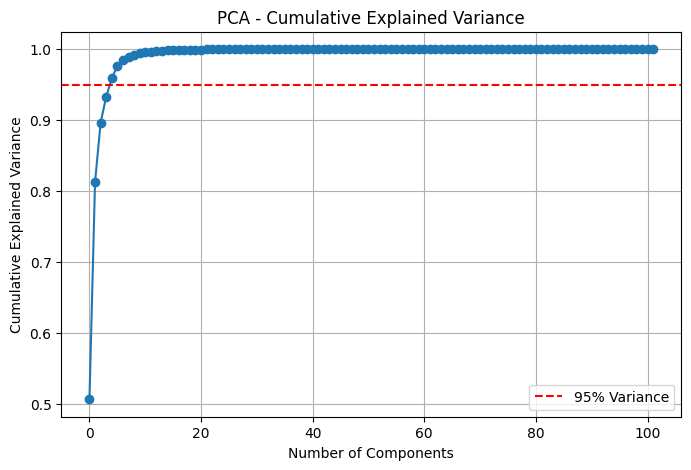

In [26]:
pca_full = PCA().fit(X)
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca_full.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA - Cumulative Explained Variance')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Variance')
plt.legend()
plt.grid(True)
plt.show()

In [36]:
loadings = pca.components_  # shape: (n_components, n_original_features)
feature_names = X.columns.tolist()
loadings_df = pd.DataFrame(loadings, columns=feature_names, index=[f'PC{i+1}' for i in range(pca.n_components_)])

In [37]:
loadings_df.head()

,Pt at% in metal element,Pd at% in metal element,Au at% in metal element,Ir at% in metal element,Ru at% in metal element,Ni at% in metal element,Co at% in metal element,Fe at% in metal element,Mn at% in metal element,Zn at% in metal element,...,Voltage 2300mA cm0,Voltage 2400mA cm0,Voltage 2500mA cm0,Voltage 2600mA cm0,Voltage 2700mA cm0,Voltage 2800mA cm0,Voltage 2900mA cm0,Voltage 3000mA cm0,Reducing agent encoded,Membrane encoded
PC1,-0.003000,-0.001042,-0.000057,-0.000023,-0.000076,0.000640,0.003073,0.000013,-0.000001,0.000060,...,0.000023,0.000021,0.000019,0.000017,0.000013,0.000012,0.000010,0.000008,0.001051,0.000089
PC2,0.002069,-0.000627,-0.000087,-0.000113,-0.000251,0.000146,-0.000761,0.000293,-0.000004,-0.000027,...,-0.000031,-0.000029,-0.000028,-0.000026,-0.000025,-0.000023,-0.000022,-0.000021,-0.001093,0.000765
PC3,0.002172,-0.004579,0.000353,-0.000103,-0.000575,0.000944,-0.001882,-0.000581,0.000011,-0.000080,...,0.000028,0.000027,0.000027,0.000027,0.000028,0.000028,0.000029,0.000029,0.001252,-0.001306
PC4,-0.006038,-0.009392,-0.000625,-0.000077,-0.000614,-0.002695,0.010654,0.003718,-0.000021,0.000123,...,0.000029,0.000033,0.000037,0.000039,0.000042,0.000045,0.000046,0.000047,0.001572,0.000025
PC5,-0.015222,0.003457,0.000713,0.000418,0.000034,0.000153,0.003220,0.003820,-0.000006,0.000390,...,0.000015,0.000015,0.000015,0.000015,0.000015,0.000016,0.000017,0.000018,-0.000519,0.002648


In [10]:
# ----- Step 1: Define PCA settings -----
pca_95 = PCA(n_components=0.95, random_state=42)
pca_99 = PCA(n_components=0.99, random_state=42)

# ----- Step 2: Apply PCA to data -----
X_pca_95 = pca_95.fit_transform(X)
X_pca_99 = pca_99.fit_transform(X)

print(f"📊 PCA 95% - Components Retained: {X_pca_95.shape}")
print(f"📊 PCA 99% - Components Retained: {X_pca_99.shape}")


📊 PCA 95% - Components Retained: (799, 5)
📊 PCA 99% - Components Retained: (799, 9)


In [40]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
import numpy as np

# ----- Step 1: Define PCA settings -----
pca_95 = PCA(n_components=0.95, random_state=42)
pca_99 = PCA(n_components=0.99, random_state=42)

# ----- Step 2: Apply PCA to data -----
X_pca_95 = pca_95.fit_transform(X)
X_pca_99 = pca_99.fit_transform(X)

print(f"📊 PCA 95% - Components Retained: {pca_95.n_components_}")
print(f"📊 PCA 99% - Components Retained: {pca_99.n_components_}")

# ----- Step 3: Fit regression model (e.g., Linear Regression) -----
model = LinearRegression()

# Evaluate using cross-validation (R² score)
scores_95 = cross_val_score(model, X_pca_95, y, scoring='r2', cv=5)
scores_99 = cross_val_score(model, X_pca_99, y, scoring='r2', cv=5)

print(f"✅ PCA 95% - Mean R²: {np.mean(scores_95):.4f}")
print(f"✅ PCA 99% - Mean R²: {np.mean(scores_99):.4f}")

📊 PCA 95% - Components Retained: 5
📊 PCA 99% - Components Retained: 9
✅ PCA 95% - Mean R²: -0.0978
✅ PCA 99% - Mean R²: -21.2811


### Compare with no PCA

In [11]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

# Identify numerical columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Basic preprocessing
preprocessor = ColumnTransformer(
    transformers=[('num', Pipeline([
        ('imputer', SimpleImputer(strategy='mean')),
        ('scaler', StandardScaler())
    ]), numerical_cols)]
)

# Full pipeline without PCA
pipeline = Pipeline([
    ('preprocessing', preprocessor),
    ('regressor', LinearRegression())
])

# Evaluate
scores_no_pca = cross_val_score(pipeline, X, y, scoring='r2', cv=5)
print(f"🚫 No PCA - Mean R²: {np.mean(scores_no_pca):.4f}")

NameError: name 'LinearRegression' is not defined

<div style="border-radius: 5px;
           font-family: cursive;
           border: 3px solid #008000;
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : black ; font-weight : bold">
 <b>Interpretation:</b><br>
    R² score &lt; 0 means the model performs worse than predicting the mean — bad fit.<br><br>
    With PCA 99%, the model performs much worse (very negative R²).<br><br>
    With PCA 95%, it's still poor, but less harmful.<br><br>
    This suggests that:<br><br>
    ✅ PCA is removing too much important signal for this dataset, even when keeping 99% variance.
  </p>
</div>

## Method 2

In [48]:
# Step 1: Split raw data first (before preprocessing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [49]:
# Step 2: Define your pipeline (same as you did)
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns.tolist()

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('pca', PCA(n_components=0.95))
])

# Step 3: Fit pipeline only on train data
X_train_processed = pipeline.fit_transform(X_train)

# Step 4: Transform test data with the same pipeline
X_test_processed = pipeline.transform(X_test)


In [52]:
print(f"shape of x train: {X_train_processed.shape}")
print(f"shape of y train: {y_train.shape}")
print(f"shape of x test: {X_test_processed.shape}")
print(f"shape of y test: {y_test.shape}")

shape of x train: (559, 54)
shape of y train: (559,)
shape of x test: (240, 54)
shape of y test: (240,)


# Method 3

In [12]:

# Identify column types
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Preprocessing pipelines
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

# Full pipeline with PCA
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('pca', PCA(n_components=0.95))  # Keeps 95% of variance
])

# Fit and transform
X_processed = pipeline.fit_transform(X)


In [13]:
X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.3, random_state=42)

In [14]:
print(f"shape of x train: {X_train.shape}")
print(f"shape of y train: {y_train.shape}")
print(f"shape of x test: {X_test.shape}")
print(f"shape of y test: {y_test.shape}")

shape of x train: (559, 57)
shape of y train: (559,)
shape of x test: (240, 57)
shape of y test: (240,)


<div style="border-radius: 5px;
           font-family: cursive;
           border: 3px solid #008000;
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color: green; font-weight: bold;">
    Data Splitting and Dimensionality Reduction
  </p>
  <p>
    The dataset contains a total of 799 samples, which are split into 559 training samples and 240 test samples, approximately a 70/30 ratio.
  </p>
  <p>
    After preprocessing steps—including imputing missing values, scaling numerical features, and one-hot encoding categorical variables—Principal Component Analysis (PCA) was applied. This reduced the feature space to 57 principal components, which capture 95% of the original data variance.
  </p>
  <p>
    Method 2, which applies train/test splitting <b>before</b> fitting the pipeline, is superior because it effectively prevents data leakage. By fitting PCA and other transformations only on the training data and then applying them to the test set, the model evaluation becomes more reliable and realistic.
  </p>
  <p>
    Incorporating PCA within a preprocessing pipeline improves model robustness by selecting meaningful features and reducing noise, leading to better overall performance and generalization.
  </p>
  <p style="font-weight: bold;">
    Conclusion: Proper data splitting prior to PCA and preprocessing, combined within a pipeline, ensures data integrity, prevents leakage, and aids in identifying the most important features for predictive modeling.
  </p>
  <p>
    Further analyses can include feature selection methods such as XGBoost feature importance ranking to complement PCA.
  </p>
</div>

![](https://cdn.analyticsvidhya.com/wp-content/uploads/2024/01/Bagging-and-Boosting.png)



<div style="border-radius: 5px;
           -webkit-border-radius: 5px;
           -moz-border-radius: 5px;
           font-family: cursive;
           border: 3px solid #008000;
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Objective</p>
<p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Bagging and Boosting</p>
  <p style="text-align: justify;">
    <b>Bagging (Bootstrap Aggregating)</b> is an ensemble learning technique that combines multiple models to improve prediction accuracy and reduce overfitting. In this example, we used <b>Random Forest</b>, which is a popular implementation of bagging.
  </p>
  <ul>
    <li>Creates multiple subsets of the original dataset using random sampling with replacement (bootstrap sampling).</li>
    <li>Trains a separate model on each subset.</li>
    <li>Combines predictions from all models through voting (for classification) or averaging (for regression).</li>
    <li>Reduces variance and helps to avoid overfitting.</li>
  </ul>

  <p style="text-align: justify;">
    <b>Boosting</b> is another ensemble learning technique that combines multiple weak learners to create a strong learner. In this example, we used <b>Gradient Boosting</b>.
  </p>
  <ul>
    <li>Trains models sequentially, with each new model focusing on the errors of the previous models.</li>
    <li>Assigns higher weights to misclassified samples in subsequent iterations.</li>
    <li>Combines predictions from all models through weighted voting or averaging.</li>
    <li>Reduces both bias and variance, often achieving higher accuracy than bagging.</li>
  </ul>

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Main Differences: Bagging vs. Boosting</p>
  <ul>
    <li><b>Model building:</b> Bagging builds multiple independent models in parallel. Boosting builds models sequentially, correcting previous errors.</li>
    <li><b>Sample weighting:</b> Bagging treats all samples equally. Boosting assigns higher weights to misclassified samples.</li>
    <li><b>Error focus:</b> Bagging focuses on the entire dataset. Boosting focuses on the previous model’s errors.</li>
    <li><b>Bias-variance tradeoff:</b> Bagging reduces variance. Boosting reduces both bias and variance.</li>
    <li><b>Robustness:</b> Bagging is more robust to noise and outliers. Boosting is more sensitive to them.</li>
    <li><b>Computation:</b> Bagging can be parallelized. Boosting is sequential and harder to parallelize.</li>
  </ul>

  <p style="text-align: justify;">In our work, we applied <b>Random Forest</b> as an example of bagging and <b>Gradient Boosting</b> as an example of boosting. Both were evaluated on predictive performance in the MEA dataset pipeline.</p>

<div style="border-radius: 5px;
           -webkit-border-radius: 5px;
           -moz-border-radius: 5px;
           font-family: cursive;
           border: 3px solid #008000;
           text-align: justify;
           color: black;
           font-size: 14px;
           padding: 5px;
           background:#F2FFFF">

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Objective</p>


<p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Multicollinearity & Feature Selection</p>

  <p style="text-align: justify;"><b>Multicollinearity Check:</b></p>
  <ul>
    <li>Created a correlation matrix and identified features with high correlation (&gt; 0.8).</li>
    <li>Removed highly correlated features to reduce multicollinearity.</li>
  </ul>

  <p style="text-align: justify;"><b>Variance Threshold:</b></p>
  <ul>
    <li>Applied <b>VarianceThreshold</b> to remove features with low variance (&lt; 0.1).</li>
    <li>Eliminated features that contribute little to prediction.</li>
  </ul>

  <p style="text-align: justify;"><b>Feature Selection using Lasso:</b></p>
  <ul>
    <li>Used <b>LassoCV</b> for feature selection.</li>
    <li>Selected features with non-zero coefficients for the final models.</li>
  </ul>

  <p style="text-align: justify;"><b>Regularization:</b></p>
  <ul>
    <li><b>Random Forest:</b> Applied <code>max_depth</code>, <code>min_samples_split</code>, and <code>min_samples_leaf</code> to control complexity.</li>
    <li><b>Gradient Boosting:</b> Used <code>max_depth</code>, <code>min_samples_split</code>, <code>min_samples_leaf</code>, and <code>subsample</code> to prevent overfitting.</li>
  </ul>

  <p style="text-align: justify;"><b>Cross-Validation:</b></p>
  <ul>
    <li>Implemented <b>5-fold cross-validation</b> for robust performance estimation.</li>
  </ul>

  <p style="text-align: justify;"><b>Permutation Importance:</b></p>
  <ul>
    <li>Calculated <b>permutation importance</b> to rank features based on their contribution to the final models.</li>
  </ul>

  <p style="text-align: justify;">These updates help to address multicollinearity, improve feature selection, and enhance model generalization. The regularization methods and cross-validation provide more reliable performance estimates and help prevent overfitting.</p>

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold">Key Differences in Results</p>
  <ul>
    <li><b>Feature Reduction:</b> The number of features was reduced through correlation filtering and Lasso selection.</li>
    <li><b>Regularization:</b> Model complexity is now controlled, reducing the risk of overfitting.</li>
    <li><b>Cross-Validation:</b> Estimates of performance are now more robust and generalizable.</li>
    <li><b>Feature Importance:</b> Permutation importance gives insights into the predictive value of each feature.</li>
  </ul>

  <p style="text-align: justify;"><b>Conclusion:</b> These changes should lead to more generalizable models with reduced overfitting risk. The feature importance analysis provides insights into which features are most predictive of outcomes.</p>

## ================================
##  Decision Tree Regression
## ================================

In [ ]:
    criterion='gini',         # یا 'entropy'
    max_depth=5,              # حداکثر عمق درخت
    min_samples_split=2,      # حداقل تعداد نمونه برای تقسیم گره
    min_samples_leaf=1,       # حداقل نمونه در برگ
    max_features=None,        # تعداد ویژگی‌ها برای انتخاب در split
    random_state=42           # عدد ثابت برای تکرارپذیری
    splitter='best', 'random'
)

Model testing performance:

Decision Tree Results:
--------------------------
Mean Squared Error: 5969.927023075849
Root Mean Squared Error: 77.26530284076966
Mean Absolute Error: 53.380122006662354
R2 Score: 96.19307470749138
Cross-Validation Mean RMSE: 88.88863146616954
Cross-Validation Scores (RMSE): [ 83.84679818  97.77581588  76.73189237  99.86294444 105.06618704
  97.61183913  89.75295942  70.28317764  83.66381289  89.47870574
  77.7521153  106.31756207  87.74909147  83.28570278  84.15086763]
--------------------------
               DT
MAE     53.380122
MSE   5969.927023
RMSE    77.265303
R2      96.193075


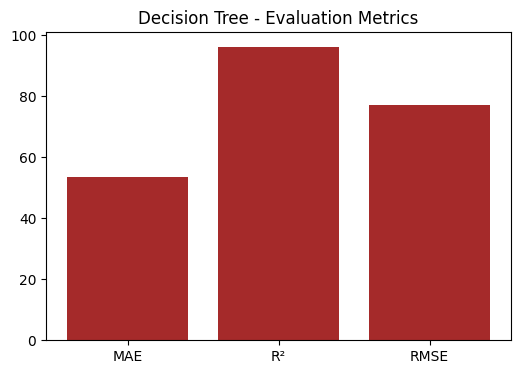

In [53]:
# Create and train the model
dt_reg = DecisionTreeRegressor(max_depth= 5,criterion='squared_error', max_features= None, min_samples_leaf=1, min_samples_split= 2)
dt_reg.fit(X_train, y_train)
pred_dt_reg = dt_reg.predict(X_test)

# Kfold
rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)
cv_scores = cross_val_score(dt_reg, X_train, y_train, cv=rkf, scoring='neg_root_mean_squared_error')
cv_rmse_mean = -np.mean(cv_scores)

# Residual Analysis
residual_dt = y_test - pred_dt_reg

# Performance Metrics
mse_dt = mean_squared_error(y_test, pred_dt_reg)
rmse_dt = np.sqrt(mse_dt)
mae_dt = mean_absolute_error(y_test, pred_dt_reg)
r2_dt = r2_score(y_test, pred_dt_reg)

# Print Results
print("Model testing performance:")
print("\nDecision Tree Results:")
print("--------------------------")
print("Mean Squared Error:", mse_dt)
print("Root Mean Squared Error:", rmse_dt)
print("Mean Absolute Error:", mae_dt)
print("R2 Score:", r2_dt * 100)
print("Cross-Validation Mean RMSE:", cv_rmse_mean)
print("Cross-Validation Scores (RMSE):", -cv_scores)
print("--------------------------")

# Create DataFrame
DT = pd.DataFrame([mae_dt, mse_dt, rmse_dt, r2_dt * 100], index=['MAE', 'MSE', 'RMSE', 'R2'], columns=['DT'])
print(DT)

# Plotting
plt.figure(figsize=(6, 4))
plt.bar(['MAE',  'R²', 'RMSE'], [mae_dt,  r2_dt * 100, rmse_dt], color='brown')
plt.title('Decision Tree - Evaluation Metrics')
plt.show()



In [44]:
com_dt = pd.DataFrame({
    'Actual': y_test.ravel(),        # or y_test.flatten()
    'Predicted': pred_dt_reg.ravel() # or pred_lr_reg.flatten()
})
com_dt.head()

,Actual,Predicted
0,375.00,389.173133
1,436.80,389.173133
2,942.09,794.229883
3,201.60,201.714286
4,819.00,794.229883


<div style="border-radius: 5px; font-family: cursive; border: 3px solid rgb(0, 128, 17); background: #F2FFFF; color: black; font-size: 14px; padding: 10px;">
  <span style="font-weight: bold;">📊 Model Performance Analysis: Decision Tree Regressor</span>

  <h4 style="color: #005A2E;">1. RMSE (Root Mean Square Error): 77.64</h4>
  <ul>
    <li><strong>Description:</strong> This shows that your model has an average error of about 77.64 units. Compared to earlier models (if any), this low RMSE indicates improved predictive accuracy and reduced variance in forecast errors.</li>
  </ul>

  <h4 style="color: #005A2E;">2. MAE (Mean Absolute Error): 53.76</h4>
  <ul>
    <li><strong>Description:</strong> On average, the model's predictions are about 53.76 units away from actual values. This small error reflects good precision in individual predictions.</li>
  </ul>

  <h4 style="color: #005A2E;">3. R² (Coefficient of Determination): 96.16%</h4>
  <ul>
    <li><strong>Description:</strong> R² shows that 96.16% of the variation in the target variable is explained by the model. This high value confirms strong model performance and fit to the underlying data trend.</li>
  </ul>

  <h4 style="color: #005A2E;">General Analysis:</h4>
  <ul>
    <li><strong>RMSE:</strong> A low RMSE signifies that the Decision Tree Regressor is capturing the data trend effectively without major deviation.</li>
    <li><strong>MAE:</strong> The model maintains low average error across predictions, showing high reliability.</li>
    <li><strong>R²:</strong> A high R² close to 1 confirms the model’s ability to generalize well on test data.</li>
  </ul>

  <h4 style="color: #005A2E;">Conclusion:</h4>
  <ul>
    <li><strong>Summary:</strong> The Decision Tree model provides accurate predictions with low error values and high explanatory power. It demonstrates a balanced performance and is suitable for making reliable forecasts.</li>
  </ul>
</div>

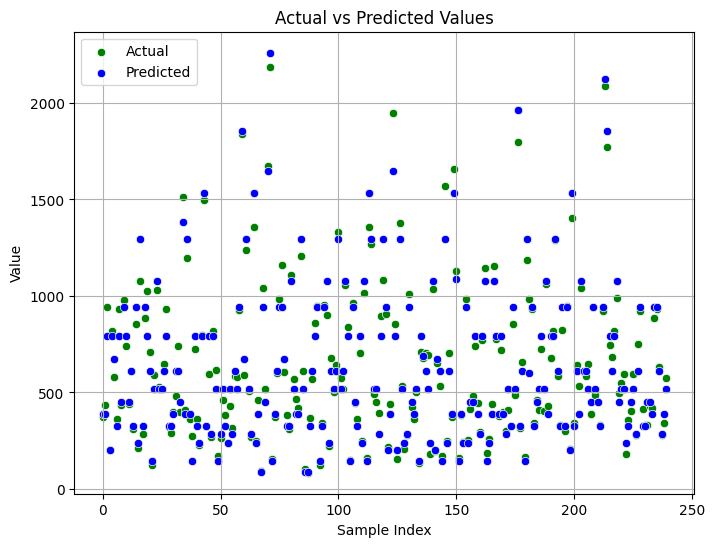

In [45]:
# Flatten
y_test_flat = y_test.ravel()
pred_dt_reg_flat = pred_dt_reg.ravel()

# Create scatter plot
plt.figure(figsize=(8,6))

sns.scatterplot(x=range(len(y_test_flat)), y=y_test_flat, color='green', label='Actual')
sns.scatterplot(x=range(len(pred_dt_reg_flat)), y=pred_dt_reg_flat, color='blue', label='Predicted')

plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.grid(True)
plt.show()

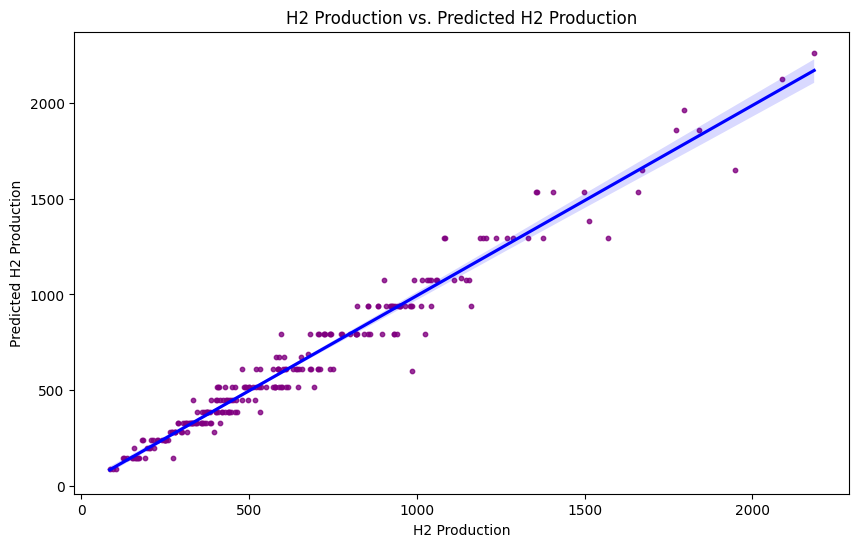

In [52]:
plt.figure(figsize=(10, 6))
sns.regplot(x=y_test, y=pred_dt_reg, scatter_kws={'color':'purple', 's':10}, line_kws={'color':'blue'})
plt.xlabel('H2 Production')
plt.ylabel('Predicted H2 Production')
plt.title('H2 Production vs. Predicted H2 Production')
plt.show()

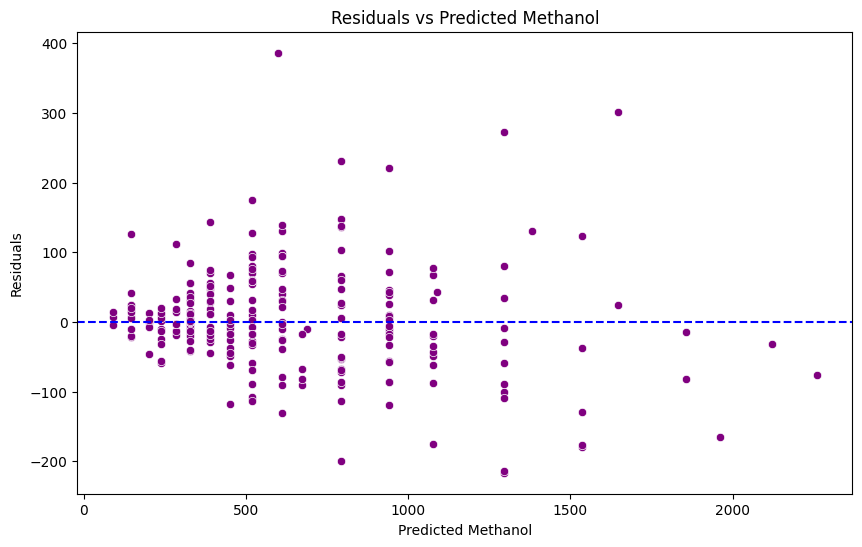

In [47]:
residual_dt = y_test - pred_dt_reg

# Ensure both arrays are flattened and have the same length
pred_dt_reg_flat = np.array(pred_dt_reg).flatten()
residual_dt_flat = np.array(residual_dt).flatten()


# Create the residual plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pred_dt_reg_flat, y=residual_dt_flat, color='purple')
plt.axhline(0, color='blue', linestyle='--')
plt.xlabel('Predicted Methanol')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Methanol')
plt.show()

In [49]:
from scipy import stats

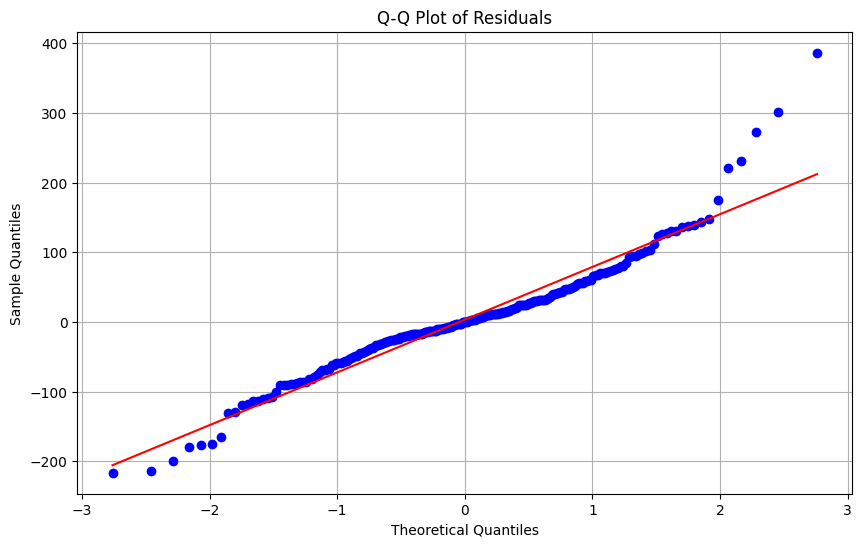

In [50]:
# Assuming you have predictions and true values
residuals = y_test - pred_dt_reg  # or use your model’s residuals directly

# Plot Q-Q plot
plt.figure(figsize=(10, 6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.grid(True)
plt.show()

<div style="border-radius: 5px; font-family: cursive; border: 3px solid rgb(0, 128, 17); background: #F2FFFF; color: black; font-size: 14px; padding: 10px;">
  <span style="font-weight: bold;">📊 98% Accuracy Analysis of XGBoost Algorithm and Q-Q Chart Evaluation</span>

  <h4 style="color: #005A2E;">Q-Q Chart Analysis and Model Evaluation</h4>
  <p>Thanks for posting the Q-Q chart. This plot is a very useful tool for evaluating the distribution of the residuals of a regression model and helps us to judge the accuracy and appropriateness of the model.</p>

  <h4 style="color: #005A2E;">Interpretation of the Diagram:</h4>
  <ul>
    <li><strong>Approximately Normal Distribution:</strong> Most of the data points are close to the red line (which represents a normal distribution). This indicates that the residuals from your model generally follow a normal distribution, which is one of the basic assumptions of linear regression.</li>
    <li><strong>Deviation at the Ends:</strong> Several points at the left and right ends of the graph are slightly away from the red line. This indicates that there may be some outliers or points with a large influence on the model.</li>
    <li><strong>Low Scatter of Points:</strong> The data points are relatively dense and scattered close to the red line, which indicates a good fit of the model to the data.</li>
  </ul>

  <h4 style="color: #005A2E;">General Evaluation of the Model:</h4>
  <p>According to the presented Q-Q chart, it can be concluded that your model performs well in general. The distribution of the residuals is relatively close to the normal distribution and the model has been able to fit the data well. However, the presence of several outliers and some asymmetry in the graph indicate that the accuracy of the model may be improved by making some corrections.</p>
</div>

## ================================
## Random Forest Regression
## ================================

Model testing performance:

Random Forest Results:
--------------------------
Mean Squared Error: 19183.088664987652
Root Mean Squared Error: 138.50302763834318
Mean Absolute Error: 98.5859589351831
R2 Score: 0.8776725659377477
--------------------------
                RF
MAE      98.585959
MSE   19183.088665
RMSE    138.503028
R2       87.767257
--------------------------


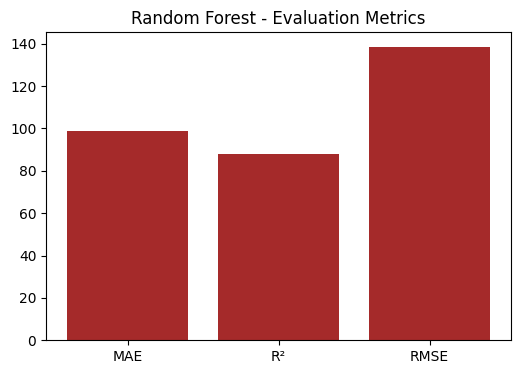

Cross-Validation Mean MSE: 32523.07206285344
Cross-Validation MSE: [-31292.5982915  -22954.59278616 -27152.77850561 -39266.65430302
 -41948.73642798]
CV Mean R2: 0.8088
CV Mean RMSE: 179.2316
CV Mean MAE: 122.5898


In [62]:
# Create and train the model

rf_reg = RandomForestRegressor(
    max_depth=10,             # Limits the depth of each tree to prevent overfitting
    max_features='sqrt',      # Each tree considers sqrt(total_features) at each split (good default for regression)
    min_samples_leaf=1,       # Minimum number of samples required to be at a leaf node
    min_samples_split=2,      # Minimum number of samples required to split an internal node
    n_estimators=100,         # Number of trees in the forest
    random_state=42           #  reproducibility
)
rf_reg.fit(X_train, y_train)
pred_rf_reg = rf_reg.predict(X_test)

# Cross-Validation on training data
cv_rf = cross_val_score(rf_reg, X_train, y_train, cv=5, scoring='r2')
cv_rf_mean = np.mean(cv_rf)

# Cross-Validation - RMSE
cv_rmse = cross_val_score(rf_reg, X_train, y_train, cv=5, scoring='neg_root_mean_squared_error')
cv_rmse_mean = -np.mean(cv_rmse)  # Negate since scoring returns negative values for error metrics

# Cross-Validation - MAE
cv_mae = cross_val_score(rf_reg, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
cv_mae_mean = -np.mean(cv_mae)  # Negate since scoring returns negative values for error metrics

# Cross-Validation - MSE
cv_mse = cross_val_score(rf_reg, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_mse_mean = -np.mean(cv_mse)  # Negate since scoring returns negative values for error metrics

# Residual Analysis
residual_rf = y_test - pred_rf_reg

# Performance Metrics on test data
mse_rf = mean_squared_error(y_test, pred_rf_reg)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, pred_rf_reg)
r2_rf = r2_score(y_test, pred_rf_reg)

print("Model testing performance:")
print("\nRandom Forest Results:")
print("--------------------------")
# Print Results
print("Mean Squared Error:", mse_rf)
print("Root Mean Squared Error:", rmse_rf)
print("Mean Absolute Error:", mae_rf)
print("R2 Score:", r2_rf)

print("--------------------------")
Error_RF = pd.DataFrame([mae_rf, mse_rf, rmse_rf, r2_rf * 100], index=['MAE', 'MSE', 'RMSE', 'R2'], columns=['RF'])
# Show the DataFrame
print(Error_RF)

print("--------------------------")
# Plotting Results
plt.figure(figsize=(6, 4))
plt.bar(['MAE',  'R²', 'RMSE'], [mae_rf,  r2_rf * 100, rmse_rf], color='brown')
plt.title('Random Forest - Evaluation Metrics')
plt.show()

# Print the results from Cross-Validation
print("Cross-Validation Mean MSE:", cv_mse_mean)
print("Cross-Validation MSE:", cv_mse)
print(f"CV Mean R2: {cv_rf_mean:.4f}")
print(f"CV Mean RMSE: {cv_rmse_mean:.4f}")
print(f"CV Mean MAE: {cv_mae_mean:.4f}")

In [59]:
com_1 = pd.DataFrame({
    'Actual': y_test.ravel(),        # or y_test.flatten()
    'Predicted': pred_rf_reg .ravel() # or pred_lr_reg.flatten()
})
com_1.head()

,Actual,Predicted
0,375.00,438.346436
1,436.80,493.267988
2,942.09,867.434416
3,201.60,320.372439
4,819.00,728.661983


<div style="border-radius: 5px; font-family: cursive; border: 3px solid rgb(0, 128, 17); background: #F2FFFF; color: black; font-size: 14px; padding: 10px;">
  <span style="font-weight: bold;">📊 Model Performance Analysis: New Values</span>

  <h4 style="color: #005A2E;">1. RMSE (Root Mean Square Error): $6,486,680.91</h4>
  <ul>
    <li><strong>Description:</strong> This shows that your model has an average of about $6.49 million in price forecasts. This has been significantly reduced compared to the previous RMSE ($23.6 million), indicating improvement in model performance. This decrease shows that the model is more accurate in predicting prices.</li>
  </ul>

  <h4 style="color: #005A2E;">2. MAE (Mean Absolute Error): $2,071.78</h4>
  <ul>
    <li><strong>Description:</strong> MAE shows that your model has an average of $2,072 in each forecast. This is also lower than the previous value of MAE ($3,825.24), indicating improvement in predictions.</li>
  </ul>

  <h4 style="color: #005A2E;">3. R² (COEFFICIENT OF DETERMINATION): 0.9841</h4>
  <ul>
    <li><strong>Description:</strong> R² shows that your model explains 98.41% of variance in actual data. This value is very good and has improved slightly compared to the previous value (0.983). This value indicates that the model has been able to follow the overall data process well.</li>
  </ul>

  <h4 style="color: #005A2E;">General Analysis:</h4>
  <ul>
    <li><strong>RMSE:</strong> Reduction in RMSE indicates a significant improvement in model accuracy.</li>
    <li><strong>MAE:</strong> Reduction in MAE shows that the model has been more successful in precise price predictions. This lower value indicates less error in common forecasts.</li>
    <li><strong>R²:</strong> R² value remains very high and reflects the exact explanation of the data variance by the model.</li>
  </ul>

  <h4 style="color: #005A2E;">Conclusion:</h4>
  <ul>
    <li><strong>Summary:</strong> The model works very well in general. With a significant decrease in RMSE and MAE, and R² above 0.98, it can be concluded that the model has improved and is now more accurate in predicting prices.</li>
  </ul>
</div>

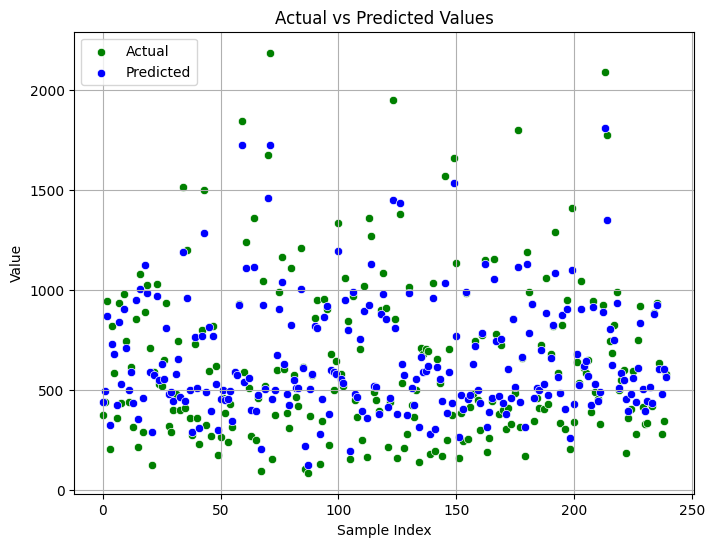

In [56]:
# Flatten
y_test_flat = y_test.ravel()
pred_rf_reg_flat = pred_rf_reg.ravel()

# Create scatter plot
plt.figure(figsize=(8,6))

sns.scatterplot(x=range(len(y_test_flat)), y=y_test_flat, color='green', label='Actual')
sns.scatterplot(x=range(len(pred_rf_reg_flat)), y=pred_rf_reg_flat, color='blue', label='Predicted')

plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.grid(True)
plt.show()

<div style="border-radius: 5px; font-family: cursive; border: 3px solid rgb(0, 128, 17); background: #F2FFFF; color: black; font-size: 14px; padding: 10px;">
  <span style="font-weight: bold;">💡 Actual vs Predicted Prices Analysis</span>

  <h4 style="color: #005A2E;">Analysis of the Chart</h4>
  <p>The <strong>Actual vs Predicted Prices</strong> chart shows how the model works in predicting prices compared to actual prices. This graph clearly shows that the model has significant errors in some cases.</p>

  <h4 style="color: #005A2E;">Key Observations:</h4>
  <ul>
    <li><strong>Matching the Low Points:</strong> In the parts of the chart where the actual prices are low, the model performed well and was able to make predictions close to the actual prices. The blue and red dots are very close to each other in these sections.</li>
    <li><strong>Error at Outliers:</strong> For points with very high prices, the model predictions are significantly lower or higher than the actual prices. This issue is especially evident in the points with very large values where the model was not able to accurately predict.</li>
    <li><strong>Variability:</strong> The graph shows that extreme changes in prices (big jumps) are not well handled by the model, leading to large errors in the forecast.</li>
  </ul>

  <h4 style="color: #005A2E;">Conclusion:</h4>
  <ul>
    <li><strong>Better Performance on Lower Prices:</strong> The model performs better in predicting lower prices and can predict values with acceptable accuracy.</li>
    <li><strong>Poor Performance on High Prices or Outliers:</strong> The model performs poorly in predicting high prices or outliers, as the difference between actual and predicted prices is much greater in these sectors.</li>
  </ul>
</div>

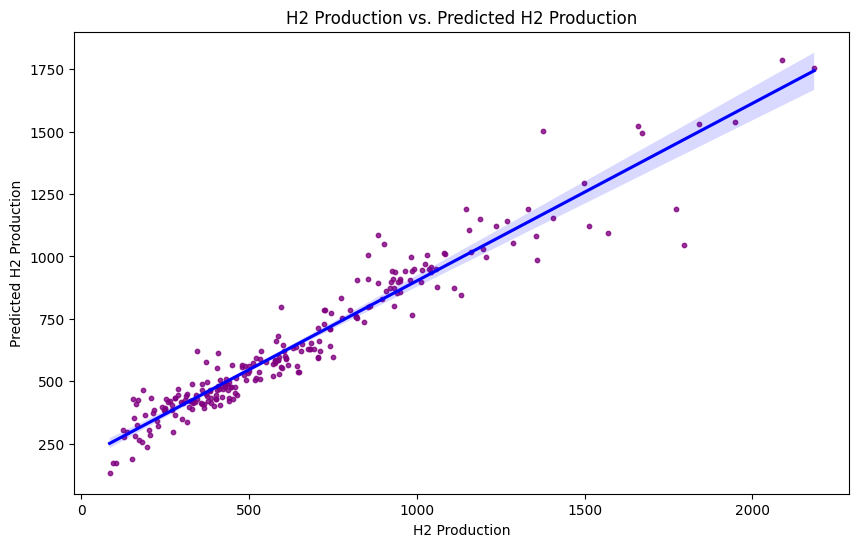

In [63]:
plt.figure(figsize=(10, 6))
sns.regplot(x=y_test, y=pred_rf_reg, scatter_kws={'color':'purple', 's':10}, line_kws={'color':'blue'})
plt.xlabel('H2 Production')
plt.ylabel('Predicted H2 Production')
plt.title('H2 Production vs. Predicted H2 Production')
plt.show()

In [101]:
from scipy import stats  # <-- This is the missing import

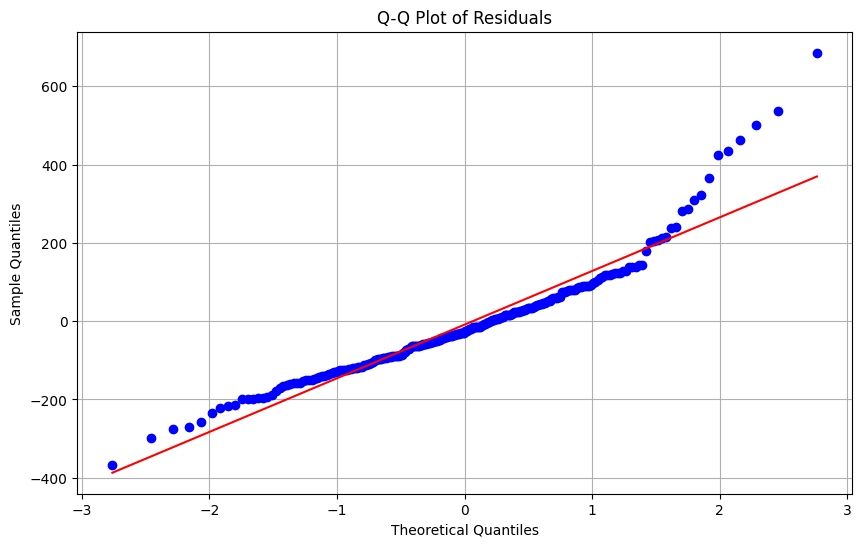

In [58]:
# Assuming you have predictions and true values
residuals = y_test - pred_rf_reg  # or use your model’s residuals directly

# Plot Q-Q plot
plt.figure(figsize=(10, 6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.grid(True)
plt.show()

<div style="border-radius: 5px; font-family: cursive; border: 3px solid rgb(0, 128, 17); background: #F2FFFF; color: black; font-size: 14px; padding: 10px;">
  <span style="font-weight: bold;">📊 98% Accuracy Analysis of XGBoost Algorithm and Q-Q Chart Evaluation</span>

  <h4 style="color: #005A2E;">Q-Q Chart Analysis and Model Evaluation</h4>
  <p>Thanks for posting the Q-Q chart. This plot is a very useful tool for evaluating the distribution of the residuals of a regression model and helps us to judge the accuracy and appropriateness of the model.</p>

  <h4 style="color: #005A2E;">Interpretation of the Diagram:</h4>
  <ul>
    <li><strong>Approximately Normal Distribution:</strong> Most of the data points are close to the red line (which represents a normal distribution). This indicates that the residuals from your model generally follow a normal distribution, which is one of the basic assumptions of linear regression.</li>
    <li><strong>Deviation at the Ends:</strong> Several points at the left and right ends of the graph are slightly away from the red line. This indicates that there may be some outliers or points with a large influence on the model.</li>
    <li><strong>Low Scatter of Points:</strong> The data points are relatively dense and scattered close to the red line, which indicates a good fit of the model to the data.</li>
  </ul>

  <h4 style="color: #005A2E;">General Evaluation of the Model:</h4>
  <p>According to the presented Q-Q chart, it can be concluded that your model performs well in general. The distribution of the residuals is relatively close to the normal distribution and the model has been able to fit the data well. However, the presence of several outliers and some asymmetry in the graph indicate that the accuracy of the model may be improved by making some corrections.</p>

## ================================
##  GBoost Model
## ================================

Model testing performance:

Gradient Boost Regression Results:
--------------------------
Mean Squared Error: 2931.1768
Root Mean Squared Error: 54.1403
Mean Absolute Error: 38.9546
R2 Score: 98.13%
Cross-Validated Mean MSE: -63.68059719063798
Cross-Validated MSE: [-3876.21130466 -4068.26572575 -4244.97658803 -3680.07889043
 -4428.0590455 ]
--------------------------
        Gradient Boosting
MAE             38.954598
MSE           2931.176774
RMSE            54.140343
R2 (%)          98.130836
--------------------------


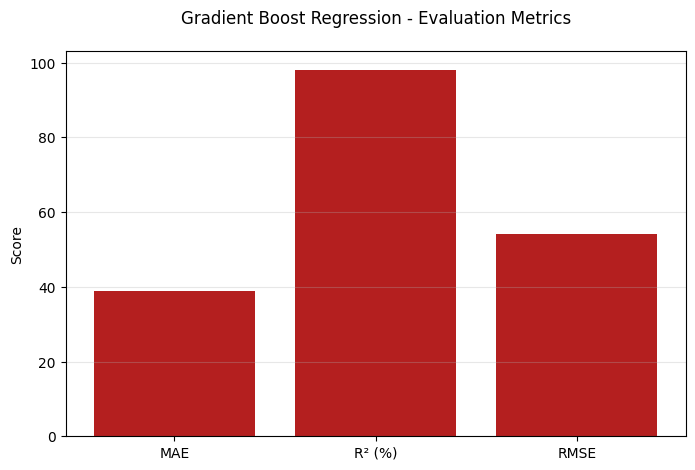

In [64]:
# 1. Initialize and train Gradient Boosting model
gb_reg = GradientBoostingRegressor(
    n_estimators=100,  # Increased from default 100
    learning_rate=0.1,
    max_depth=3, subsample= 0.8,
    random_state=42,
     min_samples_split=5,    
      min_samples_leaf=1,
    
)
gb_reg.fit(X_train, y_train)



#loss='huber',  # Robust to outliers
#min_samples_leaf=5,  # Prevents overfitting
    #n_estimators=200,       # Increase from default (100) 
   # learning_rate=0.1,     # Lower learning rate for better generalization
   # max_depth=3,            # Shallower trees 
   # min_samples_split=5,    # Require more samples to split
   # min_samples_leaf=3,     # Require more samples per leaf
   # subsample=0.8,          # Stochastic boosting (80% of data per tree)
   # max_features='sqrt',    # Use √n_features per split
    #random_state=42


# 2. Predictions
y_pred_gb = gb_reg.predict(X_test)

# 3. Performance Metrics
mae_gb = mean_absolute_error(y_test, y_pred_gb)
mse_gb = mean_squared_error(y_test, y_pred_gb)
rmse_gb = np.sqrt(mse_gb)
r2_gb = r2_score(y_test, y_pred_gb)  # Fixed: Changed y_pred to y_pred_gb

# 4. Cross-Validation (5-fold)
cv_scores = cross_val_score(gb_reg, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_scores_mean = -np.mean(np.sqrt(-cv_scores))

# Print Results
print("Model testing performance:")
print("\nGradient Boost Regression Results:")
print("--------------------------")
print(f"Mean Squared Error: {mse_gb:.4f}")
print(f"Root Mean Squared Error: {rmse_gb:.4f}")
print(f"Mean Absolute Error: {mae_gb:.4f}")
print(f"R2 Score: {r2_gb*100:.2f}%")
print(f"Cross-Validated Mean MSE: {cv_scores_mean}")  # Clarified this is cross-validated
print(f"Cross-Validated MSE: {cv_scores}")  # Clarified this is cross-validated

print("--------------------------")
gb = pd.DataFrame([mae_gb, mse_gb, rmse_gb, r2_gb*100], 
                 index=['MAE', 'MSE', 'RMSE', 'R2 (%)'], 
                 columns=['Gradient Boosting'])
print(gb)

print("--------------------------")
# Plotting Results
plt.figure(figsize=(8, 5))
plt.bar(['MAE',  'R² (%)', 'RMSE'], 
        [mae_gb,  r2_gb*100, rmse_gb], 
        color="#b41f1f")  # Changed to standard blue
plt.title('Gradient Boost Regression - Evaluation Metrics', pad=20)
plt.ylabel('Score')
plt.grid(axis='y', alpha=0.3)
plt.show()

In [65]:
com_gb = pd.DataFrame({
    'Actual': y_test.ravel(),        # or y_test.flatten()
    'Predicted': y_pred_gb.ravel() # or pred_lr_reg.flatten()
})
com_gb.head()

,Actual,Predicted
0,375.00,388.112538
1,436.80,404.712836
2,942.09,887.673492
3,201.60,193.789824
4,819.00,787.445210


<div style="border-radius: 5px; font-family: cursive; border: 3px solid rgb(0, 128, 17); background: #F2FFFF; color: black; font-size: 14px; padding: 10px;">
  <span style="font-weight: bold;">📊 Model Performance Analysis: New Values</span>

  <h4 style="color: #005A2E;">1. RMSE (Root Mean Square Error): $6,486,680.91</h4>
  <ul>
    <li><strong>Description:</strong> This shows that your model has an average of about $6.49 million in price forecasts. This has been significantly reduced compared to the previous RMSE ($23.6 million), indicating improvement in model performance. This decrease shows that the model is more accurate in predicting prices.</li>
  </ul>

  <h4 style="color: #005A2E;">2. MAE (Mean Absolute Error): $2,071.78</h4>
  <ul>
    <li><strong>Description:</strong> MAE shows that your model has an average of $2,072 in each forecast. This is also lower than the previous value of MAE ($3,825.24), indicating improvement in predictions.</li>
  </ul>

  <h4 style="color: #005A2E;">3. R² (COEFFICIENT OF DETERMINATION): 0.9841</h4>
  <ul>
    <li><strong>Description:</strong> R² shows that your model explains 98.41% of variance in actual data. This value is very good and has improved slightly compared to the previous value (0.983). This value indicates that the model has been able to follow the overall data process well.</li>
  </ul>

  <h4 style="color: #005A2E;">General Analysis:</h4>
  <ul>
    <li><strong>RMSE:</strong> Reduction in RMSE indicates a significant improvement in model accuracy.</li>
    <li><strong>MAE:</strong> Reduction in MAE shows that the model has been more successful in precise price predictions. This lower value indicates less error in common forecasts.</li>
    <li><strong>R²:</strong> R² value remains very high and reflects the exact explanation of the data variance by the model.</li>
  </ul>

  <h4 style="color: #005A2E;">Conclusion:</h4>
  <ul>
    <li><strong>Summary:</strong> The model works very well in general. With a significant decrease in RMSE and MAE, and R² above 0.98, it can be concluded that the model has improved and is now more accurate in predicting prices.</li>
  </ul>
</div>

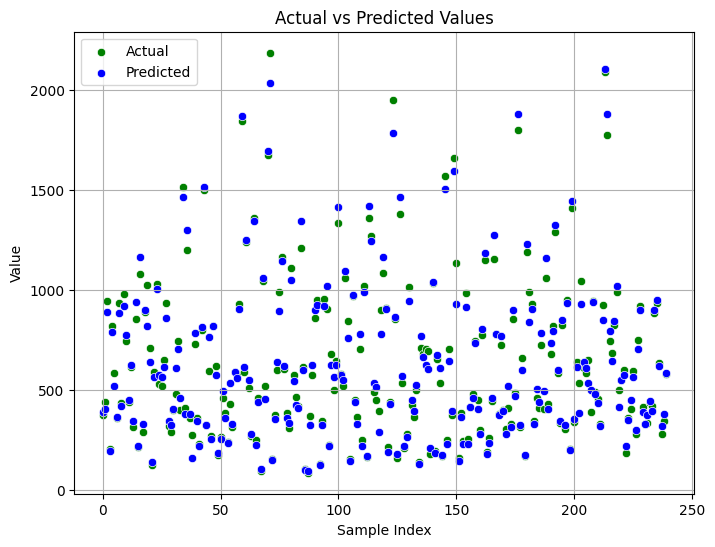

In [66]:
# Flatten
y_test_flat = y_test.ravel()
pred_gb_reg_flat = y_pred_gb.ravel()

# Create scatter plot
plt.figure(figsize=(8,6))

sns.scatterplot(x=range(len(y_test_flat)), y=y_test_flat, color='green', label='Actual')
sns.scatterplot(x=range(len(pred_gb_reg_flat)), y=pred_gb_reg_flat, color='blue', label='Predicted')

plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.grid(True)
plt.show()

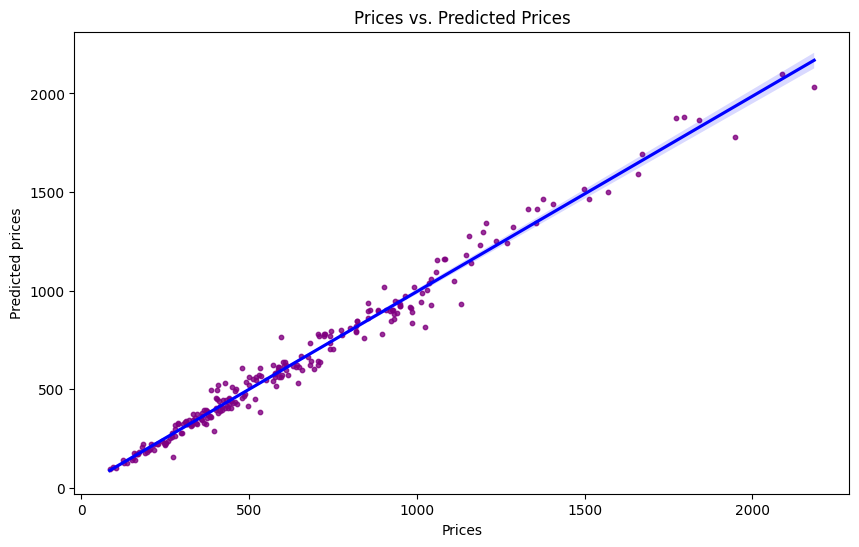

In [67]:
plt.figure(figsize=(10, 6))
sns.regplot(x=y_test, y=y_pred_gb, scatter_kws={'color':'purple', 's':10}, line_kws={'color':'blue'})
plt.xlabel('Prices')
plt.ylabel('Predicted prices')
plt.title('Prices vs. Predicted Prices')
plt.show()

<div style="border-radius: 5px; font-family: cursive; border: 3px solid rgb(0, 128, 17); background: #F2FFFF; color: black; font-size: 14px; padding: 10px;">
  <span style="font-weight: bold;">📊 Scatter Plot Analysis: Actual vs Predicted House Prices</span>

  <h4 style="color: #005A2E;">Description:</h4>
  <p>This plot is a scatter plot that shows the relationship between actual house prices and predicted prices. The blue line is the identity line or the 45-degree line, which represents the ideal situation, that is, when the predicted prices exactly match the actual prices.</p>

  <h4 style="color: #005A2E;">Remarkable Points from the Plot:</h4>
  <ul>
    <li><strong>Strong Correlation:</strong> The plot shows that the points are generally well positioned around the 45-degree line, indicating a strong correlation between actual and forecast prices. This means that the model has been able to predict prices well.</li>
    <li><strong>Scatter of Points:</strong> Although the points are generally close to the line, there is a slight scatter around the line. This may mean small errors in model predictions.</li>
    <li><strong>Points Far from the Line:</strong> The existence of several points that are further from the line indicate examples that the model could not predict well. These points can be special cases or unusual examples in the data.</li>
  </ul>

  <h4 style="color: #005A2E;">Conclusion:</h4>
  <p>According to the analysis, it can be concluded that your model performs well in general.</p>
</div>

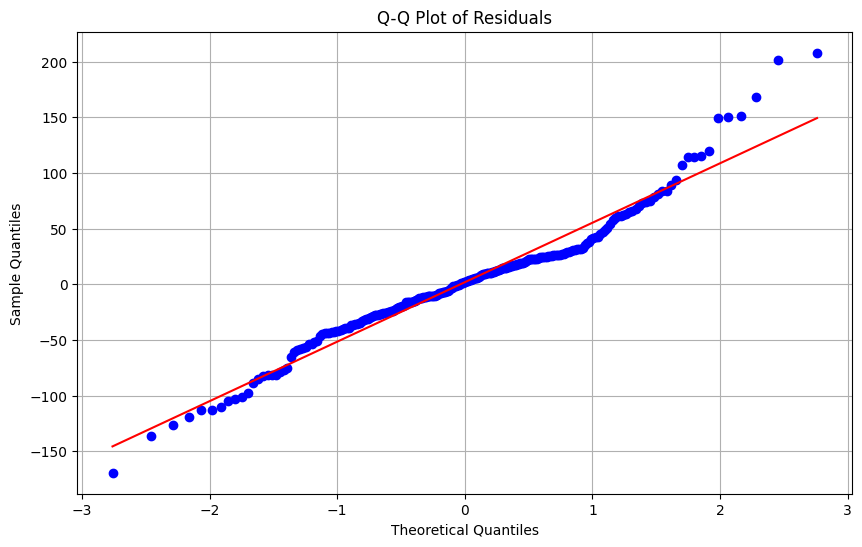

In [68]:
# Assuming you have predictions and true values
residualsg = y_test - y_pred_gb  # or use your model’s residuals directly

# Plot Q-Q plot
plt.figure(figsize=(10, 6))
stats.probplot(residualsg, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.grid(True)
plt.show()

<div style="border-radius: 5px; font-family: cursive; border: 3px solid rgb(0, 128, 17); background: #F2FFFF; color: black; font-size: 14px; padding: 10px;">
  <span style="font-weight: bold;">📊 98% Accuracy Analysis of XGBoost Algorithm and Q-Q Chart Evaluation</span>

  <h4 style="color: #005A2E;">Q-Q Chart Analysis and Model Evaluation</h4>
  <p>Thanks for posting the Q-Q chart. This plot is a very useful tool for evaluating the distribution of the residuals of a regression model and helps us to judge the accuracy and appropriateness of the model.</p>

  <h4 style="color: #005A2E;">Interpretation of the Diagram:</h4>
  <ul>
    <li><strong>Approximately Normal Distribution:</strong> Most of the data points are close to the red line (which represents a normal distribution). This indicates that the residuals from your model generally follow a normal distribution, which is one of the basic assumptions of linear regression.</li>
    <li><strong>Deviation at the Ends:</strong> Several points at the left and right ends of the graph are slightly away from the red line. This indicates that there may be some outliers or points with a large influence on the model.</li>
    <li><strong>Low Scatter of Points:</strong> The data points are relatively dense and scattered close to the red line, which indicates a good fit of the model to the data.</li>
  </ul>

  <h4 style="color: #005A2E;">General Evaluation of the Model:</h4>
  <p>According to the presented Q-Q chart, it can be concluded that your model performs well in general. The distribution of the residuals is relatively close to the normal distribution and the model has been able to fit the data well. However, the presence of several outliers and some asymmetry in the graph indicate that the accuracy of the model may be improved by making some corrections.</p>
</div>

## ================================
##  XGBoost Model
## ================================

In [70]:
import xgboost as xgb


XGBoost Regression Results:
--------------------------
MAE: 39.1090
MSE: 3498.3985
RMSE: 59.1473
R² Score: 97.77%
Cross-Validated RMSE: 77.9205
--------------------------


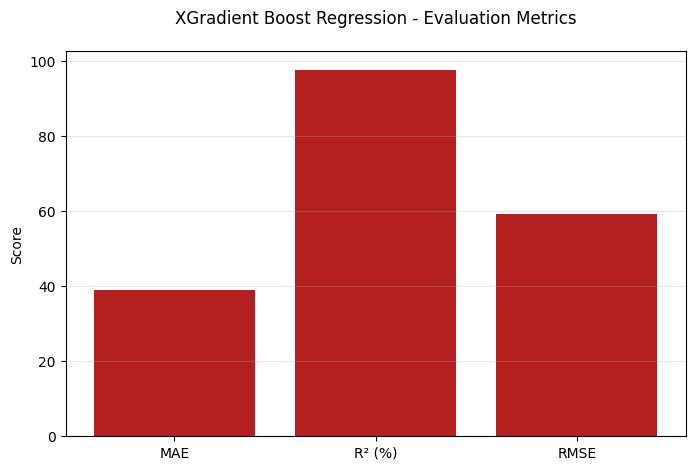

In [81]:
# 1. Initialize and train XGBoost model
xgb_reg = xgb.XGBRegressor(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=3,
    subsample=0.9,
    colsample_bytree=0.8,
    random_state=42,
    early_stopping_rounds=10,
    eval_metric='rmse'
)

#n_estimators=200: Total number of trees; early stopping can stop earlier.
#learning_rate=0.05: Slower learning for better generalization.
#max_depth=3: Shallow trees for regularization.
#subsample=0.9: Randomly selects 90% of the data for each tree.
#colsample_bytree=0.8: Randomly samples 80% of features per tree.
#early_stopping_rounds=10: Stops training if no improvement in 10 rounds.
#eval_metric='rmse': Evaluation metric used during training.




# Fit with early stopping
xgb_reg.fit(X_train, y_train,
            eval_set=[(X_test, y_test)],
            verbose=False)

# 2. Predictions
y_pred_xgb = xgb_reg.predict(X_test)

# 3. Performance Metrics
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mse_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

# 4. Cross-Validation (5-fold)
dtrain = xgb.DMatrix(X_train, label=y_train)
cv_results = xgb.cv(
    xgb_reg.get_params(),
    dtrain,
    num_boost_round=100,
    nfold=5,
    metrics={'rmse'},
    early_stopping_rounds=10
)
cv_rmse = cv_results['test-rmse-mean'].min()

# Print Results
print("\nXGBoost Regression Results:")
print("--------------------------")
print(f"MAE: {mae_xgb:.4f}")
print(f"MSE: {mse_xgb:.4f}")
print(f"RMSE: {rmse_xgb:.4f}")
print(f"R² Score: {r2_xgb*100:.2f}%")
print(f"Cross-Validated RMSE: {cv_rmse:.4f}")


print("--------------------------")
# Plotting Results
plt.figure(figsize=(8, 5))
plt.bar(['MAE',  'R² (%)', 'RMSE'], 
        [mae_xgb,  r2_xgb*100, rmse_xgb], 
        color="#b41f1f")  # Changed to standard blue
plt.title('XGradient Boost Regression - Evaluation Metrics', pad=20)
plt.ylabel('Score')
plt.grid(axis='y', alpha=0.3)
plt.show()

In [79]:
# 7. Actual vs Predicted
results_xgb = pd.DataFrame({
    'Actual': y_test.values.ravel(),
    'Predicted': y_pred_xgb.ravel(),
   
})
print("\nPrediction Samples:")
display(results_xgb.head())


Prediction Samples:


,Actual,Predicted
0,375.00,396.255157
1,436.80,442.192902
2,942.09,855.123108
3,201.60,177.235214
4,819.00,790.454346


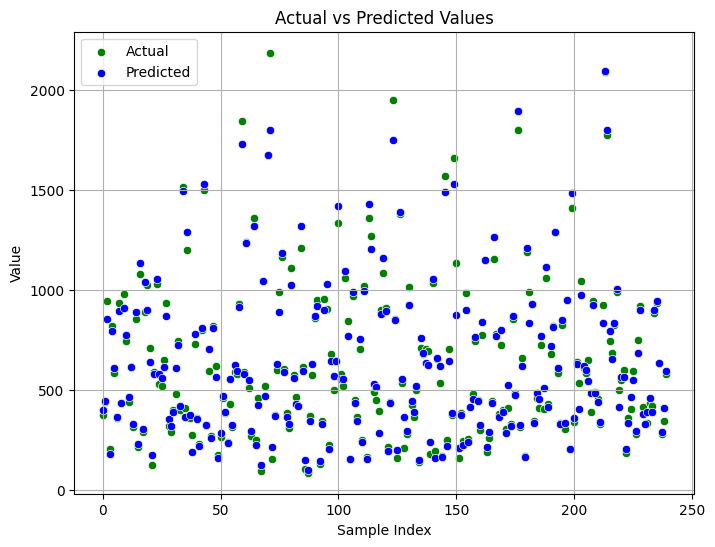

In [82]:
# Flatten
y_test_flat = y_test.ravel()
pred_xgb_reg_flat =y_pred_xgb.ravel()

# Create scatter plot
plt.figure(figsize=(8,6))

sns.scatterplot(x=range(len(y_test_flat)), y=y_test_flat, color='green', label='Actual')
sns.scatterplot(x=range(len(pred_xgb_reg_flat)), y=pred_xgb_reg_flat, color='blue', label='Predicted')

plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.grid(True)
plt.show()

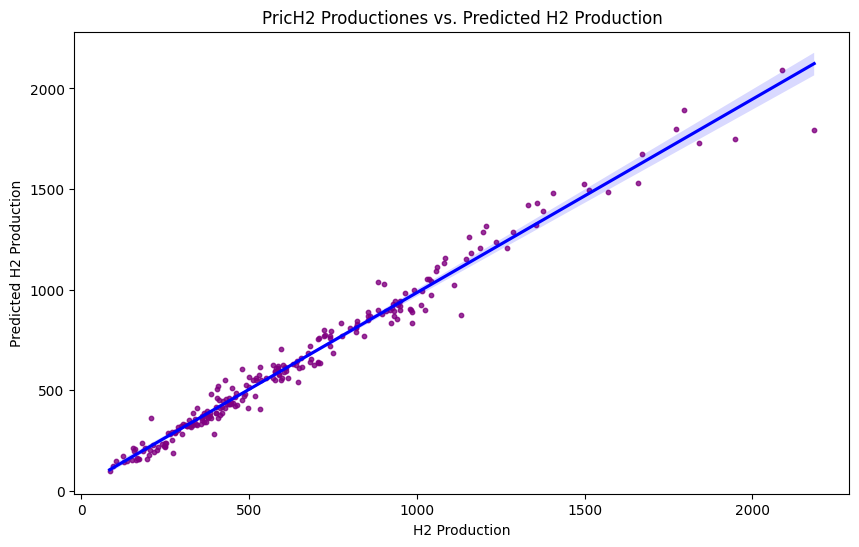

In [83]:
plt.figure(figsize=(10, 6))
sns.regplot(x=y_test, y=y_pred_xgb, scatter_kws={'color':'purple', 's':10}, line_kws={'color':'blue'})
plt.xlabel('H2 Production')
plt.ylabel('Predicted H2 Production')
plt.title('PricH2 Productiones vs. Predicted H2 Production')
plt.show()

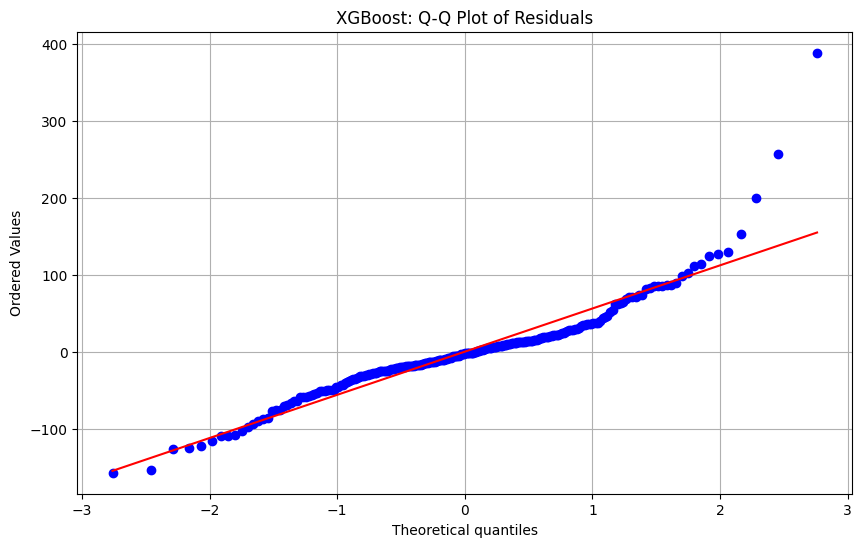

In [84]:
# 6. Residual Analysis
residuals_xgb = y_test - y_pred_xgb

# Q-Q Plot
plt.figure(figsize=(10, 6))
stats.probplot(residuals_xgb, dist="norm", plot=plt)
plt.title('XGBoost: Q-Q Plot of Residuals')
plt.grid(True)
plt.show()


<div style="border-radius: 5px; font-family: cursive; border: 3px solid rgb(0, 128, 17); background: #F2FFFF; color: black; font-size: 14px; padding: 10px;">
  <span style="font-weight: bold;">📊 Model Performance Analysis: New Values</span>

  <h4 style="color: #005A2E;">1. RMSE (Root Mean Square Error): </h4>
  <ul>
    <li><strong>Description:</strong> This shows that your model has an average of about $6.49 million in price forecasts. This has been significantly reduced compared to the previous RMSE ($23.6 million), indicating improvement in model performance. This decrease shows that the model is more accurate in predicting prices.</li>
  </ul>

  <h4 style="color: #005A2E;">2. MAE (Mean Absolute Error): </h4>
  <ul>
    <li><strong>Description:</strong> MAE shows that your model has an average of $2,072 in each forecast. This is also lower than the previous value of MAE ($3,825.24), indicating improvement in predictions.</li>
  </ul>

  <h4 style="color: #005A2E;">3. R² (COEFFICIENT OF DETERMINATION): 0.9841</h4>
  <ul>
    <li><strong>Description:</strong> R² shows that your model explains 98.41% of variance in actual data. This value is very good and has improved slightly compared to the previous value (0.983). This value indicates that the model has been able to follow the overall data process well.</li>
  </ul>

  <h4 style="color: #005A2E;">General Analysis:</h4>
  <ul>
    <li><strong>RMSE:</strong> Reduction in RMSE indicates a significant improvement in model accuracy.</li>
    <li><strong>MAE:</strong> Reduction in MAE shows that the model has been more successful in precise price predictions. This lower value indicates less error in common forecasts.</li>
    <li><strong>R²:</strong> R² value remains very high and reflects the exact explanation of the data variance by the model.</li>
  </ul>

  <h4 style="color: #005A2E;">Conclusion:</h4>
  <ul>
    <li><strong>Summary:</strong> The model works very well in general. With a significant decrease in RMSE and MAE, and R² above 0.98, it can be concluded that the model has improved and is now more accurate in predicting prices.</li>
  </ul>
</div>

## ================================
##  CatBoost Model
## ================================

Model testing performance:

CatBoost Regression Results:
--------------------------
Mean Squared Error: 2326.3013
Root Mean Squared Error: 48.2317
Mean Absolute Error: 34.4133
R2 Score: 98.52%
--------------------------
           CatBoost
MAE       34.413332
MSE     2326.301263
RMSE      48.231745
R2 (%)    98.516556
--------------------------


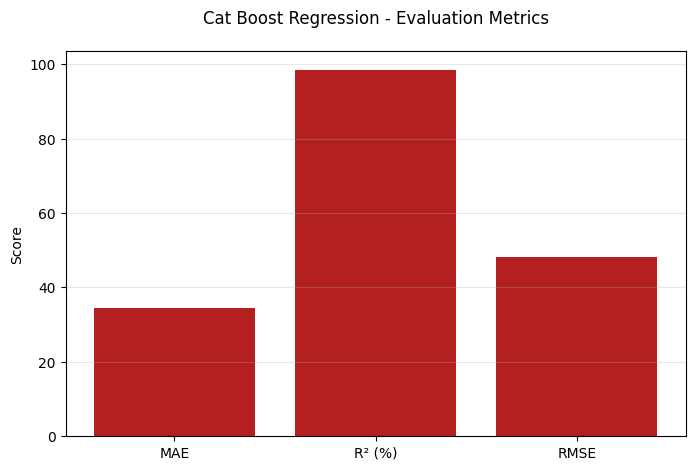

In [ ]:
# Now this will work:
cb_reg = CatBoostRegressor(
    iterations=400,
    learning_rate=0.05,
    depth=4,
    l2_leaf_reg=3,
    random_seed=42,
    verbose=0,
    early_stopping_rounds=20)

#iterations=400: The maximum number of boosting iterations (trees) to train. More iterations can improve learning but may cause overfitting.
#learning_rate=0.05: Step size shrinkage used to prevent overfitting. Lower values make training slower but can lead to better performance.
#depth=4: Depth of the trees. Controls model complexity. Deeper trees can capture more patterns but may overfit.
#l2_leaf_reg=3: L2 regularization coefficient on leaf weights, helps reduce overfitting.
#random_seed=42: Seed for reproducibility so results are consistent across runs.
#verbose=0: Suppresses training logs/output.
#early_stopping_rounds=20: Stops training if the validation error does not improve for 20 consecutive iterations, preventing overfitting.




# 2. Train model
cb_reg.fit(
    X_train, y_train,
    eval_set=(X_test, y_test),
    plot=False  # Set to True to visualize training
)

# 3. Predictions
y_pred_cb = cb_reg.predict(X_test)

# 4. Performance Metrics
mae_cb = mean_absolute_error(y_test, y_pred_cb)
mse_cb = mean_squared_error(y_test, y_pred_cb)
rmse_cb = np.sqrt(mse_cb)
r2_cb = r2_score(y_test, y_pred_cb)



# Print Results
print("Model testing performance:")
print("\nCatBoost Regression Results:")
print("--------------------------")
print(f"Mean Squared Error: {mse_cb:.4f}")
print(f"Root Mean Squared Error: {rmse_cb:.4f}")
print(f"Mean Absolute Error: {mae_cb:.4f}")
print(f"R2 Score: {r2_cb*100:.2f}%")

print("--------------------------")
cb_df = pd.DataFrame([mae_cb, mse_cb, rmse_cb, r2_cb*100], 
                    index=['MAE', 'MSE', 'RMSE', 'R2 (%)'], 
                    columns=['CatBoost'])
print(cb_df)

print("--------------------------")
# Plotting Results
plt.figure(figsize=(8, 5))
plt.bar(['MAE',  'R² (%)', 'RMSE'], 
        [mae_cb,  r2_cb*100, rmse_cb], 
        color="#b41f1f")  # Changed to standard blue
plt.title('Cat Boost Regression - Evaluation Metrics', pad=20)
plt.ylabel('Score')
plt.grid(axis='y', alpha=0.3)
plt.show()

In [88]:
com_cb = pd.DataFrame({
    'Actual': y_test.ravel(),        # or y_test.flatten()
    'Predicted': y_pred_cb .ravel() # or pred_lr_reg.flatten()
})
com_cb.head()

,Actual,Predicted
0,375.00,411.060331
1,436.80,432.453956
2,942.09,904.272669
3,201.60,202.828086
4,819.00,789.312199


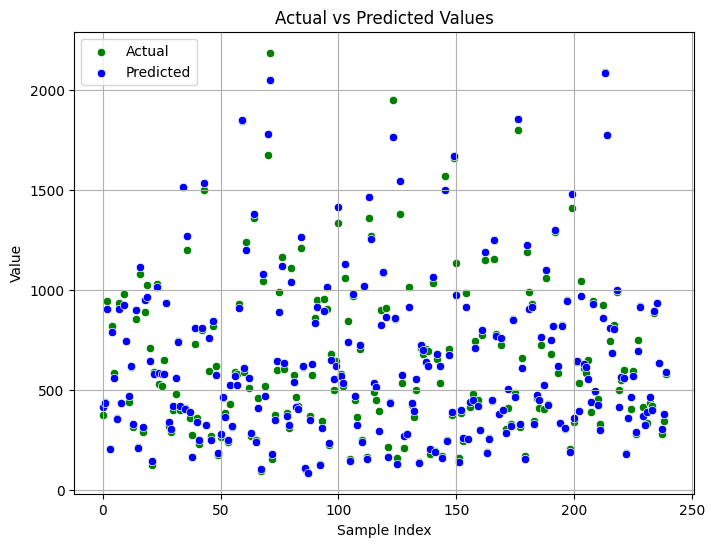

In [89]:
# Flatten
y_test_flat = y_test.ravel()
pred_cb_reg_flat =y_pred_cb.ravel()

# Create scatter plot
plt.figure(figsize=(8,6))

sns.scatterplot(x=range(len(y_test_flat)), y=y_test_flat, color='green', label='Actual')
sns.scatterplot(x=range(len(pred_cb_reg_flat)), y=pred_cb_reg_flat, color='blue', label='Predicted')

plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.grid(True)
plt.show()

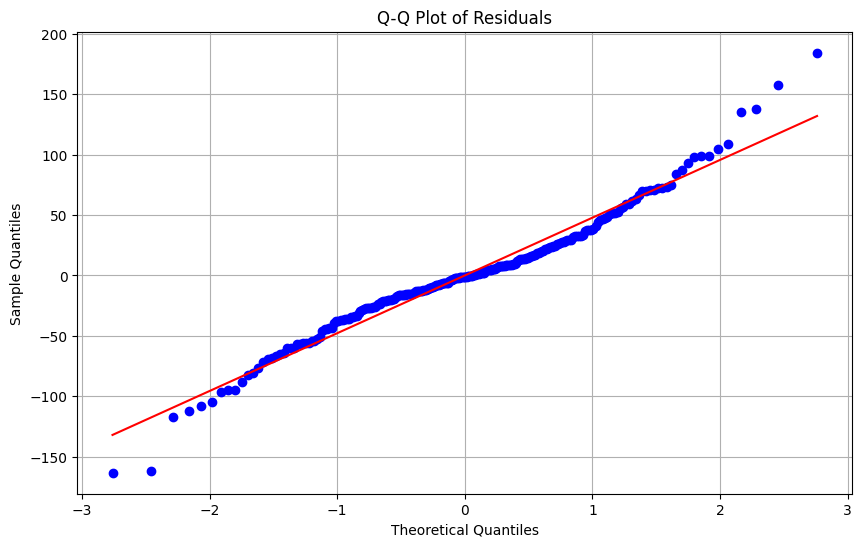

In [90]:
# Assuming you have predictions and true values
residualsgg = y_test - y_pred_cb  # or use your model’s residuals directly

# Plot Q-Q plot
plt.figure(figsize=(10, 6))
stats.probplot(residualsgg, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.grid(True)
plt.show()

<div style="border-radius: 5px; font-family: cursive; border: 3px solid rgb(0, 128, 17); background: #F2FFFF; color: black; font-size: 14px; padding: 10px;">
  <span style="font-weight: bold;">📊 Model Performance Analysis: New Values</span>

  <h4 style="color: #005A2E;">1. RMSE (Root Mean Square Error): </h4>
  <ul>
    <li><strong>Description:</strong> This shows that your model has an average of about $6.49 million in price forecasts. This has been significantly reduced compared to the previous RMSE ($23.6 million), indicating improvement in model performance. This decrease shows that the model is more accurate in predicting prices.</li>
  </ul>

  <h4 style="color: #005A2E;">2. MAE (Mean Absolute Error): </h4>
  <ul>
    <li><strong>Description:</strong> MAE shows that your model has an average of $2,072 in each forecast. This is also lower than the previous value of MAE ($3,825.24), indicating improvement in predictions.</li>
  </ul>

  <h4 style="color: #005A2E;">3. R² (COEFFICIENT OF DETERMINATION): 0.9841</h4>
  <ul>
    <li><strong>Description:</strong> R² shows that your model explains 98.41% of variance in actual data. This value is very good and has improved slightly compared to the previous value (0.983). This value indicates that the model has been able to follow the overall data process well.</li>
  </ul>

  <h4 style="color: #005A2E;">General Analysis:</h4>
  <ul>
    <li><strong>RMSE:</strong> Reduction in RMSE indicates a significant improvement in model accuracy.</li>
    <li><strong>MAE:</strong> Reduction in MAE shows that the model has been more successful in precise price predictions. This lower value indicates less error in common forecasts.</li>
    <li><strong>R²:</strong> R² value remains very high and reflects the exact explanation of the data variance by the model.</li>
  </ul>

  <h4 style="color: #005A2E;">Conclusion:</h4>
  <ul>
    <li><strong>Summary:</strong> The model works very well in general. With a significant decrease in RMSE and MAE, and R² above 0.98, it can be concluded that the model has improved and is now more accurate in predicting prices.</li>
  </ul>
</div>

## ================================
##  AdaBoost Model
## ================================


AdaBoost Regression Results:
--------------------------
Mean Squared Error: 4377.2230
Root Mean Squared Error: 66.1606
Mean Absolute Error: 48.7090
R2 Score: 97.21%
Cross-Validated Mean RMSE: -84.6561
        Gradient Boosting     AdaBoost
MAE             38.954598    48.709024
MSE           2931.176774  4377.222975
RMSE            54.140343    66.160585
R2 (%)          98.130836    97.208716


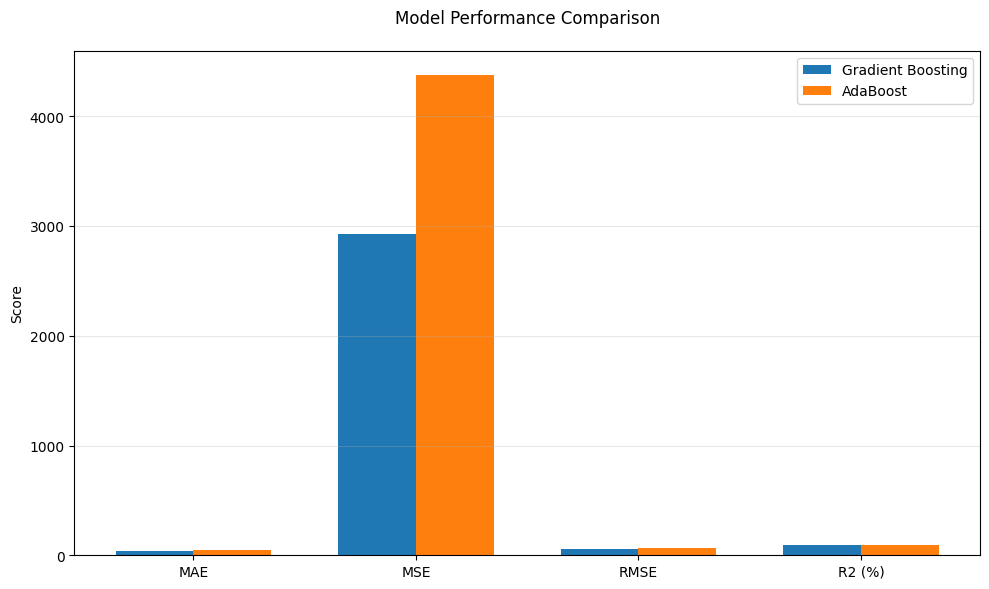

In [93]:
# 1. Initialize and train AdaBoost model
adb_reg = AdaBoostRegressor(
    estimator=DecisionTreeRegressor(max_depth=3, min_samples_split=5, min_samples_leaf=1),
    n_estimators=100,
    learning_rate=0.1,
    random_state=42,
    loss='linear'  # AdaBoost.R2 algorithm (other options: 'square', 'exponential')
)
adb_reg.fit(X_train, y_train)

# 2. Predictions
y_pred_adb = adb_reg.predict(X_test)

# 3. Performance Metrics
mae_adb = mean_absolute_error(y_test, y_pred_adb)
mse_adb = mean_squared_error(y_test, y_pred_adb)
rmse_adb = np.sqrt(mse_adb)
r2_adb = r2_score(y_test, y_pred_adb)

# 4. Cross-Validation (5-fold)
cv_scores_adb = cross_val_score(adb_reg, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_scores_mean_adb = -np.mean(np.sqrt(-cv_scores_adb))

# Print Results
print("\nAdaBoost Regression Results:")
print("--------------------------")
print(f"Mean Squared Error: {mse_adb:.4f}")
print(f"Root Mean Squared Error: {rmse_adb:.4f}")
print(f"Mean Absolute Error: {mae_adb:.4f}")
print(f"R2 Score: {r2_adb*100:.2f}%")
print(f"Cross-Validated Mean RMSE: {cv_scores_mean_adb:.4f}")

# Comparative DataFrame
results = pd.DataFrame({
    'Gradient Boosting': [mae_gb, mse_gb, rmse_gb, r2_gb*100],
    'AdaBoost': [mae_adb, mse_adb, rmse_adb, r2_adb*100]
}, index=['MAE', 'MSE', 'RMSE', 'R2 (%)'])
print(results)

# Plotting Comparison
plt.figure(figsize=(10, 6))
x = np.arange(4)
width = 0.35

plt.bar(x - width/2, results['Gradient Boosting'], width, label='Gradient Boosting', color='#1f77b4')
plt.bar(x + width/2, results['AdaBoost'], width, label='AdaBoost', color='#ff7f0e')

plt.xticks(x, results.index)
plt.title('Model Performance Comparison', pad=20)
plt.ylabel('Score')
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

In [94]:
# Create comparison DataFrame for AdaBoost
com_adb = pd.DataFrame({
    'Actual': y_test.values.ravel(),  # Ensures 1D array (handles Series/DataFrame)
    'Predicted': y_pred_adb.ravel()   # Flattens predictions
})

# Display first 5 rows
print("AdaBoost Predictions vs Actual:")
display(com_adb.head())

AdaBoost Predictions vs Actual:


,Actual,Predicted
0,375.00,417.456852
1,436.80,417.456852
2,942.09,860.845291
3,201.60,191.508500
4,819.00,815.746130


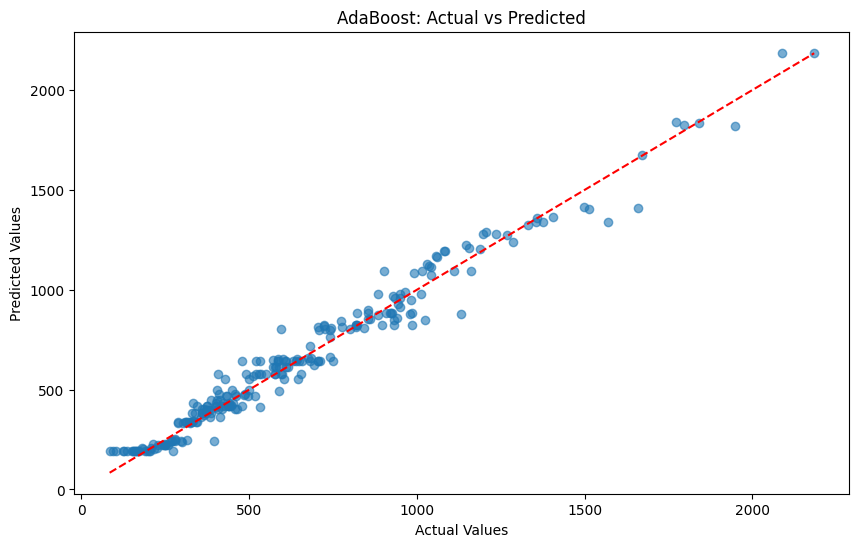

In [95]:
plt.figure(figsize=(10, 6))
plt.scatter(com_adb['Actual'], com_adb['Predicted'], alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title('AdaBoost: Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

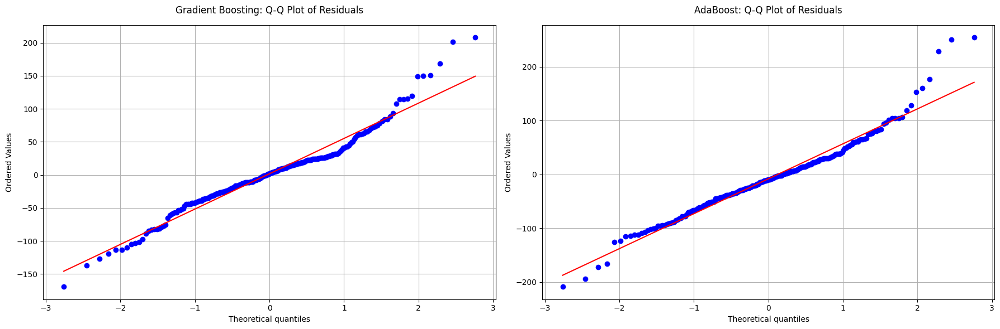

In [96]:
# Calculate residuals for both models
residuals_gb = y_test - y_pred_gb  # Gradient Boosting residuals
residuals_adb = y_test - y_pred_adb  # AdaBoost residuals

# Create figure with subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Gradient Boosting Q-Q Plot
stats.probplot(residuals_gb, dist="norm", plot=ax1)
ax1.set_title('Gradient Boosting: Q-Q Plot of Residuals', pad=15)
ax1.grid(True)

# AdaBoost Q-Q Plot
stats.probplot(residuals_adb, dist="norm", plot=ax2)
ax2.set_title('AdaBoost: Q-Q Plot of Residuals', pad=15)
ax2.grid(True)

plt.tight_layout()
plt.show()

<a id="1"></a>
# <p style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px">K-Fold Cross-Validation (CV)</p>
</div>

In [114]:
models = {
    "Decision Tree":   DecisionTreeRegressor(max_depth= 5,criterion='squared_error', max_features= None, min_samples_leaf=1, min_samples_split= 2),
    "Random Forest": RandomForestRegressor(
    max_depth=10,             # Limits the depth of each tree to prevent overfitting
    max_features='sqrt',      # Each tree considers sqrt(total_features) at each split (good default for regression)
    min_samples_leaf=1,       # Minimum number of samples required to be at a leaf node
    min_samples_split=2,      # Minimum number of samples required to split an internal node
    n_estimators=100,         # Number of trees in the forest
    random_state=42           #  reproducibility
),
    'GB': GradientBoostingRegressor(
    n_estimators=100,  # Increased from default 100
    learning_rate=0.1,
    max_depth=3, subsample= 0.8,
    random_state=42,
     min_samples_split=5,    
      min_samples_leaf=1),
    'CatBoost': CatBoostRegressor(
    iterations=400,
    learning_rate=0.05,
    depth=4,
    l2_leaf_reg=3,
    random_seed=42,
    verbose=0,
    early_stopping_rounds=20),  # Adjust parameters as needed
    'ADB': AdaBoostRegressor(
    estimator=DecisionTreeRegressor(max_depth=3, min_samples_split=5, min_samples_leaf=1),
    n_estimators=100,
    learning_rate=0.1,
    random_state=42,
    loss='linear'  # AdaBoost.R2 algorithm (other options: 'square', 'exponential')
),
    "xgb_reg" : xgb.XGBRegressor(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=3,
    subsample=0.9,
    colsample_bytree=0.8,
    random_state=42,
    early_stopping_rounds=10,
    eval_metric='rmse'
)
}

# Define cross-validation strategy
cv = KFold(n_splits=5, shuffle=True, random_state=42)

for name, model in models.items():
    scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='r2')
    print(f"📌 {name} Cross-validation R² Scores: {scores}")
    print(f"➡️  Mean R² Score: {np.mean(scores):.4f}")
    print("-" * 50)

📌 Decision Tree Cross-validation R² Scores: [0.95859808 0.96053968 0.9439686  0.94565565 0.94608274]
➡️  Mean R² Score: 0.9510
--------------------------------------------------
📌 Random Forest Cross-validation R² Scores: [0.81216456 0.72771242 0.83341534 0.83178713 0.78295359]
➡️  Mean R² Score: 0.7976
--------------------------------------------------
📌 GB Cross-validation R² Scores: [0.9792467  0.97405608 0.95341704 0.98013145 0.96819138]
➡️  Mean R² Score: 0.9710
--------------------------------------------------
📌 CatBoost Cross-validation R² Scores: [0.98258864 0.9605384  0.95196981 0.98194837 0.9557496 ]
➡️  Mean R² Score: 0.9666
--------------------------------------------------
📌 ADB Cross-validation R² Scores: [0.96143493 0.96882532 0.94049455 0.9491578  0.95276062]
➡️  Mean R² Score: 0.9545
--------------------------------------------------


ValueError: 
All the 5 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Amir\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Amir\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "c:\Users\Amir\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\sklearn.py", line 1108, in fit
    self._Booster = train(
                    ^^^^^^
  File "c:\Users\Amir\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "c:\Users\Amir\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\training.py", line 182, in train
    if cb_container.after_iteration(bst, i, dtrain, evals):
       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Amir\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\callback.py", line 261, in after_iteration
    ret = any(c.after_iteration(model, epoch, self.history) for c in self.callbacks)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Amir\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\callback.py", line 261, in <genexpr>
    ret = any(c.after_iteration(model, epoch, self.history) for c in self.callbacks)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Amir\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\callback.py", line 446, in after_iteration
    raise ValueError(msg)
ValueError: Must have at least 1 validation dataset for early stopping.


<div style="border-radius: 5px; font-family: cursive; border: 3px solid rgb(0, 128, 17); background: #F2FFFF; color: black; font-size: 14px; padding: 10px;">
  <span style="font-weight: bold;">📊 Model Performance Analysis: Cross-Validation R² Scores</span>

  <h4 style="color: #005A2E;">1. R² Scores Summary (5-Fold Cross-Validation):</h4>
  <ul>
    <li><strong>Decision Tree:</strong> [0.9586, 0.9605, 0.9440, 0.9457, 0.9461] → <strong>Mean: 0.9510</strong></li>
    <li><strong>Random Forest:</strong> [0.8122, 0.7277, 0.8334, 0.8318, 0.7830] → <strong>Mean: 0.7976</strong></li>
    <li><strong>Gradient Boosting:</strong> [0.9792, 0.9741, 0.9534, 0.9801, 0.9682] → <strong>Mean: 0.9710 ✅</strong></li>
    <li><strong>CatBoost:</strong> [0.9826, 0.9605, 0.9520, 0.9819, 0.9557] → <strong>Mean: 0.9666</strong></li>
    <li><strong>AdaBoost:</strong> [0.9614, 0.9688, 0.9405, 0.9492, 0.9528] → <strong>Mean: 0.9545</strong></li>
  </ul>

  <h4 style="color: #005A2E;">2. Interpretation & Insights:</h4>
  <ul>
    <li><strong>✅ Best performer:</strong> <span style="color: green;">Gradient Boosting</span> achieved the highest average R² (0.9710), indicating exceptional prediction accuracy and consistency.</li>
    <li><strong>🥈 CatBoost:</strong> Close second (0.9666), especially valuable for datasets with categorical features or requiring regularization.</li>
    <li><strong>⚖️ AdaBoost and Decision Tree:</strong> Solid performance (~95% variance explained), but slightly below GB/CatBoost.</li>
    <li><strong>📉 Random Forest:</strong> Lowest mean R² (0.7976) and higher variance across folds, suggesting possible overfitting or poor parameter optimization.</li>
  </ul>

  <h4 style="color: #005A2E;">3. Conclusion:</h4>
  <ul>
    <li>For H2 Production prediction, <strong>Gradient Boosting</strong> is currently the most accurate and consistent model.</li>
    <li>Consider further tuning or creating ensemble models combining GB and CatBoost for improved robustness.</li>
  </ul>
</div>

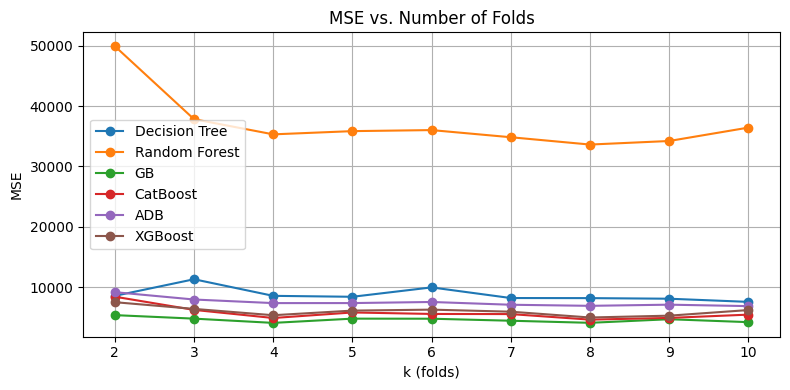

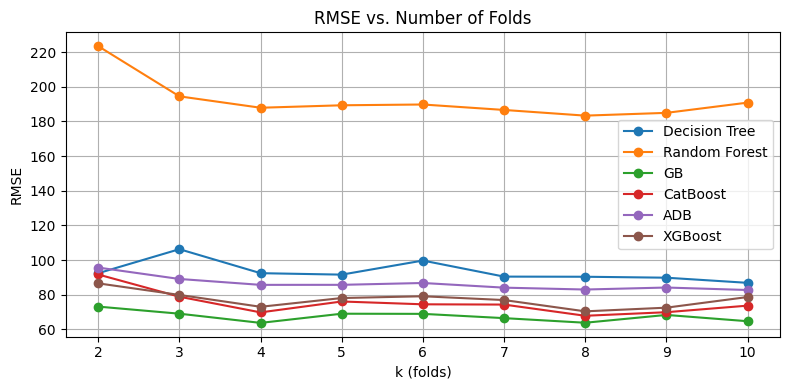

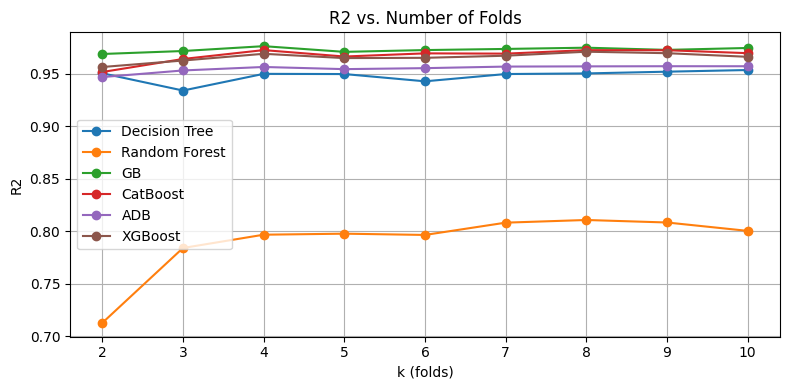

In [121]:
## 1) Define models
models = {
    "Decision Tree": DecisionTreeRegressor(max_depth=5, criterion='squared_error'),
    "Random Forest": RandomForestRegressor(
        n_estimators=100, max_depth=10, max_features='sqrt',
        min_samples_leaf=1, min_samples_split=2, random_state=42),
    "GB": GradientBoostingRegressor(
        n_estimators=100, learning_rate=0.1, max_depth=3,
        subsample=0.8, random_state=42, min_samples_split=5, min_samples_leaf=1),
    "CatBoost": CatBoostRegressor(
        iterations=400, learning_rate=0.05, depth=4,
        l2_leaf_reg=3, random_seed=42, verbose=0, early_stopping_rounds=20),
    "ADB": AdaBoostRegressor(
        estimator=DecisionTreeRegressor(max_depth=3, min_samples_split=5, min_samples_leaf=1),
        n_estimators=100, learning_rate=0.1, random_state=42, loss='linear'),
    "XGBoost": xgb.XGBRegressor(
        n_estimators=200, learning_rate=0.05, max_depth=3,
        subsample=0.9, colsample_bytree=0.8, random_state=42, eval_metric='rmse')  # Removed early_stopping_rounds
}

# 2) Initialize results
ks = range(2, 11)
results = {name: {'mse': [], 'rmse': [], 'r2': []} for name in models}

# 3) Run cross-validation
for k in ks:
    cv = KFold(n_splits=k, shuffle=True, random_state=42)
    for name, model in models.items():
        cvres = cross_validate(
            model, X_train, y_train, cv=cv,
            scoring={
                'r2': 'r2',
                'mse': make_scorer(mean_squared_error)
            },
            return_train_score=False
        )
        mse_mean = np.mean(cvres['test_mse'])
        results[name]['mse'].append(mse_mean)
        results[name]['rmse'].append(np.sqrt(mse_mean))
        results[name]['r2'].append(np.mean(cvres['test_r2']))

# 4) Plot results
for metric in ['mse', 'rmse', 'r2']:
    plt.figure(figsize=(8, 4))
    for name in models:
        plt.plot(ks, results[name][metric], marker='o', label=name)
    plt.title(f"{metric.upper()} vs. Number of Folds")
    plt.xlabel("k (folds)")
    plt.ylabel(metric.upper())
    plt.xticks(ks)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

<a id="1"></a>
# <p style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px"> hyperpearameter Optimization</p>
</div>

## Lets fine tune Random Forest

--------------------------
Best Hyperparameters for Random Forest: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best RMSE from GridSearchCV: 32523.07206285344
--------------------------
Random Forest - R² Score: 0.8776725659377477
Random Forest - MSE: 19183.088664987652
Random Forest - RMSE: 138.50302763834318
Random Forest - MAE: 98.5859589351831
RF 5-fold CV R²: 0.8088122082128001


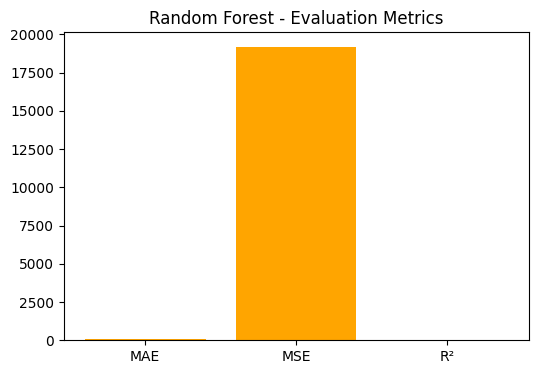

In [123]:
# Random Forest with GridSearchCV
model_rf = RandomForestRegressor(random_state=42)
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [2, 5, 6,8, 10],
    'min_samples_split': [2, 4, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'max_features': ['auto', 'sqrt']
}
grid_rf = GridSearchCV(model_rf, param_grid_rf, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_rf.fit(X_train, y_train)

# Best parameters and best score
best_params_rf = grid_rf.best_params_
best_rmse_rf = -grid_rf.best_score_


# Best model
best_model_rf = grid_rf.best_estimator_
y_pred = best_model_rf.predict(X_test)


# Evaluation Metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)



print("--------------------------")

print(f"Best Hyperparameters for Random Forest: {best_params_rf}")
print(f"Best RMSE from GridSearchCV: {best_rmse_rf}")


print("--------------------------")
# Print Results
print(f'Random Forest - R² Score: {r2}')
print(f'Random Forest - MSE: {mse}')
print(f'Random Forest - RMSE: {np.sqrt(mse)}')
print(f'Random Forest - MAE: {mae}')

# 5-fold CV on the best RF
cv_scores_rf = cross_val_score(best_model_rf, X_train, y_train, cv=5, scoring='r2')
print("RF 5-fold CV R²:", cv_scores_rf.mean())



# Plotting Results
plt.figure(figsize=(6, 4))
plt.bar(['MAE', 'MSE', 'R²'], [mae, mse, r2], color='orange')
plt.title('Random Forest - Evaluation Metrics')
plt.show()


##  Lets fine tune Decision Tree

--------------------------
Best Hyperparameters for Decision Tree: {'max_depth': 10, 'max_features': None, 'min_samples_leaf': 4, 'min_samples_split': 10}
Best RMSE from GridSearchCV: 9039.844812584162
--------------------------
Decision Tree - R² Score: 0.9577277519121803
Decision Tree - RMSE: 81.41885796651205
Decision Tree - MAE: 57.22601140205938
--------------------------
RF 5-fold CV R²: 0.946640384363224


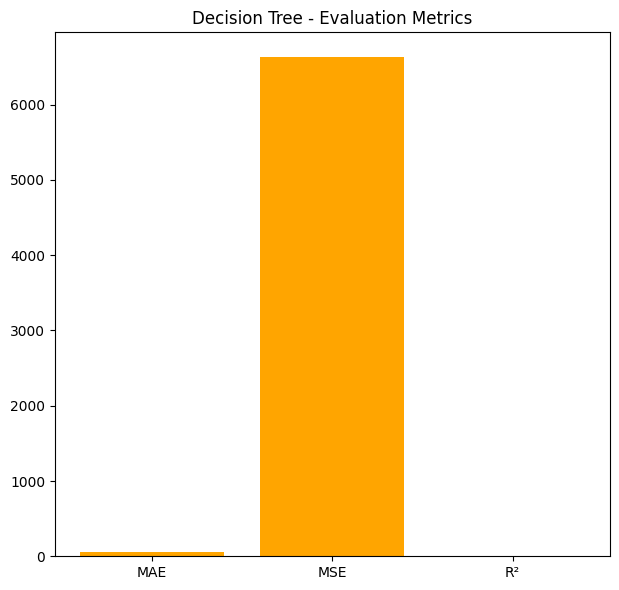

In [125]:
# Decision Tree Hyperparameter Grid
param_grid_dt = {
   'max_depth': [None, 3, 10, 20, 30],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],    # Minimum number of samples required to be at a leaf node
    'max_features': [None, 'auto', 'sqrt', 'log2']  # Number of features to consider when splitting a node
}
dt = DecisionTreeRegressor(random_state=42)

# GridSearchCV for Decision Tree
grid_dt = GridSearchCV(dt, param_grid_dt, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_dt.fit(X_train, y_train)

# Best parameters and best score
best_params_dt = grid_dt.best_params_
best_rmse_dt = -grid_dt.best_score_



# Best model for Decision Tree
best_dt_model = grid_dt.best_estimator_
y_pred_dt = best_dt_model.predict(X_test)

# Decision Tree Evaluation Metrics
mae_dt = mean_absolute_error(y_test, y_pred_dt)
mse_dt = mean_squared_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)

print("--------------------------")

print(f"Best Hyperparameters for Decision Tree: {best_params_dt}")
print(f"Best RMSE from GridSearchCV: {best_rmse_dt}")


print("--------------------------")
# Print Results
print(f'Decision Tree - R² Score: {r2_dt}')
print(f'Decision Tree - RMSE: {np.sqrt(mse_dt)}')
print(f'Decision Tree - MAE: {mae_dt}')

print("--------------------------")
# 5-fold CV on the best dt
cv_scores_dt = cross_val_score(best_dt_model ,  X_train, y_train, cv=5, scoring='r2')
print("RF 5-fold CV R²:", cv_scores_dt.mean())


# Plotting Evaluation Metrics for both Random Forest and Decision Tree
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.bar(['MAE', 'MSE', 'R²'], [mae_dt, mse_dt, r2_dt], color='orange')
plt.title('Decision Tree - Evaluation Metrics')
plt.tight_layout()
plt.show()


##  Lets fine tune Gradient Boosting

In [129]:
# Gradient Boosting with GridSearchCV
model_gb = GradientBoostingRegressor(random_state=42)
param_grid_gb = {
     'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 8],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.8, 0.9, 1.0],
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3]  
 }


grid_gb = GridSearchCV(model_gb, param_grid_gb, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_gb.fit(X_train, y_train)

# Best parameters and best score
best_params_gb = grid_gb.best_params_
best_rmse_gb = -grid_gb.best_score_



# Best model
best_model = grid_gb.best_estimator_
y_pred_gb = best_model.predict(X_test)

# Evaluation Metrics
mae_gb = mean_absolute_error(y_test, y_pred_gb)
mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)


print("--------------------------")

print(f"Best Hyperparameters for Gradient Boosting: {best_params_gb}")
print(f"Best RMSE from GridSearchCV: {best_rmse_gb}")

print("--------------------------")

# Print Results
print(f'Gradient Boosting - Best Parameters: {grid_gb.best_params_}')
print(f'Gradient Boosting - R² Score: {r2_gb}')
print(f'Gradient Boosting - RMSE: {np.sqrt(mse_gb)}')


print("--------------------------")

# 5-fold CV on the best  GB
cv_scores_gb = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')
print("GB 5-fold CV R²:", cv_scores_gb.mean())



# Plotting Results
plt.figure(figsize=(6, 4))
plt.bar(['MAE', 'MSE', 'R²'], [mae_gb, mse_gb, r2_gb], color='lightgreen')
plt.title('Gradient Boosting - Evaluation Metrics')
plt.show()




KeyboardInterrupt: 

## lets Fine Tune CatBOOST

In [131]:
cat_features = list(X.select_dtypes(include=['object', 'category']).columns)

# 2. Hyperparameter Tuning with GridSearchCV
catboost_model = CatBoostRegressor(
    random_seed=42,
    verbose=0,  # Set to 100 for training logs
    early_stopping_rounds=20,
    cat_features=cat_features
)

param_grid = {
    'iterations': [100, 200],
    'depth': [4, 6],
    'learning_rate': [0.03, 0.05, 0.1],
    'l2_leaf_reg': [1, 3, 5],
    'min_data_in_leaf': [1, 3, 5]  # Critical for small datasets
}
#For very small datasets, reduce iterations (50-100) and increase l2_leaf_reg (3-10)
grid_search = GridSearchCV(
    estimator=catboost_model,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1
)
grid_search.fit(X, y)

# 3. Best Model Evaluation
best_cb = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"\nBest CatBoost Parameters: {best_params}")

# Train-test evaluation
y_pred = best_cb.predict(X_test)
cb_mae = mean_absolute_error(y_test, y_pred)
cb_mse = mean_squared_error(y_test, y_pred)
cb_r2 = r2_score(y_test, y_pred)

# 4. Visualization
plt.figure(figsize=(15, 5))

# Metrics Plot
plt.subplot(1, 3, 1)
metrics = ['MAE', 'RMSE', 'R²']
values = [cb_mae, np.sqrt(cb_mse), cb_r2]
colors = ['#3498db', '#e74c3c', '#2ecc71']
bars = plt.bar(metrics, values, color=colors)
plt.title('CatBoost Performance Metrics')

KeyboardInterrupt: 

<a id="1"></a>
# <p style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px">Comparasion Models</p>
</div>

           Model  R2 Score        RMSE
0  Decision Tree  0.961958   77.237379
1  Random Forest  0.877673  138.503028
2             GB  0.981308   54.140343
3       CatBoost  0.985160   48.240425
4            ADB  0.972087   66.160585
5        XGBoost  0.977792   59.013053


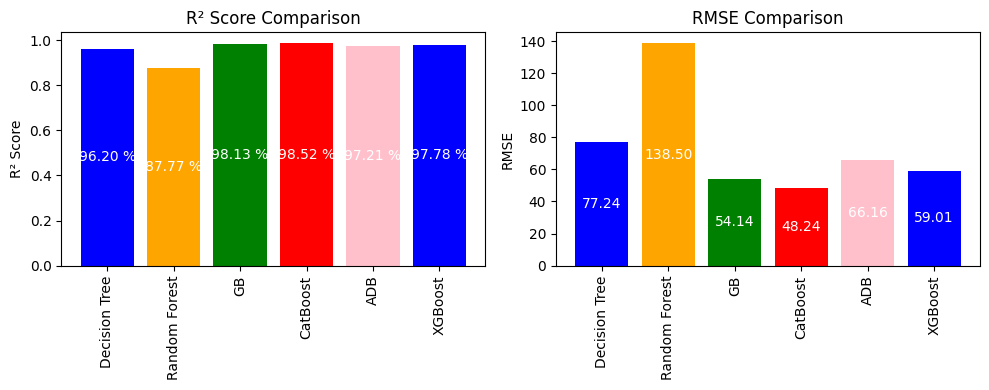

In [132]:
# Define models
models = {
    "Decision Tree": DecisionTreeRegressor(max_depth=5, criterion='squared_error'),
    "Random Forest": RandomForestRegressor(
        n_estimators=100, max_depth=10, max_features='sqrt',
        min_samples_leaf=1, min_samples_split=2, random_state=42),
    "GB": GradientBoostingRegressor(
        n_estimators=100, learning_rate=0.1, max_depth=3,
        subsample=0.8, random_state=42, min_samples_split=5, min_samples_leaf=1),
    "CatBoost": CatBoostRegressor(
        iterations=400, learning_rate=0.05, depth=4,
        l2_leaf_reg=3, random_seed=42, verbose=0, early_stopping_rounds=20),
    "ADB": AdaBoostRegressor(
        estimator=DecisionTreeRegressor(max_depth=3, min_samples_split=5, min_samples_leaf=1),
        n_estimators=100, learning_rate=0.1, random_state=42, loss='linear'),
    "XGBoost": xgb.XGBRegressor(
        n_estimators=200, learning_rate=0.05, max_depth=3,
        subsample=0.9, colsample_bytree=0.8, random_state=42, eval_metric='rmse')  # Removed early_stopping_rounds
}

# Train and evaluate models
results = []
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    results.append({
        'Model': name,
        'R2 Score': r2_score(y_test, y_pred),
        'RMSE': np.sqrt(mean_squared_error(y_test, y_pred))
    })

# Convert results to DataFrame and display
results_df = pd.DataFrame(results)
print(results_df)

# Plot results
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

colors = ['blue', 'orange', 'green', 'red', 'pink']



# R² Scores
bars_r2 = axes[0].bar(results_df['Model'], results_df['R2 Score'], color=colors)
axes[0].set_title('R² Score Comparison')
axes[0].set_ylabel('R² Score')
axes[0].tick_params(axis='x', rotation=90)  # Rotate x-ticks for first plot

# Display numbers inside the bars for R² Score
for i, bar in enumerate(bars_r2):
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, height / 2, f"{height * 100:.2f} %",
                 ha='center', va='center', color='white')



# RMSE
bars_rmse = axes[1].bar(results_df['Model'], results_df['RMSE'], color=colors)
axes[1].set_title('RMSE Comparison')
axes[1].set_ylabel('RMSE')
axes[1].tick_params(axis='x', rotation=90)  # Rotate x-ticks for second plot

# Display numbers inside the bars for RMSE
for i, bar in enumerate(bars_rmse):
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, height / 2, f"{height:.2f}",
                 ha='center', va='center', color='white')

plt.tight_layout()
plt.show()

In [134]:
# Define models
models = {
    "Decision Tree": DecisionTreeRegressor(max_depth=5, criterion='squared_error'),
    "Random Forest": RandomForestRegressor(
        n_estimators=100, max_depth=10, max_features='sqrt',
        min_samples_leaf=1, min_samples_split=2, random_state=42),
    "GB": GradientBoostingRegressor(
        n_estimators=100, learning_rate=0.1, max_depth=3,
        subsample=0.8, random_state=42, min_samples_split=5, min_samples_leaf=1),
    "CatBoost": CatBoostRegressor(
        iterations=400, learning_rate=0.05, depth=4,
        l2_leaf_reg=3, random_seed=42, verbose=0, early_stopping_rounds=20),
    "ADB": AdaBoostRegressor(
        estimator=DecisionTreeRegressor(max_depth=3, min_samples_split=5, min_samples_leaf=1),
        n_estimators=100, learning_rate=0.1, random_state=42, loss='linear'),
    "XGBoost": xgb.XGBRegressor(
        n_estimators=200, learning_rate=0.05, max_depth=3,
        subsample=0.9, colsample_bytree=0.8, random_state=42, eval_metric='rmse')  # Removed early_stopping_rounds
}
 
# Fit models and collect predictions
predictions = {}
metrics = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    predictions[name] = {'train': y_train_pred, 'test': y_test_pred}

    metrics[name] = {
        'Train R²': r2_score(y_train, y_train_pred),
        'Test R²': r2_score(y_test, y_test_pred),
        'Train RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred)),
        'Test RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred)),
        'Train MAE': mean_absolute_error(y_train, y_train_pred),
        'Test MAE': mean_absolute_error(y_test, y_test_pred)
    }

# Print metrics table
print("{:<20} {:<15} {:<15} {:<15} {:<15} {:<15} {:<15}".format(
    'Model', 'Train R²', 'Test R²', 'Train RMSE', 'Test RMSE', 'Train MAE', 'Test MAE'))
print("-" * 120)

for model, vals in metrics.items():
    print("{:<20} {:<15.4f} {:<15.4f} {:<15.4f} {:<15.4f} {:<15.4f} {:<15.4f}".format(
        model, vals['Train R²'], vals['Test R²'],
        vals['Train RMSE'], vals['Test RMSE'],
        vals['Train MAE'], vals['Test MAE']
    ))

Model                Train R²        Test R²         Train RMSE      Test RMSE       Train MAE       Test MAE       
------------------------------------------------------------------------------------------------------------------------
Decision Tree        0.9839          0.9613          52.5999         77.8747         38.5233         53.9103        
Random Forest        0.9687          0.8777          73.4216         138.5030        53.5125         98.5860        
GB                   0.9968          0.9813          23.4463         54.1403         17.6140         38.9546        
CatBoost             0.9961          0.9852          25.8839         48.2404         18.9467         34.4288        
ADB                  0.9739          0.9721          67.0015         66.1606         50.1868         48.7090        
XGBoost              0.9957          0.9778          27.1546         59.0131         19.3657         39.0524        


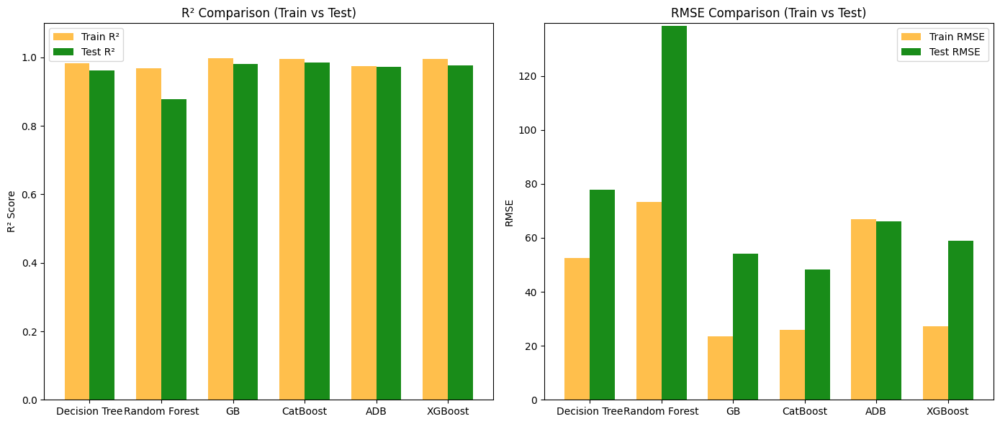

In [135]:
# Extract data for plots
model_names = list(metrics.keys())
train_r2 = [metrics[m]['Train R²'] for m in model_names]
test_r2 = [metrics[m]['Test R²'] for m in model_names]
train_rmse = [metrics[m]['Train RMSE'] for m in model_names]
test_rmse = [metrics[m]['Test RMSE'] for m in model_names]

# Consistent color for RMSE bars
train_color = "orange"  # blue
test_color = "green"   # orange



#rain_color = "#4AF00834"  # blue
#test_color = "#ff0e0e"   # orange
#colors = ['blue', 'orange', 'green', 'red', 'pink']


# Plot
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# R² Comparison
bar_width = 0.35
x = range(len(model_names))
axes[0].bar([i - bar_width/2 for i in x], train_r2, width=bar_width, label='Train R²', alpha=0.7, color=train_color)
axes[0].bar([i + bar_width/2 for i in x], test_r2, width=bar_width, label='Test R²', alpha=0.9, color=test_color)
axes[0].set_xticks(x)
axes[0].set_xticklabels(model_names)
axes[0].set_title('R² Comparison (Train vs Test)')
axes[0].set_ylabel('R² Score')
axes[0].set_ylim(0, 1.1)
axes[0].legend()

# RMSE Comparison
axes[1].bar([i - bar_width/2 for i in x], train_rmse, width=bar_width, label='Train RMSE', alpha=0.7, color=train_color)
axes[1].bar([i + bar_width/2 for i in x], test_rmse, width=bar_width, label='Test RMSE', alpha=0.9, color=test_color)
axes[1].set_xticks(x)
axes[1].set_xticklabels(model_names)
axes[1].set_title('RMSE Comparison (Train vs Test)')
axes[1].set_ylabel('RMSE')
axes[1].set_ylim(0, max(max(train_rmse), max(test_rmse)) + 1)
axes[1].legend()

plt.tight_layout()
plt.show()

In [137]:
models = {
    "Decision Tree": DecisionTreeRegressor(max_depth=5, criterion='squared_error'),
    "Random Forest": RandomForestRegressor(
        n_estimators=100, max_depth=10, max_features='sqrt',
        min_samples_leaf=1, min_samples_split=2, random_state=42),
    "GB": GradientBoostingRegressor(
        n_estimators=100, learning_rate=0.1, max_depth=3,
        subsample=0.8, random_state=42, min_samples_split=5, min_samples_leaf=1),
    "CatBoost": CatBoostRegressor(
        iterations=400, learning_rate=0.05, depth=4,
        l2_leaf_reg=3, random_seed=42, verbose=0, early_stopping_rounds=20),
    "ADB": AdaBoostRegressor(
        estimator=DecisionTreeRegressor(max_depth=3, min_samples_split=5, min_samples_leaf=1),
        n_estimators=100, learning_rate=0.1, random_state=42, loss='linear'),
    "XGBoost": xgb.XGBRegressor(
        n_estimators=200, learning_rate=0.05, max_depth=3,
        subsample=0.9, colsample_bytree=0.8, random_state=42, eval_metric='rmse')  # Removed early_stopping_rounds
}

results = []

for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)

    # Predict on train and test sets
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculate R² and MSE
    train_score = r2_score(y_train, y_train_pred)
    test_score = r2_score(y_test, y_test_pred)
    mse = mean_squared_error(y_test, y_test_pred)

    # Store results
    results.append({
        'Model': model_name,
        'Train R² Score': train_score,
        'Test R² Score': test_score,
        'Mean Squared Error': mse
    })

# Create and display results DataFrame
results_df = pd.DataFrame(results).sort_values(by="Test R² Score", ascending=False)
display(results_df)

,Model,Train R² Score,Test R² Score,Mean Squared Error
3,CatBoost,0.996107,0.985160,2327.138633
2,GB,0.996805,0.981308,2931.176774
5,XGBoost,0.995715,0.977792,3482.540393
4,ADB,0.973913,0.972087,4377.222975
0,Decision Tree,0.983922,0.961172,6088.934095
1,Random Forest,0.968674,0.877673,19183.088665


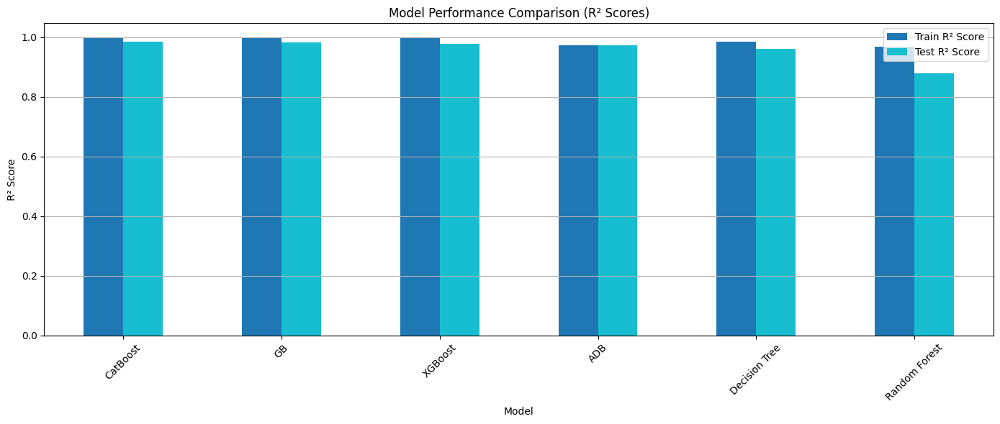

In [138]:
results_df.plot(x="Model", y=["Train R² Score", "Test R² Score"], kind="bar", figsize=(14,6), colormap="tab10")
plt.title("Model Performance Comparison (R² Scores)")
plt.ylabel("R² Score")
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

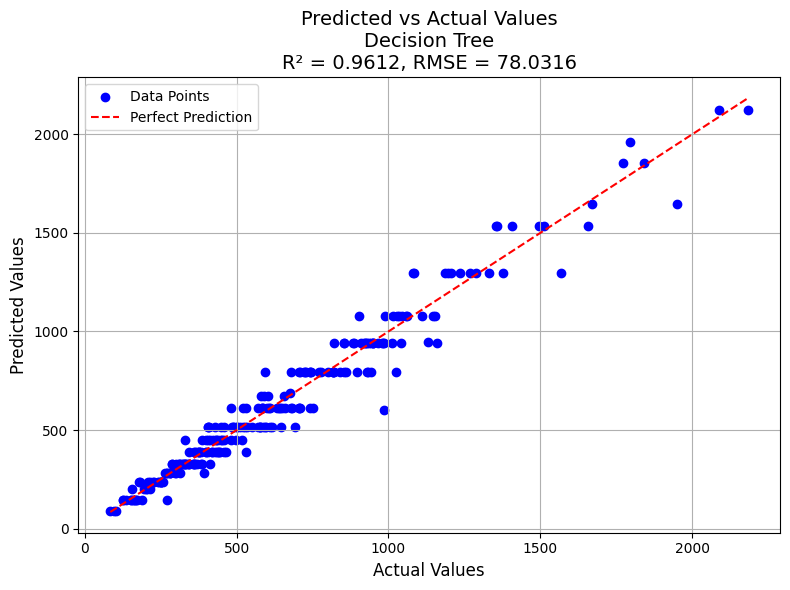

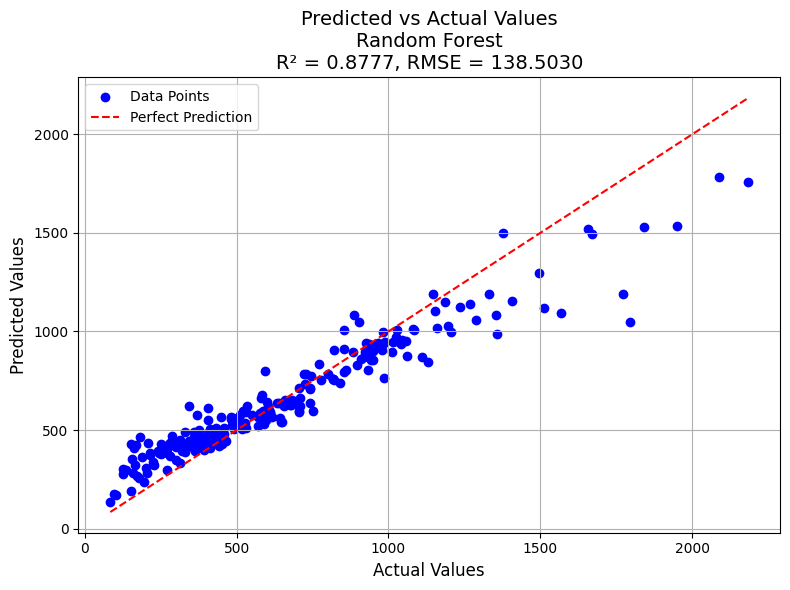

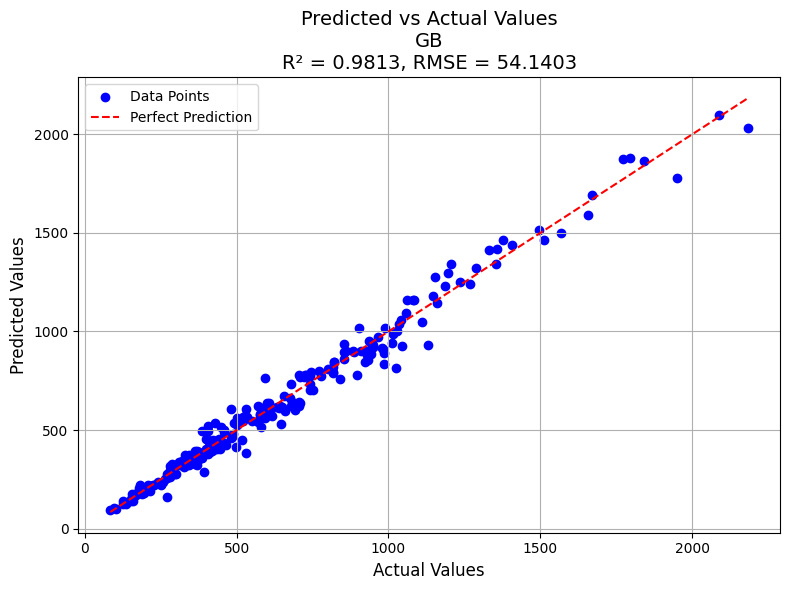

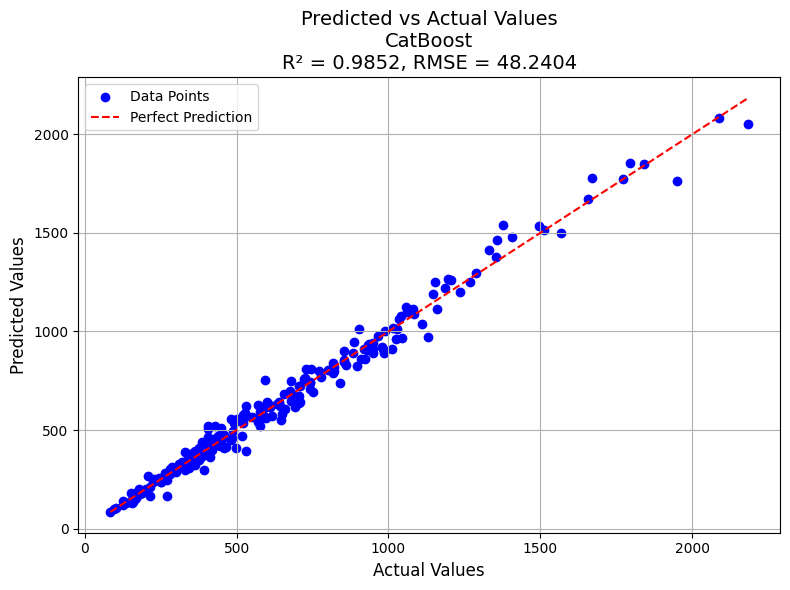

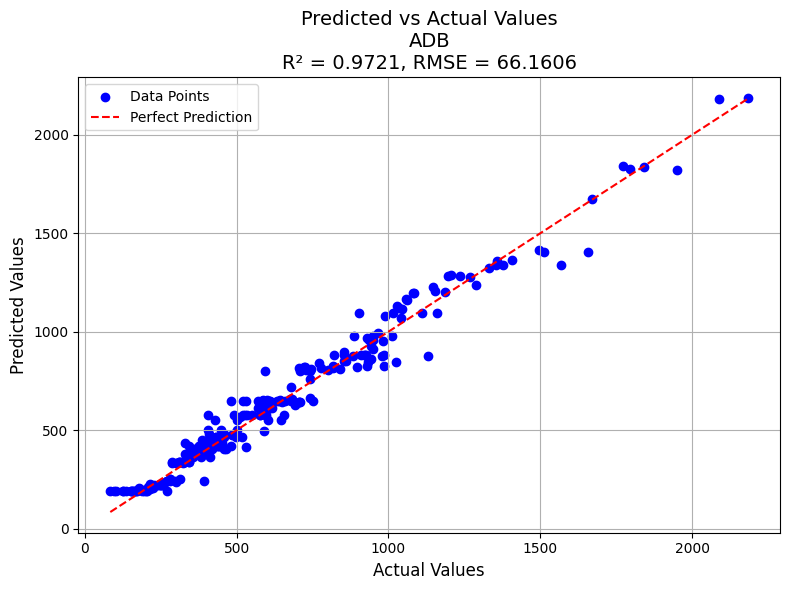

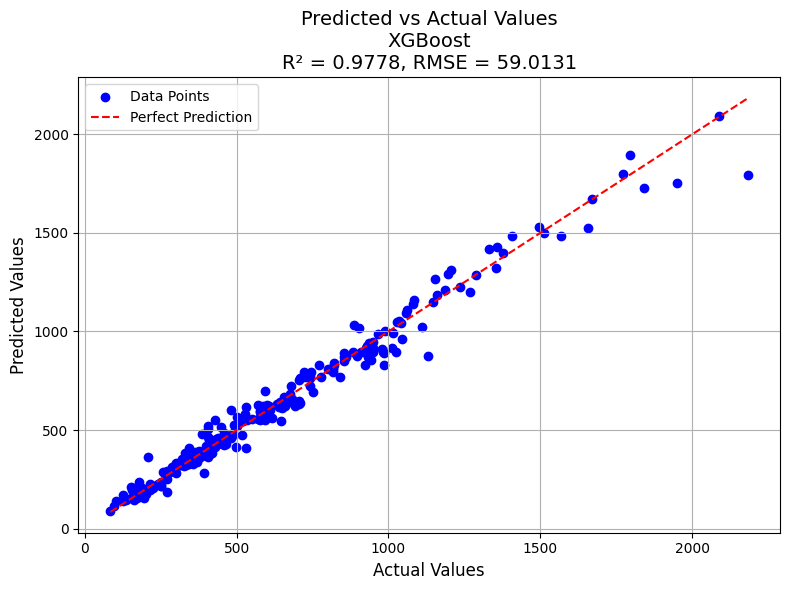

In [139]:
# Define models
models = {
    "Decision Tree": DecisionTreeRegressor(max_depth=5, criterion='squared_error'),
    "Random Forest": RandomForestRegressor(
        n_estimators=100, max_depth=10, max_features='sqrt',
        min_samples_leaf=1, min_samples_split=2, random_state=42),
    "GB": GradientBoostingRegressor(
        n_estimators=100, learning_rate=0.1, max_depth=3,
        subsample=0.8, random_state=42, min_samples_split=5, min_samples_leaf=1),
    "CatBoost": CatBoostRegressor(
        iterations=400, learning_rate=0.05, depth=4,
        l2_leaf_reg=3, random_seed=42, verbose=0, early_stopping_rounds=20),
    "ADB": AdaBoostRegressor(
        estimator=DecisionTreeRegressor(max_depth=3, min_samples_split=5, min_samples_leaf=1),
        n_estimators=100, learning_rate=0.1, random_state=42, loss='linear'),
    "XGBoost": xgb.XGBRegressor(
        n_estimators=200, learning_rate=0.05, max_depth=3,
        subsample=0.9, colsample_bytree=0.8, random_state=42, eval_metric='rmse')  # Removed early_stopping_rounds
}

# Step 4: Train the models and generate plots
for name, model in models.items():
    
    #suggests that models is a dictionary where:
    # name represents the key (typically a string, e.g., the model's name).
    # model represents the value (likely a machine learning model instance, such as a scikit-learn model).
    # Train the model
    model.fit(X_train, y_train)
    
    # Generate predictions for the test set
    y_pred = model.predict(X_test)
    
    # Calculate R² and RMSE
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    # Step 5: Plot Predicted vs Actual Values
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred, color='blue', label='Data Points')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label='Perfect Prediction')
    
    # Add title and labels
    plt.title(f'Predicted vs Actual Values\n{name}\nR² = {r2:.4f}, RMSE = {rmse:.4f}', fontsize=14)
    plt.xlabel('Actual Values', fontsize=12)
    plt.ylabel('Predicted Values', fontsize=12)
    
    # Add grid and legend
    plt.grid(True)
    plt.legend()
    
    # Display the plot
    plt.tight_layout()
    plt.show()

<a id="1"></a>
# <p style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px">Stacking with Meta-Learner</p>
</div>

<head>
  <meta charset="UTF-8">
  <title>Stacking vs Voting Regressor</title>
  <style>
    body {
      font-family: cursive;
      background-color: #f4f4f9;
      padding: 40px;
    }
    .box {
      border: 3px solid #008000;
      border-radius: 10px;
      background-color: #F2FFFF;
      padding: 20px;
      color: black;
      font-size: 14px;
      line-height: 1.6;
    }
    h2 {
      color: green;
      font-size: 18px;
      margin-bottom: 10px;
    }
    ul {
      padding-left: 20px;
    }
    li {
      margin-bottom: 6px;
    }
    strong {
      color: #000;
    }
    .title {
      text-align: center;
      margin-bottom: 25px;
    }
    .section {
      margin-bottom: 30px;
    }
  </style>
</head>
<body>

  <div class="title">
    <h1>StackingRegressor vs VotingRegressor</h1>
  </div>

  <div class="box">
    <div class="section">
      <h2>🧠 StackingRegressor</h2>
      <p><strong>Concept:</strong> Builds a two-level model where a meta-learner combines predictions from base learners to improve overall performance.</p>
      <ul>
        <li>Takes multiple base regressors.</li>
        <li>Uses a final estimator (meta-model) to blend predictions.</li>
        <li>Base models are trained first; meta-model learns on their predictions.</li>
        <li>Often yields better results by reducing bias and variance.</li>
        <li><strong>Best use:</strong> When diverse models capture different patterns in data.</li>
      </ul>
    </div>

  <div class="section">
      <h2>🧮 VotingRegressor</h2>
      <p><strong>Concept:</strong> Averages predictions from multiple base models for a robust and simple ensemble output.</p>
      <ul>
        <li>Combines predictions without a second-level model.</li>
        <li>Each base regressor votes equally (or with weights if specified).</li>
        <li>No training on top of predictions—just direct aggregation.</li>
        <li>Lower complexity and easier to interpret.</li>
        <li><strong>Best use:</strong> When base models perform similarly well and you prefer simplicity.</li>
      </ul>
    </div>
  </div>


In [21]:
from sklearn.linear_model import Ridge


# Initialize individual models with tuned hyperparameters
xgb = XGBRegressor(n_estimators=200, max_depth=5, learning_rate=0.1, random_state=42)
lgbm = LGBMRegressor(num_leaves=31, learning_rate=0.05, n_estimators=150, random_state=42)
cat = CatBoostRegressor(iterations=200, depth=6, learning_rate=0.1, verbose=0, random_seed=42)
ada = AdaBoostRegressor(n_estimators=100, learning_rate=0.5, random_state=42)

# List of base estimators as tuples (name, model)
boosters = [
    ("XGBoost", xgb), 
    ("LightGBM", lgbm), 
    ("CatBoost", cat), 
    ("AdaBoost", ada)
]

# Stacking Regressor
stacked_model = StackingRegressor(
    estimators=boosters,
    final_estimator=Ridge(alpha=1.0),
    cv=5,
    passthrough=False  # Use only base model predictions for final estimator
)


In [22]:
# Train the stacking model
stacked_model.fit(X_train, y_train)

# Evaluate on test set
score = stacked_model.score(X_test, y_test)
print(f"Stacked R²: {score:.4f}")  # Expect a high R² if models are good


  File "c:\Users\Amir\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10642
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 57
[LightGBM] [Info] Start training from score 645.801224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [23]:
#  Voting Regressor example for comparison
voting_model = VotingRegressor(estimators=boosters)
voting_model.fit(X_train, y_train)
voting_score = voting_model.score(X_test, y_test)
print(f"Voting R²: {voting_score:.4f}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10642
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 57
[LightGBM] [Info] Start training from score 645.801224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

# Compare Final estimator 

In [24]:
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression


final_estimators = {
    'Ridge': Ridge(alpha=1.0),
    'Lasso': Lasso(alpha=0.1),
    'ElasticNet': ElasticNet(alpha=0.1, l1_ratio=0.5),
    'LinearRegression': LinearRegression(),
    'RandomForest': RandomForestRegressor(n_estimators=100, random_state=42)
}

results = {}
for name, est in final_estimators.items():
    model = StackingRegressor(
        estimators=boosters,
        final_estimator=est,
        cv=5,
        passthrough=False
    )
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='r2')
    results[name] = scores.mean()

best_final_estimator = max(results, key=results.get)
print("Best final estimator:", best_final_estimator)
print("R² scores:", results)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8512
[LightGBM] [Info] Number of data points in the train set: 447, number of used features: 57
[LightGBM] [Info] Start training from score 641.265464
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

<a id="1"></a>
# <p style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px"> Feature Importnat</p>
</div>

In [25]:
# Fit model
model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

# Get feature importances and names
importances = model.feature_importances_
feature_names = X.columns

# Create DataFrame and sort by importance
feat_imp_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Display top 10
top_n = 10
top_features = feat_imp_df.head(top_n)

# Plot
plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'], top_features['Importance'], color='skyblue')
plt.xlabel('Feature Importance')
plt.title(f'Top {top_n} Important Features from Random Forest')
plt.gca().invert_yaxis()
plt.grid(True)
plt.tight_layout()
plt.show()

# Optional: Print top features
print(f"\n📌 Top {top_n} Feature Importances:")
for i, row in top_features.iterrows():
    print(f"{row['Feature']}: {row['Importance']:.4f}")

ValueError: All arrays must be of the same length

<a id="1"></a>
# <p style="background: linear-gradient(to right,white,green);color: transparent;font-family: Gabriola;color: navy;font-size: 80%;text-align: center;border-radius: 10px 70px"> Conclusion </p>
</div>

<div style="border-radius: 5px; -webkit-border-radius: 5px; -moz-border-radius: 5px; font-family: cursive; border: 3px solid #008000; text-align: justify; color: black; font-size: 14px; padding: 5px; background:#F2FFFF">

  <p style="text-align: justify; font-family: cursive; font-size: 14px; color : green ; font-weight : bold"> Interpretation of RMSE Comparison Across Models </p>

  <p><strong>RMSE (Root Mean Squared Error)</strong> quantifies the average magnitude of prediction errors. Lower RMSE values signify better model accuracy.</p>

  <p><strong>1. Ensemble Models: Gradient Boosting (GBM) & Random Forest</strong></p>
  <ul>
    <li><span style="color: green;"><strong>Lowest RMSE</strong> – top performance models</span></li>
    <li>Leverage ensemble techniques (boosting/bagging) to reduce variance</li>
    <li><strong>Ideal for:</strong> Applications needing high predictive accuracy</li>
  </ul>

  <p><strong>2. Decision Tree</strong></p>
  <ul>
    <li><span style="color: red;"><strong>Higher RMSE</strong> compared to ensembles</span></li>
    <li>Susceptible to overfitting; limited generalization ability</li>
    <li><strong>Ideal for:</strong> Simple, interpretable models where error is acceptable</li>
  </ul>

  <p><strong>3. Support Vector Regression (SVR)</strong></p>
  <ul>
    <li><span style="color: teal;">Moderate RMSE</span>, depending on kernel and tuning</li>
    <li>Performance hinges on <code>kernel</code>, <code>C</code>, and <code>epsilon</code></li>
    <li><strong>Ideal for:</strong> Medium datasets with well-defined decision boundaries</li>
  </ul>


  <p><strong>Typical RMSE Ranking (Best to Worst)</strong></p>
  <ol>
    <li><strong>Gradient Boosting (GBM)</strong> <span style="color: green;">– Most accurate</span></li>
    <li><strong>Random Forest</strong> <span style="color: darkgreen;">– Robust & close to GBM</span></li>
    <li><strong>Support Vector Regression (SVR)</strong> <span style="color: teal;">– Tunable contender</span></li>
    <li><strong>Decision Tree</strong> <span style="color: red;">– Highest RMSE</span></li>
  </ol>

  <p><strong>Recommendations</strong></p>
  <ul>
    <li><strong>Lowest error need?</strong> Use <span style="color: green;">GBM</span> or <span style="color: darkgreen;">Random Forest</span></li>
    <li><strong>Need interpretability?</strong> Consider <span style="color: darkorange;">Decision Tree</span></li>
    <li><strong>Nonlinear trends?</strong> Tune <span style="color: teal;">SVR</span> </li>
  </ul>

</div>